# WavLM-RAG: Final Residual Acoustic Gating Network



## Stage 0 — Install and Mount Google Drive

In [1]:
import os, sys, subprocess, pkgutil

PACKAGES = {
    "transformers": "transformers>=4.46",
    "librosa": "librosa>=0.10.2",
    "soundfile": "soundfile",
    "sklearn": "scikit-learn",
    "xgboost": "xgboost",
    "umap": "umap-learn",
    "plotly": "plotly",
    "ipywidgets": "ipywidgets",
    "joblib": "joblib",
    "statsmodels": "statsmodels",
}

missing = []
for module, pip_name in PACKAGES.items():
    key = "umap" if module == "umap" else module
    if pkgutil.find_loader(key) is None:
        missing.append(pip_name)

if missing:
    subprocess.check_call(
        [sys.executable, "-m", "pip", "install", "-q"] + missing
    )

print("Dependencies ready.")

Dependencies ready.


/tmp/ipykernel_2323/2351151060.py:19: DeprecationWarning: 'pkgutil.find_loader' is deprecated and slated for removal in Python 3.14; use importlib.util.find_spec() instead
  if pkgutil.find_loader(key) is None:


In [2]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


## Stage 1 — Configuration and Frozen Protocol

In [3]:
from pathlib import Path
import json, zipfile, shutil, random, warnings, gc, math, time, uuid, hashlib, re
from collections import Counter

import numpy as np
import pandas as pd

warnings.filterwarnings("ignore")

ROOT = Path("/content/drive/MyDrive")
ZIP_PATH = ROOT / "Audio_Engagement_Feature_Dataset_PI.zip"

DATA_CANDIDATES = [
    ROOT / "Audio_Engagement_Feature_Dataset_PI",
    ROOT / "Audio_Engagement_Feature_Dataset",
    ROOT / "engagement_data" / "Audio_Engagement_Feature_Dataset_PI",
]

DATA_DIR = next((p for p in DATA_CANDIDATES if p.exists()), None)

if DATA_DIR is None:
    if not ZIP_PATH.exists():
        raise FileNotFoundError(
            "Could not find the extracted participant-independent feature dataset "
            "or Audio_Engagement_Feature_Dataset_PI.zip in MyDrive."
        )
    DATA_DIR = ROOT / "Audio_Engagement_Feature_Dataset_PI"
    DATA_DIR.mkdir(parents=True, exist_ok=True)
    with zipfile.ZipFile(ZIP_PATH, "r") as zf:
        zf.extractall(DATA_DIR)

for _ in range(4):
    if (DATA_DIR / "train.npz").exists():
        break
    subdirs = [p for p in DATA_DIR.iterdir() if p.is_dir()]
    if len(subdirs) == 1:
        DATA_DIR = subdirs[0]
    else:
        break

if not (DATA_DIR / "train.npz").exists():
    raise FileNotFoundError(f"train.npz was not found under {DATA_DIR}")

RESULTS = ROOT / "WavLM_RAG_Final_NoSupCon_Results"
FIG_DIR = RESULTS / "figures"
CKPT_DIR = RESULTS / "checkpoints"

for p in [RESULTS, FIG_DIR, CKPT_DIR]:
    p.mkdir(parents=True, exist_ok=True)

CLASS_NAMES = ["H", "L", "P"]
CLASS_MAP = {"H": 0, "L": 1, "P": 2}

EXPECTED_SPLIT_SHA256 = "df860201d0c2ea8a4985fe219043b9c50c5e69723b0012d6caa90800cfa2d8c7"

CFG = {
    "model_name": "microsoft/wavlm-base-plus",
    "sample_rate": 16000,
    "max_seconds": 8.0,
    "wavlm_unfrozen_layers": 2,

    "d_model": 192,
    "global_hidden": 256,
    "dropout": 0.20,
    "modality_dropout": 0.15,

    "max_residual_alpha": 0.20,
    "fixed_residual_alpha": 0.08,
    "alpha_init_logit": -2.90,
    "residual_penalty_weight": 0.010,

    "supcon_weight": 0.045,
    "supcon_temperature": 0.10,
    "wavlm_anchor_loss_weight": 0.08,
    "global_aux_loss_weight": 0.04,

    "batch_size": 4,
    "grad_accum": 2,
    "epochs": 35,
    "patience": 8,
    "wavlm_lr": 1e-5,
    "head_lr": 2e-4,
    "weight_decay": 1e-4,
    "label_smoothing": 0.05,

    "seeds": [42, 52, 62, 72, 82],
    "ablation_seeds": [42, 62, 82],
    "ablation_epochs": 24,
    "ablation_patience": 6,

    "run_classical_baselines": True,
    "run_wavlm_reference": True,
    "run_five_seed_pilot": True,
    "run_ablation": True,
    "run_grouped_cv": True,
    "cv_epochs": 20,
    "cv_patience": 5,

    "pilot_target_accuracy": 0.80,
    "pilot_target_macro_f1": 0.80,
    "target_used_for_model_selection": False,
    "final_variant": "no_supcon",
    "final_uses_supcon": False,
}

with open(RESULTS / "run_config.json", "w") as f:
    json.dump(CFG, f, indent=2)

print("DATA_DIR:", DATA_DIR)
print("RESULTS:", RESULTS)
print("Frozen split hash:", EXPECTED_SPLIT_SHA256)
print("Grouped CV enabled:", CFG["run_grouped_cv"])
print("Final model variant:", CFG["final_variant"])
print("SupCon used in final model:", CFG["final_uses_supcon"])

DATA_DIR: /content/drive/MyDrive/Audio_Engagement_Feature_Dataset_PI
RESULTS: /content/drive/MyDrive/WavLM_RAG_Final_NoSupCon_Results
Frozen split hash: df860201d0c2ea8a4985fe219043b9c50c5e69723b0012d6caa90800cfa2d8c7
Grouped CV enabled: True
Final model variant: no_supcon
SupCon used in final model: False


## Stage 2 — Read Manifests and Verify Participant Independence

In [4]:
def read_csv_required(name):
    p = DATA_DIR / name
    if not p.exists():
        raise FileNotFoundError(p)
    return pd.read_csv(p)

train_manifest = read_csv_required("train_manifest.csv")
val_manifest = read_csv_required("val_manifest.csv")
test_manifest = read_csv_required("test_manifest.csv")
master_manifest = read_csv_required("master_manifest.csv")

def normalize_manifest(df):
    df = df.copy()
    if "sample_id" not in df.columns:
        raise ValueError("Manifest must contain sample_id.")
    if "participant" not in df.columns:
        raise ValueError("Manifest must contain participant.")
    if "label" not in df.columns:
        if "class_code" not in df.columns:
            raise ValueError("Manifest must contain label or class_code.")
        df["label"] = df["class_code"].map(CLASS_MAP)
    if "class_code" not in df.columns:
        inv = {v:k for k,v in CLASS_MAP.items()}
        df["class_code"] = df["label"].map(inv)

    df["participant"] = df["participant"].astype(int)
    df["label"] = df["label"].astype(int)
    df["class_code"] = df["class_code"].astype(str)
    df["sample_id"] = df["sample_id"].astype(str)
    return df

train_manifest = normalize_manifest(train_manifest)
val_manifest = normalize_manifest(val_manifest)
test_manifest = normalize_manifest(test_manifest)
master_manifest = normalize_manifest(master_manifest)

train_people = set(train_manifest.participant)
val_people = set(val_manifest.participant)
test_people = set(test_manifest.participant)

assert train_people.isdisjoint(val_people)
assert train_people.isdisjoint(test_people)
assert val_people.isdisjoint(test_people)

assert set(train_manifest.sample_id).isdisjoint(val_manifest.sample_id)
assert set(train_manifest.sample_id).isdisjoint(test_manifest.sample_id)
assert set(val_manifest.sample_id).isdisjoint(test_manifest.sample_id)

audit_path = DATA_DIR / "integrity_audit.json"
integrity = json.load(open(audit_path)) if audit_path.exists() else {}
saved_hash = integrity.get("split_sha256", None)

if saved_hash is not None:
    assert saved_hash == EXPECTED_SPLIT_SHA256, "Frozen split hash changed."

rows = []
for split_name, df in [
    ("Train", train_manifest),
    ("Validation", val_manifest),
    ("Test", test_manifest),
]:
    rows.append({
        "split": split_name,
        "samples": len(df),
        "participants": df.participant.nunique(),
        "H": int((df.label == 0).sum()),
        "L": int((df.label == 1).sum()),
        "P": int((df.label == 2).sum()),
    })

split_df = pd.DataFrame(rows)
display(split_df)

protocol = {
    "expected_split_sha256": EXPECTED_SPLIT_SHA256,
    "observed_split_sha256": saved_hash,
    "participant_disjoint": True,
    "sample_disjoint": True,
    "checkpoint_selection": "validation only",
    "test_used_for_checkpoint_selection": False,
    "80_percent_target_used_for_model_selection": False,
}
json.dump(protocol, open(RESULTS / "protocol_audit.json", "w"), indent=2)

print("Frozen split integrity: PASSED")

,split,samples,participants,H,L,P
0,Train,281,41,93,94,94
1,Validation,60,9,20,20,20
2,Test,60,9,20,20,20


Frozen split integrity: PASSED


## Stage 3 — Load 347-D Global Acoustic Features

In [5]:
import joblib
from sklearn.preprocessing import StandardScaler

def select_key(npz_obj, candidates):
    for key in candidates:
        if key in npz_obj.files:
            return key
    raise KeyError(f"None of {candidates} found. Available keys: {npz_obj.files}")

def load_split_npz(split, manifest):
    z = np.load(DATA_DIR / f"{split}.npz", allow_pickle=True)

    gkey = select_key(
        z,
        ["X_global", "global", "global_features", "x_global"]
    )
    ykey = select_key(
        z,
        ["y", "labels", "label", "targets"]
    )

    g = np.asarray(z[gkey], dtype=np.float32)
    y = np.asarray(z[ykey], dtype=np.int64).reshape(-1)

    ids = None
    for k in ["ids", "sample_ids", "sample_id"]:
        if k in z.files:
            ids = [str(x) for x in z[k].tolist()]
            break

    if ids is not None:
        pos = {sid:i for i,sid in enumerate(ids)}
        order = [pos[str(s)] for s in manifest.sample_id]
        g = g[order]
        y = y[order]

    if not np.array_equal(y, manifest.label.values.astype(np.int64)):
        raise AssertionError(f"{split}: NPZ labels do not match manifest.")

    return g, y

G_train, y_train = load_split_npz("train", train_manifest)
G_val, y_val = load_split_npz("val", val_manifest)
G_test, y_test = load_split_npz("test", test_manifest)

GLOBAL_DIM = G_train.shape[1]
assert GLOBAL_DIM == G_val.shape[1] == G_test.shape[1]

global_names_file = DATA_DIR / "global_feature_names.csv"
GLOBAL_FEATURE_NAMES = (
    pd.read_csv(global_names_file)["feature"].astype(str).tolist()
    if global_names_file.exists()
    else [f"global_{i:03d}" for i in range(GLOBAL_DIM)]
)

print("Global shapes:", G_train.shape, G_val.shape, G_test.shape)
print("Global dimension:", GLOBAL_DIM)
print("First features:", GLOBAL_FEATURE_NAMES[:8])

Global shapes: (281, 347) (60, 347) (60, 347)
Global dimension: 347
First features: ['handcrafted::duration_s', 'handcrafted::rms_mean', 'handcrafted::rms_std', 'handcrafted::rms_median', 'handcrafted::rms_iqr', 'handcrafted::rms_min', 'handcrafted::rms_max', 'handcrafted::zcr_mean']


## Stage 4 — Train-Only Quality Features and Preprocessing Audit

In [6]:
qc_path = DATA_DIR / "audio_qc.csv"
audio_qc = pd.read_csv(qc_path) if qc_path.exists() else pd.DataFrame()

QUALITY_COLS = [
    c for c in [
        "duration_s",
        "rms_full",
        "peak_abs",
        "silence_ratio_proxy",
        "clipping_ratio",
    ]
    if c in audio_qc.columns
]

if QUALITY_COLS:
    qmap = audio_qc.set_index(audio_qc.sample_id.astype(str))[QUALITY_COLS]

    def quality_for_manifest(df):
        x = qmap.reindex(df.sample_id.astype(str)).astype(float).values
        return x.astype(np.float32)

    Q_train_raw = quality_for_manifest(train_manifest)
    Q_val_raw = quality_for_manifest(val_manifest)
    Q_test_raw = quality_for_manifest(test_manifest)

    q_mu = np.nanmean(Q_train_raw, axis=0, keepdims=True)
    q_sd = np.nanstd(Q_train_raw, axis=0, keepdims=True) + 1e-6

    Q_train = np.nan_to_num((Q_train_raw - q_mu) / q_sd).astype(np.float32)
    Q_val = np.nan_to_num((Q_val_raw - q_mu) / q_sd).astype(np.float32)
    Q_test = np.nan_to_num((Q_test_raw - q_mu) / q_sd).astype(np.float32)
else:
    QUALITY_COLS = ["quality_dummy"]
    Q_train_raw = np.zeros((len(train_manifest), 1), dtype=np.float32)
    Q_val_raw = np.zeros((len(val_manifest), 1), dtype=np.float32)
    Q_test_raw = np.zeros((len(test_manifest), 1), dtype=np.float32)
    q_mu = np.zeros((1, 1), dtype=np.float32)
    q_sd = np.ones((1, 1), dtype=np.float32)
    Q_train = Q_train_raw.copy()
    Q_val = Q_val_raw.copy()
    Q_test = Q_test_raw.copy()

QUALITY_DIM = Q_train.shape[1]

audit = {
    "global_scaler_checked": False,
    "global_scaler_train_only_match": None,
    "quality_scaler_fit_on_train_only": True,
}

final_global_scaler_path = DATA_DIR / "final_global_scaler_train_only.joblib"
if final_global_scaler_path.exists():
    gs = joblib.load(final_global_scaler_path)
    assert int(getattr(gs, "n_features_in_", GLOBAL_DIM)) == GLOBAL_DIM

    raw_global = gs.inverse_transform(G_train)
    refit = StandardScaler().fit(raw_global)

    ok = (
        np.allclose(refit.mean_, gs.mean_, rtol=1e-4, atol=1e-5)
        and np.allclose(refit.scale_, gs.scale_, rtol=1e-4, atol=1e-5)
    )
    audit["global_scaler_checked"] = True
    audit["global_scaler_train_only_match"] = bool(ok)
    assert ok, "Final global scaler is inconsistent with a train-only fit."

json.dump(audit, open(RESULTS / "preprocessing_audit.json", "w"), indent=2)

print("Quality columns:", QUALITY_COLS)
print("Preprocessing audit:", audit)

Quality columns: ['duration_s', 'rms_full', 'peak_abs', 'silence_ratio_proxy', 'clipping_ratio']
Preprocessing audit: {'global_scaler_checked': True, 'global_scaler_train_only_match': True, 'quality_scaler_fit_on_train_only': True}


## Stage 5 — Resolve Raw WAV Files

In [7]:
import soundfile as sf
import librosa
from tqdm.auto import tqdm

SOURCE_WAV_DIRS = [
    ROOT / "engagement_data" / "Wav_Files" / "Wav_Files",
    ROOT / "engagement_data" / "Wav_Files",
    DATA_DIR / "Wav_Files" / "Wav_Files",
    DATA_DIR / "Wav_Files",
]

def resolve_audio_path(row):
    if "audio_path" in row.index and isinstance(row["audio_path"], str):
        p = Path(row["audio_path"])
        if p.exists():
            return str(p)

    if "audio_filename" in row.index and isinstance(row["audio_filename"], str):
        for d in SOURCE_WAV_DIRS:
            p = d / row["audio_filename"]
            if p.exists():
                return str(p)

    if "filename" in row.index and isinstance(row["filename"], str):
        name = Path(row["filename"]).name
        for d in SOURCE_WAV_DIRS:
            p = d / name
            if p.exists():
                return str(p)

    target = str(row["sample_id"]).lower().replace("-", "_")
    for d in SOURCE_WAV_DIRS:
        if not d.exists():
            continue
        for p in d.glob("*.wav"):
            stem = p.stem.lower().replace("-", "_")
            if stem == target:
                return str(p)

    # Fallback using participant/trial/class naming when available.
    if all(k in row.index for k in ["participant", "trial", "class_code"]):
        candidate = f"St{int(row.participant)}-{int(row.trial)}-{str(row.class_code)}.wav"
        for d in SOURCE_WAV_DIRS:
            if d.exists():
                for p in d.glob("*.wav"):
                    if p.name.lower() == candidate.lower():
                        return str(p)

    raise FileNotFoundError(f"Could not resolve WAV for {row['sample_id']}")

for df in [train_manifest, val_manifest, test_manifest, master_manifest]:
    df["resolved_audio_path"] = [
        resolve_audio_path(row) for _, row in df.iterrows()
    ]

assert all(Path(p).exists() for p in master_manifest.resolved_audio_path)
print("Resolved WAV files:", len(master_manifest))

Resolved WAV files: 401


## Stage 6 — 8-Second WavLM Waveform Cache

In [8]:
import torch

SR = int(CFG["sample_rate"])
MAX_SAMPLES = int(CFG["max_seconds"] * SR)

def load_audio_full(path):
    y, sr = sf.read(path, always_2d=False)
    y = np.asarray(y)

    if y.ndim > 1:
        y = y.mean(axis=1)

    y = y.astype(np.float32, copy=False)

    peak = float(np.max(np.abs(y))) if len(y) else 0.0
    if peak > 1.5:
        y = y / max(peak, 1e-8)

    if sr != SR:
        y = librosa.resample(y, orig_sr=sr, target_sr=SR).astype(np.float32)

    if len(y) < 320:
        y = np.pad(y, (0, 320-len(y)))

    return y.astype(np.float32)

def center_crop_8s(y):
    if len(y) > MAX_SAMPLES:
        st = (len(y) - MAX_SAMPLES) // 2
        y = y[st:st+MAX_SAMPLES]
    return np.asarray(y, dtype=np.float32)

WAV_CACHE = {}
for _, row in tqdm(
    master_manifest.iterrows(),
    total=len(master_manifest),
    desc="Caching 8-s WavLM waveforms",
):
    y = load_audio_full(row.resolved_audio_path)
    y = center_crop_8s(y)
    WAV_CACHE[str(row.sample_id)] = torch.tensor(y, dtype=torch.float32)

print("RAM waveform cache:", len(WAV_CACHE))
print("Maximum samples:", MAX_SAMPLES)

Caching 8-s WavLM waveforms:   0%|          | 0/401 [00:00<?, ?it/s]

RAM waveform cache: 401
Maximum samples: 128000


## Stage 7 — Journal-Style Dataset Visuals

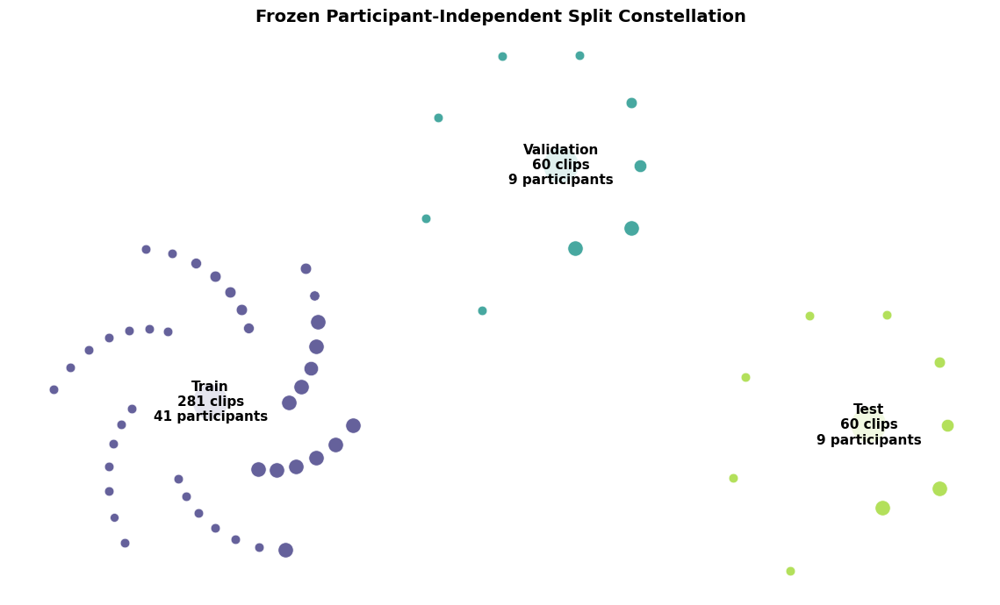

In [9]:
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch

VIR = mpl.colormaps["viridis"]

mpl.rcParams.update({
    "font.family": "DejaVu Sans",
    "font.weight": "bold",
    "axes.titleweight": "bold",
    "axes.labelweight": "bold",
    "axes.titlesize": 14,
    "axes.labelsize": 11,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
    "legend.fontsize": 10,
    "figure.titlesize": 15,
})

def make_figure_text_bold(fig):
    for ax in fig.axes:
        ax.title.set_fontweight("bold")
        ax.xaxis.label.set_fontweight("bold")
        ax.yaxis.label.set_fontweight("bold")

        for label in ax.get_xticklabels():
            label.set_fontweight("bold")
        for label in ax.get_yticklabels():
            label.set_fontweight("bold")

        for txt in ax.texts:
            txt.set_fontweight("bold")

        legend = ax.get_legend()
        if legend is not None:
            for txt in legend.get_texts():
                txt.set_fontweight("bold")
            if legend.get_title() is not None:
                legend.get_title().set_fontweight("bold")

def savefig(name):
    fig = plt.gcf()
    make_figure_text_bold(fig)
    plt.tight_layout()
    plt.savefig(
        FIG_DIR / f"{name}.png",
        dpi=300,
        bbox_inches="tight",
    )
    plt.show()

# Participant split constellation
fig, ax = plt.subplots(figsize=(11.5, 7))

centers = {
    "Train": (-2.3, 0.0),
    "Validation": (0.15, 1.55),
    "Test": (2.3, -0.15),
}

for j, (name, df) in enumerate([
    ("Train", train_manifest),
    ("Validation", val_manifest),
    ("Test", test_manifest),
]):
    cx, cy = centers[name]
    people = sorted(df.participant.unique())
    n = len(people)

    for i, pid in enumerate(people):
        ang = 2*np.pi*i/max(1, n)
        rr = 0.55 + 0.55*((i % 7)/6)

        x = cx + rr*np.cos(ang)
        y = cy + rr*np.sin(ang)

        count = int((df.participant == pid).sum())

        ax.scatter(
            x,
            y,
            s=35 + count*8,
            c=[VIR(.18 + .34*j)],
            alpha=.82,
            edgecolor="white",
            linewidth=.5,
        )

    ax.scatter(
        cx,
        cy,
        s=820,
        c=[VIR(.20 + .33*j)],
        alpha=.14,
        edgecolor="none",
    )

    ax.text(
        cx,
        cy,
        f"{name}\n{len(df)} clips\n{df.participant.nunique()} participants",
        ha="center",
        va="center",
        fontsize=11,
        weight="bold",
    )

ax.set_title(
    "Frozen Participant-Independent Split Constellation",
    weight="bold",
)
ax.axis("off")
savefig("01_split_constellation")

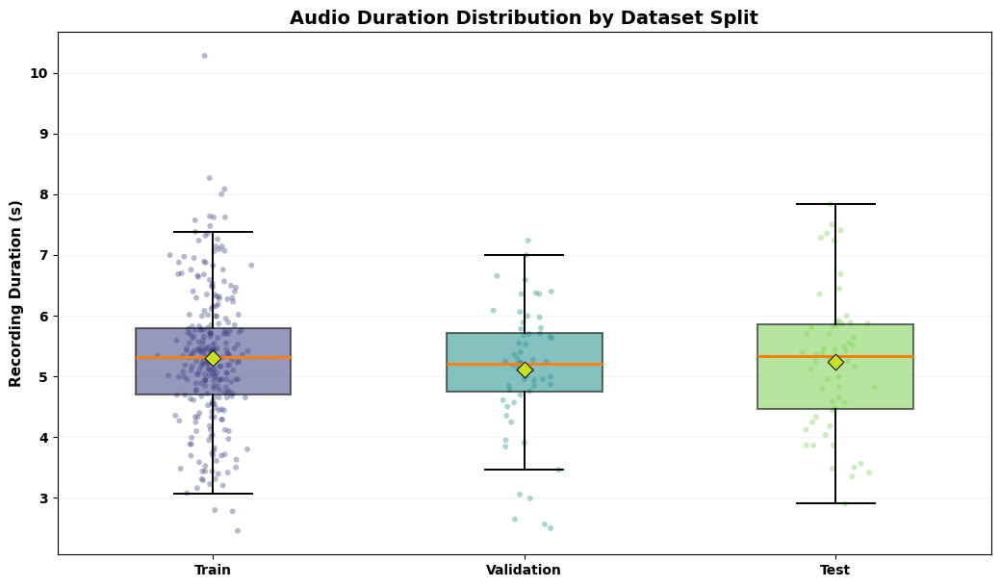

In [10]:
# Audio duration boxplot with individual recordings
if len(audio_qc) and "duration_s" in audio_qc.columns:
    split_map = {}

    for split_name, df in [
        ("Train", train_manifest),
        ("Validation", val_manifest),
        ("Test", test_manifest),
    ]:
        for sid in df.sample_id:
            split_map[str(sid)] = split_name

    qplot = audio_qc.copy()
    qplot["split"] = qplot.sample_id.astype(str).map(split_map)

    group_names = ["Train", "Validation", "Test"]

    groups = [
        qplot.loc[
            qplot.split == s,
            "duration_s",
        ].dropna().values
        for s in group_names
    ]

    fig, ax = plt.subplots(figsize=(10.5, 6.2))

    bp = ax.boxplot(
        groups,
        positions=[1,2,3],
        widths=.50,
        patch_artist=True,
        showfliers=False,
        medianprops=dict(linewidth=2.2),
        boxprops=dict(linewidth=1.5),
        whiskerprops=dict(linewidth=1.4),
        capprops=dict(linewidth=1.4),
    )

    for i, box in enumerate(bp["boxes"]):
        box.set_facecolor(VIR(.20 + .30*i))
        box.set_alpha(.55)

    rng = np.random.default_rng(7)

    for i, arr in enumerate(groups, start=1):
        jitter = rng.normal(i, .055, len(arr))

        ax.scatter(
            jitter,
            arr,
            s=18,
            alpha=.38,
            c=[VIR(.20 + .30*(i-1))],
            edgecolor="none",
        )

        if len(arr):
            ax.scatter(
                i,
                np.mean(arr),
                marker="D",
                s=72,
                c=[VIR(.92)],
                edgecolor="black",
                linewidth=.7,
                zorder=4,
            )

    ax.set_xticks([1,2,3], group_names)
    ax.set_ylabel("Recording Duration (s)")
    ax.set_title(
        "Audio Duration Distribution by Dataset Split",
        weight="bold",
    )
    ax.grid(axis="y", alpha=.14)

    savefig("02_duration_boxplot")

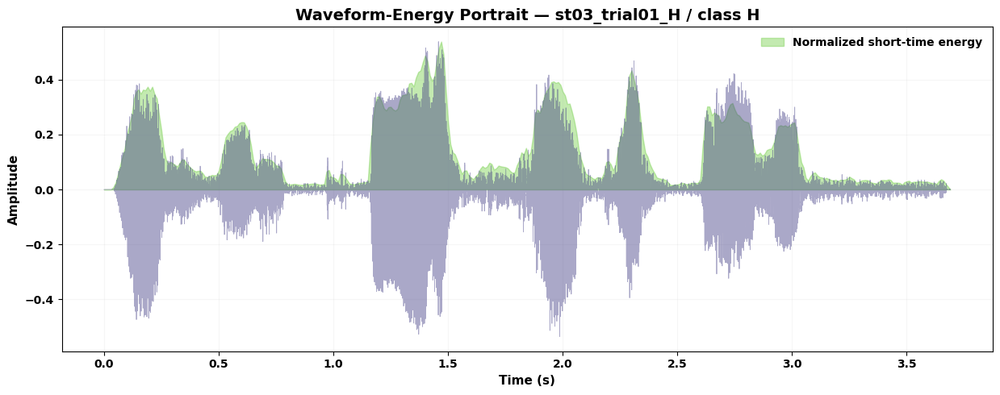

In [11]:
# Waveform-energy portrait
row = train_manifest.iloc[0]
wav = WAV_CACHE[str(row.sample_id)].numpy()
t = np.arange(len(wav))/SR
rms = librosa.feature.rms(
    y=wav,
    frame_length=400,
    hop_length=160,
)[0]
rt = librosa.frames_to_time(
    np.arange(len(rms)),
    sr=SR,
    hop_length=160,
)

fig, ax = plt.subplots(figsize=(12.5, 5))
ax.plot(t, wav, lw=.60, alpha=.45, color=VIR(.18))
if len(rms):
    scale = np.max(np.abs(wav)) / (np.max(rms)+1e-8)
    ax.fill_between(
        rt, 0, rms*scale,
        alpha=.45,
        color=VIR(.80),
        label="Normalized short-time energy",
    )
ax.set_xlabel("Time (s)")
ax.set_ylabel("Amplitude")
ax.set_title(
    f"Waveform-Energy Portrait — {row.sample_id} / class {row.class_code}",
    weight="bold",
)
ax.legend(frameon=False)
ax.grid(alpha=.10)
savefig("03_waveform_energy_portrait")

## Stage 8 — WavLM Data Pipeline

In [12]:
from transformers import AutoFeatureExtractor
from torch.utils.data import Dataset, DataLoader

feature_extractor = AutoFeatureExtractor.from_pretrained(CFG["model_name"])

def waveform_augment(wav, seed=None):
    if seed is not None:
        g = torch.Generator().manual_seed(seed)
    else:
        g = None

    x = wav.clone()

    if torch.rand((), generator=g).item() < 0.65:
        gain_db = -2.0 + 4.0*torch.rand((), generator=g).item()
        x = x * (10.0**(gain_db/20.0))

    if torch.rand((), generator=g).item() < 0.45:
        shift = int(
            (torch.rand((), generator=g).item()*0.10 - 0.05)
            * SR
        )
        x = torch.roll(x, shifts=shift)

    if torch.rand((), generator=g).item() < 0.35:
        snr_db = 20.0 + 10.0*torch.rand((), generator=g).item()
        sig = x.pow(2).mean().sqrt().clamp_min(1e-5)
        noise_std = sig / (10.0**(snr_db/20.0))
        x = x + torch.randn_like(x) * noise_std

    return x.clamp(-1, 1)

class EngagementDataset(Dataset):
    def __init__(self, manifest, global_x, quality, train=False):
        self.manifest = manifest.reset_index(drop=True).copy()
        self.global_x = torch.tensor(global_x, dtype=torch.float32)
        self.quality = torch.tensor(quality, dtype=torch.float32)
        self.train = train

    def __len__(self):
        return len(self.manifest)

    def __getitem__(self, idx):
        row = self.manifest.iloc[idx]
        sid = str(row.sample_id)

        wav = WAV_CACHE[sid].clone()
        if self.train:
            wav = waveform_augment(wav)

        return {
            "wav": wav,
            "global": self.global_x[idx],
            "quality": self.quality[idx],
            "label": int(row.label),
            "sample_id": sid,
            "audio_path": row.resolved_audio_path,
        }

def collate_batch(batch):
    wavs = [b["wav"].numpy() for b in batch]

    proc = feature_extractor(
        wavs,
        sampling_rate=SR,
        padding=True,
        return_attention_mask=True,
        return_tensors="pt",
    )

    return {
        "input_values": proc.input_values,
        "attention_mask": proc.attention_mask,
        "global": torch.stack([b["global"] for b in batch]),
        "quality": torch.stack([b["quality"] for b in batch]),
        "labels": torch.tensor(
            [b["label"] for b in batch],
            dtype=torch.long,
        ),
        "sample_ids": [b["sample_id"] for b in batch],
        "audio_paths": [b["audio_path"] for b in batch],
    }

train_ds = EngagementDataset(
    train_manifest, G_train, Q_train, train=True
)
val_ds = EngagementDataset(
    val_manifest, G_val, Q_val, train=False
)
test_ds = EngagementDataset(
    test_manifest, G_test, Q_test, train=False
)

def make_loader(ds, shuffle=False, batch_size=None):
    return DataLoader(
        ds,
        batch_size=batch_size or CFG["batch_size"],
        shuffle=shuffle,
        num_workers=0,
        pin_memory=True,
        collate_fn=collate_batch,
    )

train_loader = make_loader(train_ds, shuffle=True)
val_loader = make_loader(val_ds, shuffle=False)
test_loader = make_loader(test_ds, shuffle=False)

batch = next(iter(train_loader))
print({
    k: tuple(v.shape) if hasattr(v, "shape") else len(v)
    for k,v in batch.items()
})

preprocessor_config.json:   0%|          | 0.00/215 [00:00<?, ?B/s]

{'input_values': (4, 111568), 'attention_mask': (4, 111568), 'global': (4, 347), 'quality': (4, 5), 'labels': (4,), 'sample_ids': 4, 'audio_paths': 4}


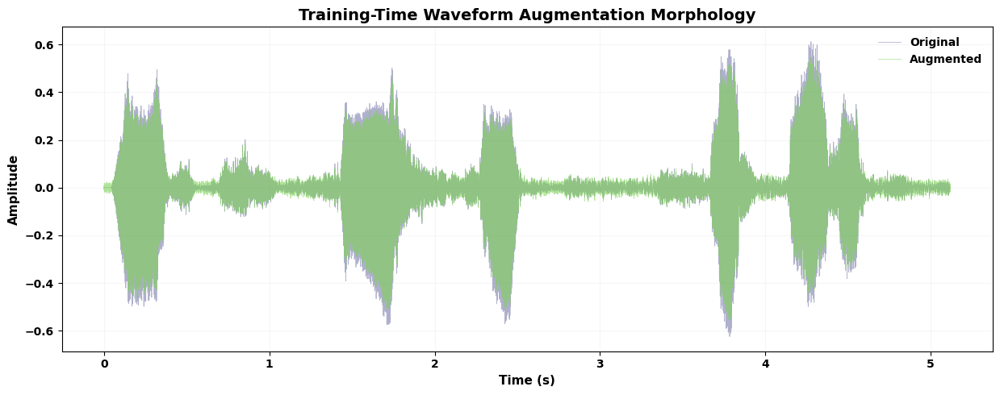

In [13]:
# Augmentation morphology
sample = WAV_CACHE[str(train_manifest.iloc[2].sample_id)]
aug = waveform_augment(sample, seed=2026)

t = np.arange(len(sample))/SR

fig, ax = plt.subplots(figsize=(12.5, 5))
ax.plot(
    t, sample.numpy(),
    lw=.55, alpha=.42,
    color=VIR(.20),
    label="Original",
)
ax.plot(
    t, aug.numpy(),
    lw=.55, alpha=.58,
    color=VIR(.80),
    label="Augmented",
)
ax.set_xlabel("Time (s)")
ax.set_ylabel("Amplitude")
ax.set_title("Training-Time Waveform Augmentation Morphology", weight="bold")
ax.legend(frameon=False)
ax.grid(alpha=.10)
savefig("04_waveform_augmentation")

## Stage 9 — WavLM-RAG Architecture

In [14]:
import torch.nn as nn
import torch.nn.functional as F
from transformers import WavLMModel

class AttentiveStatsPool(nn.Module):
    def __init__(self, d):
        super().__init__()
        self.score = nn.Sequential(
            nn.Linear(d, max(32, d//2)),
            nn.Tanh(),
            nn.Linear(max(32, d//2), 1),
        )
        self.out = nn.Sequential(
            nn.Linear(2*d, d),
            nn.LayerNorm(d),
        )

    def forward(self, x, mask=None):
        score = self.score(x).squeeze(-1)

        if mask is not None:
            score = score.masked_fill(
                ~mask.bool(),
                -1e4,
            )

        att = torch.softmax(score, dim=-1)
        mu = (x * att.unsqueeze(-1)).sum(1)

        var = (
            (x - mu.unsqueeze(1)).pow(2)
            * att.unsqueeze(-1)
        ).sum(1).clamp_min(1e-6)

        sd = torch.sqrt(var)

        return self.out(torch.cat([mu, sd], dim=-1)), att

def entropy_and_confidence(logits):
    p = torch.softmax(logits, dim=-1).clamp_min(1e-8)
    entropy = -(p * p.log()).sum(-1, keepdim=True)
    confidence = p.max(-1, keepdim=True).values
    return entropy, confidence

class WavLMRAG(nn.Module):
    def __init__(self, variant="full"):
        super().__init__()

        self.variant = variant
        d = int(CFG["d_model"])
        p = float(CFG["dropout"])

        if variant == "global_only":
            self.wavlm = None
            self.wav_proj = None
            self.wav_pool = None
        else:
            self.wavlm = WavLMModel.from_pretrained(CFG["model_name"])

            if hasattr(self.wavlm, "gradient_checkpointing_enable"):
                self.wavlm.gradient_checkpointing_enable()

            for par in self.wavlm.parameters():
                par.requires_grad = False

            if (
                CFG["wavlm_unfrozen_layers"] > 0
                and hasattr(self.wavlm, "encoder")
                and hasattr(self.wavlm.encoder, "layers")
            ):
                for layer in self.wavlm.encoder.layers[
                    -CFG["wavlm_unfrozen_layers"]:
                ]:
                    for par in layer.parameters():
                        par.requires_grad = True

            self.wav_proj = nn.Sequential(
                nn.Linear(self.wavlm.config.hidden_size, d),
                nn.LayerNorm(d),
                nn.Dropout(p),
            )
            self.wav_pool = AttentiveStatsPool(d)

        self.global_enc = nn.Sequential(
            nn.LayerNorm(GLOBAL_DIM),
            nn.Linear(GLOBAL_DIM, CFG["global_hidden"]),
            nn.GELU(),
            nn.Dropout(p),
            nn.Linear(CFG["global_hidden"], d),
            nn.LayerNorm(d),
            nn.GELU(),
            nn.Dropout(p*0.65),
        )

        self.wav_head = None if variant == "global_only" else nn.Linear(d, 3)
        self.global_head = nn.Linear(d, 3)

        gate_in = 2*d + QUALITY_DIM + 4

        self.alpha_context = nn.Sequential(
            nn.LayerNorm(gate_in),
            nn.Linear(gate_in, d),
            nn.GELU(),
            nn.Dropout(p),
            nn.Linear(d, 1),
        )

        # Zero initialization means the gate starts from alpha_init_logit only.
        nn.init.zeros_(self.alpha_context[-1].weight)
        nn.init.zeros_(self.alpha_context[-1].bias)

        self.alpha_bias = nn.Parameter(
            torch.tensor(float(CFG["alpha_init_logit"]))
        )

        self.out_norm = nn.LayerNorm(d)
        self.classifier = nn.Linear(d, 3)

    def encode_wavlm(self, input_values, attention_mask):
        out = self.wavlm(
            input_values=input_values,
            attention_mask=attention_mask,
        )

        h = self.wav_proj(out.last_hidden_state)

        if attention_mask is not None:
            feat_mask = self.wavlm._get_feature_vector_attention_mask(
                h.shape[1],
                attention_mask,
            )
        else:
            feat_mask = None

        z, att = self.wav_pool(h, feat_mask)
        return z, att

    def forward(
        self,
        input_values,
        attention_mask,
        global_x,
        quality,
        return_extras=False,
    ):
        variant = self.variant

        if variant == "global_only":
            zg = self.global_enc(global_x)
            z = self.out_norm(zg)
            global_logits = self.global_head(zg)
            logits = global_logits

            alpha = torch.ones(
                (len(z), 1),
                device=z.device,
                dtype=z.dtype,
            )

            extras = {
                "embedding": z,
                "wav_embedding": torch.zeros_like(z),
                "global_embedding": zg,
                "alpha": alpha,
                "wav_attention": None,
                "wav_logits": torch.zeros(
                    (len(z), 3),
                    device=z.device,
                    dtype=z.dtype,
                ),
                "global_logits": global_logits,
            }
            return logits, extras

        zw, wav_att = self.encode_wavlm(
            input_values,
            attention_mask,
        )

        wav_logits = self.wav_head(zw)

        if variant == "wavlm_only":
            z = self.out_norm(zw)
            logits = wav_logits

            alpha = torch.zeros(
                (len(z), 1),
                device=z.device,
                dtype=z.dtype,
            )

            extras = {
                "embedding": z,
                "wav_embedding": zw,
                "global_embedding": torch.zeros_like(zw),
                "alpha": alpha,
                "wav_attention": wav_att,
                "wav_logits": wav_logits,
                "global_logits": torch.zeros_like(wav_logits),
            }
            return logits, extras

        zg = self.global_enc(global_x)
        global_logits = self.global_head(zg)

        if (
            self.training
            and variant in {"adaptive_gate", "no_supcon", "full"}
            and torch.rand((), device=zg.device).item()
                < CFG["modality_dropout"]
        ):
            keep_global = torch.zeros(
                (len(zg), 1),
                device=zg.device,
                dtype=zg.dtype,
            )
        else:
            keep_global = torch.ones(
                (len(zg), 1),
                device=zg.device,
                dtype=zg.dtype,
            )

        zg_used = zg * keep_global

        if variant == "fixed_residual":
            alpha = torch.full(
                (len(zw), 1),
                float(CFG["fixed_residual_alpha"]),
                device=zw.device,
                dtype=zw.dtype,
            )
        else:
            ew, cw = entropy_and_confidence(wav_logits)
            eg, cg = entropy_and_confidence(global_logits)

            gate_context = torch.cat(
                [zw, zg_used, quality, ew, cw, eg, cg],
                dim=-1,
            )

            alpha = (
                float(CFG["max_residual_alpha"])
                * torch.sigmoid(
                    self.alpha_bias
                    + self.alpha_context(gate_context)
                )
            )

            alpha = alpha * keep_global

        z = self.out_norm(zw + alpha * zg_used)
        logits = self.classifier(z)

        extras = {
            "embedding": z,
            "wav_embedding": zw,
            "global_embedding": zg,
            "alpha": alpha,
            "wav_attention": wav_att,
            "wav_logits": wav_logits,
            "global_logits": global_logits,
        }

        return logits, extras

print("WavLM-RAG architecture defined.")

WavLM-RAG architecture defined.


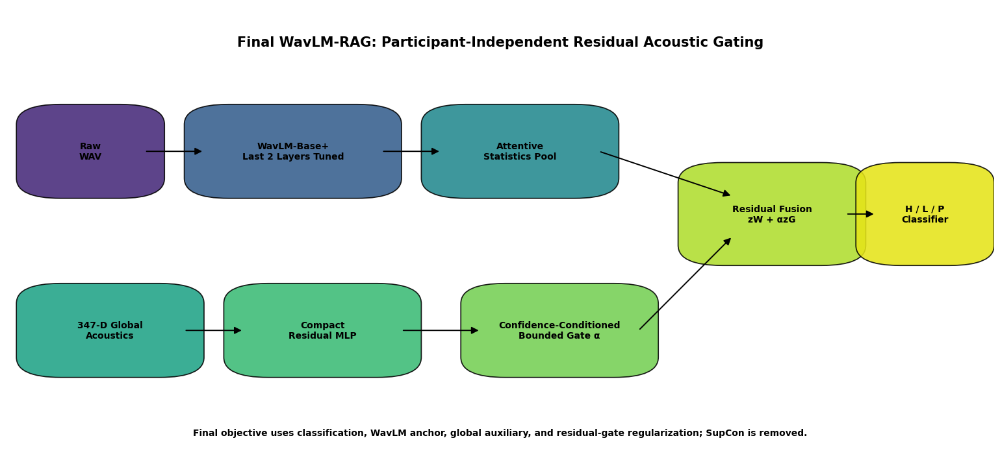

In [15]:
# Journal-style final architecture diagram
fig, ax = plt.subplots(figsize=(15.5, 7.2))
ax.axis("off")

def add_box(x, y, w, h, text, fc, fs=10):
    patch = FancyBboxPatch(
        (x,y),
        w,h,
        boxstyle="round,pad=0.02,rounding_size=0.045",
        linewidth=1.25,
        edgecolor="black",
        facecolor=fc,
        alpha=.88,
    )
    ax.add_patch(patch)

    ax.text(
        x+w/2,
        y+h/2,
        text,
        ha="center",
        va="center",
        fontsize=fs,
        weight="bold",
    )

def add_arrow(x1,y1,x2,y2):
    ax.add_patch(
        FancyArrowPatch(
            (x1,y1),
            (x2,y2),
            arrowstyle="-|>",
            mutation_scale=16,
            linewidth=1.4,
            color="black",
        )
    )

add_box(.03,.59,.11,.17,"Raw\nWAV",VIR(.12))
add_box(.20,.59,.18,.17,"WavLM-Base+\nLast 2 Layers Tuned",VIR(.30))
add_box(.44,.59,.16,.17,"Attentive\nStatistics Pool",VIR(.47))

add_box(.03,.19,.15,.17,"347-D Global\nAcoustics",VIR(.58))
add_box(.24,.19,.16,.17,"Compact\nResidual MLP",VIR(.68))
add_box(.48,.19,.16,.17,"Confidence-Conditioned\nBounded Gate α",VIR(.79))

add_box(.70,.44,.15,.19,"Residual Fusion\nzW + αzG",VIR(.88))
add_box(.88,.44,.10,.19,"H / L / P\nClassifier",VIR(.96))

add_arrow(.14,.675,.20,.675)
add_arrow(.38,.675,.44,.675)

add_arrow(.18,.275,.24,.275)
add_arrow(.40,.275,.48,.275)

add_arrow(.60,.675,.735,.575)
add_arrow(.64,.275,.735,.485)
add_arrow(.85,.535,.88,.535)

ax.text(
    .50,
    .91,
    "Final WavLM-RAG: Participant-Independent Residual Acoustic Gating",
    ha="center",
    fontsize=15,
    weight="bold",
)

ax.text(
    .50,
    .04,
    "Final objective uses classification, WavLM anchor, global auxiliary, and residual-gate regularization; SupCon is removed.",
    ha="center",
    fontsize=10,
    weight="bold",
)

savefig("05_final_wavlm_rag_architecture")

## Stage 10 — Metrics, Selection Rule, and Resume-Safe Checkpoints

In [16]:
from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_recall_fscore_support,
    log_loss,
    roc_auc_score,
    confusion_matrix,
    roc_curve,
    auc,
    precision_recall_curve,
)

def metric_dict(y_true, prob):
    pred = np.asarray(prob).argmax(1)

    precision, recall, macro_f1, _ = (
        precision_recall_fscore_support(
            y_true,
            pred,
            average="macro",
            zero_division=0,
        )
    )

    weighted_f1 = precision_recall_fscore_support(
        y_true,
        pred,
        average="weighted",
        zero_division=0,
    )[2]

    metrics = {
        "accuracy": float(accuracy_score(y_true, pred)),
        "balanced_accuracy": float(
            balanced_accuracy_score(y_true, pred)
        ),
        "macro_precision": float(precision),
        "macro_recall": float(recall),
        "macro_f1": float(macro_f1),
        "weighted_f1": float(weighted_f1),
        "log_loss": float(
            log_loss(
                y_true,
                np.clip(prob, 1e-8, 1-1e-8),
                labels=[0,1,2],
            )
        ),
    }

    try:
        metrics["roc_auc_macro_ovr"] = float(
            roc_auc_score(
                y_true,
                prob,
                multi_class="ovr",
                average="macro",
                labels=[0,1,2],
            )
        )
    except Exception:
        metrics["roc_auc_macro_ovr"] = np.nan

    return metrics

def selection_score(metrics):
    auc_value = metrics["roc_auc_macro_ovr"]
    if np.isnan(auc_value):
        auc_value = 0.0

    return float(
        0.60*metrics["macro_f1"]
        + 0.25*metrics["balanced_accuracy"]
        + 0.15*auc_value
    )

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

DEVICE = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

if DEVICE.type == "cuda":
    torch.backends.cuda.matmul.allow_tf32 = True
    print("GPU:", torch.cuda.get_device_name(0))
else:
    print("WARNING: GPU is strongly recommended.")

selection_audit = {
    "checkpoint_selection_source": "validation only",
    "selection_score": (
        "0.60 Macro-F1 + 0.25 balanced accuracy + 0.15 macro AUC"
    ),
    "test_used_for_checkpoint_selection": False,
    "predeclared_80_percent_target_used_for_selection": False,
}
json.dump(
    selection_audit,
    open(RESULTS / "model_selection_audit.json", "w"),
    indent=2,
)

GPU: Tesla T4


In [17]:
def supervised_contrastive_loss(
    z,
    labels,
    temperature=0.10,
):
    z = F.normalize(z, dim=-1)

    sim = z @ z.T / temperature

    eye = torch.eye(
        len(z),
        device=z.device,
        dtype=torch.bool,
    )

    sim = sim.masked_fill(eye, -1e4)

    positive = (
        labels[:,None] == labels[None,:]
    ) & (~eye)

    valid = positive.sum(1) > 0

    if valid.sum() == 0:
        return z.new_tensor(0.0)

    log_prob = (
        sim
        - torch.logsumexp(
            sim,
            dim=1,
            keepdim=True,
        )
    )

    per_anchor = -(
        log_prob * positive.float()
    ).sum(1) / positive.sum(1).clamp_min(1)

    return per_anchor[valid].mean()

def trainable_state_dict(model):
    return {
        name: parameter.detach().cpu()
        for name, parameter in model.named_parameters()
        if parameter.requires_grad
    }

def load_trainable_state(model, state):
    named = dict(model.named_parameters())

    for name, value in state.items():
        if name not in named:
            raise KeyError(
                f"Checkpoint parameter not found: {name}"
            )

        named[name].data.copy_(
            value.to(
                named[name].device,
                dtype=named[name].dtype,
            )
        )

LOCAL_STAGE = Path("/content/wavlm_rag_ckpt_stage")
LOCAL_STAGE.mkdir(parents=True, exist_ok=True)

def drive_safe_save(
    obj,
    drive_path,
    retries=6,
):
    drive_path = Path(drive_path)
    drive_path.parent.mkdir(parents=True, exist_ok=True)

    local_path = (
        LOCAL_STAGE
        / f"{drive_path.stem}_{uuid.uuid4().hex}.pt"
    )

    torch.save(obj, local_path)

    expected_size = local_path.stat().st_size
    last_error = None

    for attempt in range(1, retries+1):
        try:
            with open(local_path, "rb") as src, \
                 open(drive_path, "wb") as dst:
                shutil.copyfileobj(
                    src,
                    dst,
                    length=16*1024*1024,
                )
                dst.flush()

            actual_size = drive_path.stat().st_size

            if actual_size != expected_size:
                raise IOError(
                    f"Checkpoint size mismatch: "
                    f"{expected_size} vs {actual_size}"
                )

            local_path.unlink(missing_ok=True)
            return True

        except Exception as exc:
            last_error = exc
            print(
                f"Drive checkpoint retry "
                f"{attempt}/{retries}: "
                f"{type(exc).__name__}: {exc}"
            )
            time.sleep(min(2**attempt, 12))

    print(
        "WARNING: checkpoint copy to Drive failed. "
        "The previous A/B checkpoint remains valid."
    )
    print("Local staged checkpoint:", local_path)
    print("Last error:", last_error)
    return False

def safe_load(path, map_location="cpu"):
    path = Path(path)

    if not path.exists():
        return None

    try:
        return torch.load(
            path,
            map_location=map_location,
            weights_only=False,
        )
    except Exception as exc:
        print(
            "Ignoring unreadable checkpoint:",
            path.name,
            "|",
            type(exc).__name__,
            exc,
        )
        return None

def latest_resume_checkpoint(tag):
    candidates = [
        CKPT_DIR / f"{tag}_last_A.pt",
        CKPT_DIR / f"{tag}_last_B.pt",
    ]

    valid = []

    for p in candidates:
        state = safe_load(p, "cpu")
        if state is not None and "epoch" in state:
            valid.append((int(state["epoch"]), p))

    if not valid:
        return None

    valid.sort(key=lambda x:x[0], reverse=True)
    return valid[0][1]

def restore_rng(state):
    if "rng_torch" in state:
        torch.set_rng_state(state["rng_torch"])

    if (
        state.get("rng_cuda") is not None
        and torch.cuda.is_available()
    ):
        torch.cuda.set_rng_state_all(
            state["rng_cuda"]
        )

    if "rng_numpy" in state:
        np.random.set_state(state["rng_numpy"])

    if "rng_python" in state:
        random.setstate(state["rng_python"])

print("Disconnect-safe checkpoint engine ready.")

Disconnect-safe checkpoint engine ready.


## Stage 11 — Training Engine

In [18]:
from torch.optim import AdamW
from torch.optim.lr_scheduler import CosineAnnealingLR

def build_model(variant="full"):
    return WavLMRAG(variant=variant)

def make_optimizer(model):
    wavlm_params = []
    head_params = []

    for name, parameter in model.named_parameters():
        if not parameter.requires_grad:
            continue

        if name.startswith("wavlm."):
            wavlm_params.append(parameter)
        else:
            head_params.append(parameter)

    groups = []

    if wavlm_params:
        groups.append({
            "params": wavlm_params,
            "lr": CFG["wavlm_lr"],
        })

    if head_params:
        groups.append({
            "params": head_params,
            "lr": CFG["head_lr"],
        })

    return AdamW(
        groups,
        weight_decay=CFG["weight_decay"],
    )

def move_batch(batch):
    return {
        "input_values": batch["input_values"].to(
            DEVICE,
            non_blocking=True,
        ),
        "attention_mask": batch["attention_mask"].to(
            DEVICE,
            non_blocking=True,
        ),
        "global": batch["global"].to(
            DEVICE,
            non_blocking=True,
        ),
        "quality": batch["quality"].to(
            DEVICE,
            non_blocking=True,
        ),
        "labels": batch["labels"].to(
            DEVICE,
            non_blocking=True,
        ),
        "sample_ids": batch["sample_ids"],
    }

@torch.no_grad()
def predict_loader(
    model,
    loader,
    return_extras=False,
):
    model.eval()

    probs = []
    ys = []
    ids = []

    embeddings = []
    alphas = []
    wav_attentions = []

    for batch in tqdm(loader, leave=False):
        b = move_batch(batch)

        logits, extras = model(
            b["input_values"],
            b["attention_mask"],
            b["global"],
            b["quality"],
            return_extras=return_extras,
        )

        probs.append(
            torch.softmax(
                logits,
                dim=-1,
            ).cpu().numpy()
        )

        ys.append(
            b["labels"].cpu().numpy()
        )

        ids.extend(b["sample_ids"])

        if return_extras:
            embeddings.append(
                extras["embedding"].cpu().numpy()
            )
            alphas.append(
                extras["alpha"].cpu().numpy()
            )

            if extras["wav_attention"] is not None:
                # Attention sequence length varies across batches because
                # waveform batches are dynamically padded. Store one trimmed
                # attention vector per recording instead of concatenating
                # rectangular batch arrays with different time dimensions.
                att_batch = extras["wav_attention"].detach()
                feat_mask = model.wavlm._get_feature_vector_attention_mask(
                    att_batch.shape[1],
                    b["attention_mask"],
                )

                att_batch = att_batch.cpu().numpy()
                feat_mask = feat_mask.cpu().numpy().astype(bool)

                for att_i, mask_i in zip(att_batch, feat_mask):
                    wav_attentions.append(
                        np.asarray(att_i[mask_i], dtype=np.float32)
                    )

    out = {
        "prob": np.concatenate(probs),
        "y": np.concatenate(ys),
        "ids": ids,
    }

    if return_extras:
        out["embedding"] = np.concatenate(embeddings)
        out["alpha"] = np.concatenate(alphas).reshape(-1)

        if wav_attentions:
            # Ragged list: one valid-frame attention vector per recording.
            out["wav_attention"] = wav_attentions

    return out

def train_one(
    seed,
    variant="full",
    epochs=None,
    patience=None,
    tag=None,
    train_loader_=None,
    val_loader_=None,
    test_loader_=None,
    resume=True,
):
    set_seed(seed)

    epochs = int(epochs or CFG["epochs"])
    patience = int(patience or CFG["patience"])
    tag = tag or f"{variant}_seed{seed}"

    train_loader_ = train_loader_ or train_loader
    val_loader_ = val_loader_ or val_loader
    test_loader_ = test_loader_ or test_loader

    model = build_model(variant).to(DEVICE)

    optimizer = make_optimizer(model)

    scheduler = CosineAnnealingLR(
        optimizer,
        T_max=max(1, epochs),
    )

    scaler = torch.amp.GradScaler(
        "cuda",
        enabled=(DEVICE.type == "cuda"),
    )

    ce = nn.CrossEntropyLoss(
        label_smoothing=CFG["label_smoothing"]
    )

    best_score = -1e9
    best_epoch = -1
    bad = 0
    history = []
    best_trainable = None
    start_epoch = 1

    best_ckpt = CKPT_DIR / f"{tag}_best.pt"
    last_A = CKPT_DIR / f"{tag}_last_A.pt"
    last_B = CKPT_DIR / f"{tag}_last_B.pt"

    resume_path = (
        latest_resume_checkpoint(tag)
        if resume
        else None
    )

    if resume_path is not None:
        state = safe_load(
            resume_path,
            map_location="cpu",
        )

        if state is None:
            raise RuntimeError(
                f"Resume checkpoint became unreadable: "
                f"{resume_path}"
            )

        load_trainable_state(
            model,
            state["trainable_state"],
        )

        optimizer.load_state_dict(
            state["optimizer_state"]
        )
        scheduler.load_state_dict(
            state["scheduler_state"]
        )
        scaler.load_state_dict(
            state["scaler_state"]
        )

        best_score = float(state["best_score"])
        best_epoch = int(state["best_epoch"])
        bad = int(state["bad"])
        history = list(
            state.get("history", [])
        )

        best_trainable = state.get(
            "best_trainable_state",
            None,
        )

        if best_trainable is None:
            best_file = safe_load(
                best_ckpt,
                "cpu",
            )
            if best_file is not None:
                best_trainable = best_file.get(
                    "trainable_state",
                    None,
                )

        start_epoch = int(state["epoch"]) + 1

        restore_rng(state)

        print(
            f"{tag}: RESUME from epoch "
            f"{start_epoch} using "
            f"{resume_path.name}"
        )

    for epoch in range(
        start_epoch,
        epochs+1,
    ):
        model.train()
        optimizer.zero_grad(set_to_none=True)

        totals = {
            "loss": 0.0,
            "classification": 0.0,
            "wav_anchor": 0.0,
            "global_aux": 0.0,
            "supcon": 0.0,
            "alpha_penalty": 0.0,
        }

        seen = 0

        for step, batch in enumerate(
            tqdm(
                train_loader_,
                desc=f"{tag} E{epoch}",
                leave=False,
            ),
            start=1,
        ):
            b = move_batch(batch)

            with torch.amp.autocast(
                "cuda",
                enabled=(DEVICE.type == "cuda"),
            ):
                logits, extras = model(
                    b["input_values"],
                    b["attention_mask"],
                    b["global"],
                    b["quality"],
                    return_extras=True,
                )

                loss_cls = ce(
                    logits,
                    b["labels"],
                )

                if variant == "global_only":
                    # Main classification loss already supervises the global branch.
                    loss_wav = logits.new_tensor(0.0)
                    loss_global = logits.new_tensor(0.0)
                elif variant == "wavlm_only":
                    # Main classification loss is exactly the WavLM head.
                    loss_wav = logits.new_tensor(0.0)
                    loss_global = logits.new_tensor(0.0)
                else:
                    loss_wav = ce(
                        extras["wav_logits"],
                        b["labels"],
                    )
                    loss_global = ce(
                        extras["global_logits"],
                        b["labels"],
                    )

                if variant == "full":
                    loss_supcon = supervised_contrastive_loss(
                        extras["embedding"],
                        b["labels"],
                        CFG["supcon_temperature"],
                    )
                else:
                    loss_supcon = logits.new_tensor(0.0)

                if variant in {
                    "fixed_residual",
                    "adaptive_gate",
                    "no_supcon",
                    "full",
                }:
                    loss_alpha = (
                        extras["alpha"].pow(2).mean()
                    )
                else:
                    loss_alpha = logits.new_tensor(0.0)

                loss = (
                    loss_cls
                    + CFG["wavlm_anchor_loss_weight"]*loss_wav
                    + CFG["global_aux_loss_weight"]*loss_global
                    + CFG["supcon_weight"]*loss_supcon
                    + CFG["residual_penalty_weight"]*loss_alpha
                ) / CFG["grad_accum"]

            scaler.scale(loss).backward()

            if (
                step % CFG["grad_accum"] == 0
                or step == len(train_loader_)
            ):
                scaler.unscale_(optimizer)

                torch.nn.utils.clip_grad_norm_(
                    [
                        p
                        for p in model.parameters()
                        if p.requires_grad
                    ],
                    1.0,
                )

                scaler.step(optimizer)
                scaler.update()
                optimizer.zero_grad(set_to_none=True)

            bs = len(b["labels"])

            totals["loss"] += (
                float(loss.detach().cpu())
                * CFG["grad_accum"]
                * bs
            )

            totals["classification"] += (
                float(loss_cls.detach().cpu())
                * bs
            )
            totals["wav_anchor"] += (
                float(loss_wav.detach().cpu())
                * bs
            )
            totals["global_aux"] += (
                float(loss_global.detach().cpu())
                * bs
            )
            totals["supcon"] += (
                float(loss_supcon.detach().cpu())
                * bs
            )
            totals["alpha_penalty"] += (
                float(loss_alpha.detach().cpu())
                * bs
            )

            seen += bs

        scheduler.step()

        val_out = predict_loader(
            model,
            val_loader_,
        )

        val_metrics = metric_dict(
            val_out["y"],
            val_out["prob"],
        )

        score = selection_score(
            val_metrics
        )

        record = {
            "epoch": int(epoch),
            "train_loss": totals["loss"]/max(1,seen),
            "classification_loss": (
                totals["classification"]/max(1,seen)
            ),
            "wav_anchor_loss": (
                totals["wav_anchor"]/max(1,seen)
            ),
            "global_aux_loss": (
                totals["global_aux"]/max(1,seen)
            ),
            "supcon_loss": (
                totals["supcon"]/max(1,seen)
            ),
            "alpha_penalty": (
                totals["alpha_penalty"]/max(1,seen)
            ),
            **{
                f"val_{k}":v
                for k,v in val_metrics.items()
            },
            "selection_score": float(score),
        }

        history.append(record)

        if score > best_score + 1e-5:
            best_score = float(score)
            best_epoch = int(epoch)
            bad = 0

            best_trainable = trainable_state_dict(
                model
            )

            drive_safe_save(
                {
                    "trainable_state": best_trainable,
                    "seed": int(seed),
                    "variant": str(variant),
                    "best_epoch": int(best_epoch),
                    "best_score": float(best_score),
                },
                best_ckpt,
            )
        else:
            bad += 1

        rolling = (
            last_A
            if epoch % 2 == 0
            else last_B
        )

        drive_safe_save(
            {
                "trainable_state": trainable_state_dict(model),
                "optimizer_state": optimizer.state_dict(),
                "scheduler_state": scheduler.state_dict(),
                "scaler_state": scaler.state_dict(),
                "seed": int(seed),
                "variant": str(variant),
                "epoch": int(epoch),
                "best_score": float(best_score),
                "best_epoch": int(best_epoch),
                "best_trainable_state": best_trainable,
                "bad": int(bad),
                "history": history,
                "rng_torch": torch.get_rng_state(),
                "rng_cuda": (
                    torch.cuda.get_rng_state_all()
                    if torch.cuda.is_available()
                    else None
                ),
                "rng_numpy": np.random.get_state(),
                "rng_python": random.getstate(),
            },
            rolling,
        )

        pd.DataFrame(history).to_csv(
            RESULTS / f"{tag}_history.csv",
            index=False,
        )

        print(
            f"{tag} | epoch {epoch:02d} "
            f"| loss {record['train_loss']:.4f} "
            f"| val F1 {val_metrics['macro_f1']:.4f} "
            f"| val AUC {val_metrics['roc_auc_macro_ovr']:.4f}"
        )

        if bad >= patience:
            print("Early stopping.")
            break

    best_file = safe_load(
        best_ckpt,
        map_location="cpu",
    )

    if best_file is not None:
        best_trainable = best_file[
            "trainable_state"
        ]
    elif best_trainable is not None:
        # Final retry so a completed run has a persistent best checkpoint.
        drive_safe_save(
            {
                "trainable_state": best_trainable,
                "seed": int(seed),
                "variant": str(variant),
                "best_epoch": int(best_epoch),
                "best_score": float(best_score),
            },
            best_ckpt,
        )

    if best_trainable is None:
        raise RuntimeError(
            "No validation-selected best state "
            "could be recovered."
        )

    load_trainable_state(
        model,
        best_trainable,
    )

    val_out = predict_loader(
        model,
        val_loader_,
    )
    test_out = predict_loader(
        model,
        test_loader_,
    )

    val_metrics = metric_dict(
        val_out["y"],
        val_out["prob"],
    )
    test_metrics = metric_dict(
        test_out["y"],
        test_out["prob"],
    )

    metrics = {
        **test_metrics,
        "validation_score": float(best_score),
        "val_accuracy": float(
            val_metrics["accuracy"]
        ),
        "val_balanced_accuracy": float(
            val_metrics["balanced_accuracy"]
        ),
        "val_macro_f1": float(
            val_metrics["macro_f1"]
        ),
        "val_roc_auc_macro_ovr": float(
            val_metrics["roc_auc_macro_ovr"]
        ),
        "seed": int(seed),
        "variant": str(variant),
        "best_epoch": int(best_epoch),
    }

    np.savez_compressed(
        RESULTS / f"{tag}_predictions.npz",
        val_prob=val_out["prob"],
        val_y=val_out["y"],
        test_prob=test_out["prob"],
        test_y=test_out["y"],
        test_ids=np.array(
            test_out["ids"],
            dtype=object,
        ),
    )

    json.dump(
        metrics,
        open(
            RESULTS / f"{tag}_metrics.json",
            "w",
        ),
        indent=2,
    )

    pd.DataFrame(history).to_csv(
        RESULTS / f"{tag}_history.csv",
        index=False,
    )

    for p in [last_A, last_B]:
        try:
            if p.exists():
                p.unlink()
        except Exception:
            pass

    del model
    gc.collect()

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    return (
        metrics,
        pd.DataFrame(history),
        val_out["prob"],
        test_out["prob"],
        best_ckpt,
    )

## Stage 12 — Classical Baselines on the Frozen Split

In [19]:
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import (
    ExtraTreesClassifier,
    RandomForestClassifier,
)

classical_rows = []
classical_probs = {}

if CFG["run_classical_baselines"]:
    classical_models = {
        "SVM-RBF": SVC(
            C=2.0,
            kernel="rbf",
            gamma="scale",
            probability=True,
            random_state=42,
        ),
        "LogisticRegression": LogisticRegression(
            max_iter=4000,
            C=1.0,
            random_state=42,
        ),
        "ExtraTrees": ExtraTreesClassifier(
            n_estimators=700,
            max_features="sqrt",
            min_samples_leaf=2,
            class_weight="balanced",
            random_state=42,
            n_jobs=-1,
        ),
        "RandomForest": RandomForestClassifier(
            n_estimators=700,
            max_features="sqrt",
            min_samples_leaf=2,
            class_weight="balanced",
            random_state=42,
            n_jobs=-1,
        ),
    }

    try:
        from xgboost import XGBClassifier

        classical_models["XGBoost"] = XGBClassifier(
            n_estimators=500,
            max_depth=4,
            learning_rate=.04,
            subsample=.85,
            colsample_bytree=.85,
            objective="multi:softprob",
            eval_metric="mlogloss",
            random_state=42,
            n_jobs=-1,
        )
    except Exception:
        pass

    for name, clf in classical_models.items():
        clf.fit(G_train, y_train)
        prob = clf.predict_proba(G_test)

        classical_probs[name] = prob
        classical_rows.append({
            "model": name,
            **metric_dict(y_test, prob),
        })

classical_df = pd.DataFrame(
    classical_rows
).sort_values(
    "macro_f1",
    ascending=False,
)

classical_df.to_csv(
    RESULTS / "classical_baselines.csv",
    index=False,
)

display(classical_df)

,model,accuracy,balanced_accuracy,macro_precision,macro_recall,macro_f1,weighted_f1,log_loss,roc_auc_macro_ovr
0,SVM-RBF,0.733333,0.733333,0.766789,0.733333,0.734471,0.734471,0.715037,0.864583
4,XGBoost,0.700000,0.700000,0.705118,0.700000,0.700359,0.700359,0.774386,0.870000
1,LogisticRegression,0.683333,0.683333,0.704212,0.683333,0.683078,0.683078,0.975313,0.865000
3,RandomForest,0.650000,0.650000,0.648063,0.650000,0.647072,0.647072,0.786739,0.854167
2,ExtraTrees,0.650000,0.650000,0.646371,0.650000,0.644827,0.644827,0.803592,0.864167


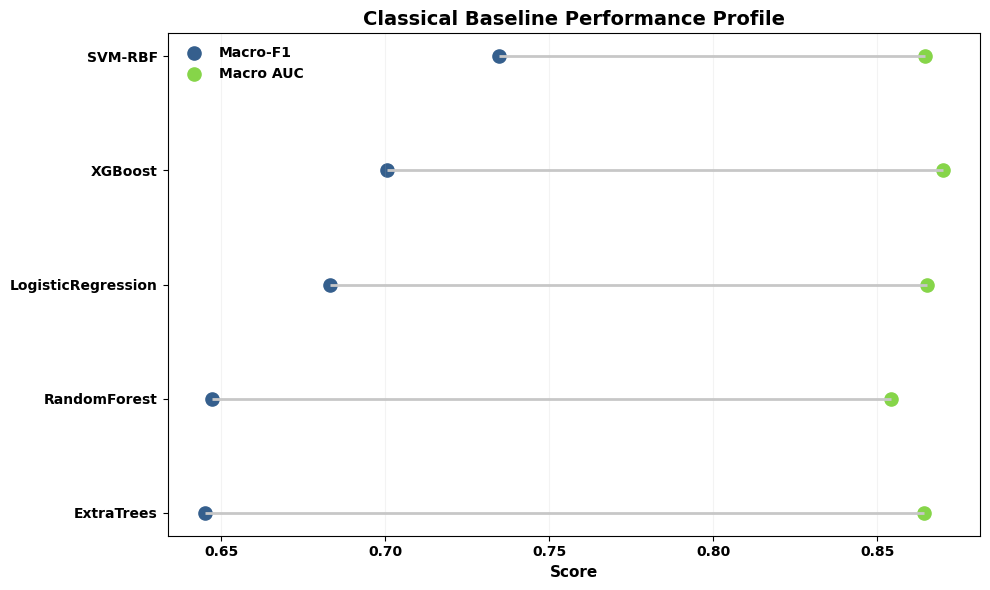

In [20]:
# Cleveland paired-dot classical profile
if len(classical_df):
    d = classical_df.sort_values(
        "macro_f1"
    ).reset_index(drop=True)

    fig, ax = plt.subplots(figsize=(10, 6))

    ypos = np.arange(len(d))

    ax.hlines(
        ypos,
        d.macro_f1,
        d.roc_auc_macro_ovr,
        color="0.78",
        lw=2,
    )

    ax.scatter(
        d.macro_f1,
        ypos,
        s=90,
        c=[VIR(.30)],
        label="Macro-F1",
    )

    ax.scatter(
        d.roc_auc_macro_ovr,
        ypos,
        s=90,
        c=[VIR(.82)],
        label="Macro AUC",
    )

    ax.set_yticks(ypos, d.model)
    ax.set_xlabel("Score")
    ax.set_title(
        "Classical Baseline Performance Profile",
        weight="bold",
    )
    ax.legend(frameon=False)
    ax.grid(axis="x", alpha=.14)

    savefig("06_classical_cleveland")

## Stage 13 — WavLM Reference Reproduction

In [21]:
reference_rows = []
reference_probs = {}
reference_ckpts = {}

if CFG["run_wavlm_reference"]:
    for name, variant in [
        ("WavLMOnly", "wavlm_only"),
        ("GlobalMLP", "global_only"),
    ]:
        print("\n" + "="*88)
        print(name)

        m, h, vp, tp, ck = train_one(
            seed=42,
            variant=variant,
            epochs=CFG["epochs"],
            patience=CFG["patience"],
            tag=f"reference_{name}",
            resume=True,
        )

        reference_rows.append({
            "model": name,
            **m,
        })
        reference_probs[name] = tp
        reference_ckpts[name] = ck

reference_df = pd.DataFrame(
    reference_rows
)

reference_df.to_csv(
    RESULTS / "reference_deep_baselines.csv",
    index=False,
)

display(reference_df)

print(
    "The WavLMOnly result above is the current-run reference. "
    "No test metric is used to change epochs, checkpoints, or preprocessing."
)


WavLMOnly


config.json:   0%|          | 0.00/2.23k [00:00<?, ?B/s]

pytorch_model.bin: reconstructing file:   0%|          |  0.00B /  378MB            

pytorch_model.bin: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/248 [00:00<?, ?it/s]

model.safetensors: reconstructing file:   0%|          |  0.00B /  378MB            

model.safetensors: downloading bytes:           |  0.00B            

reference_WavLMOnly E1:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 01 | loss 0.9726 | val F1 0.6553 | val AUC 0.8692


reference_WavLMOnly E2:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 02 | loss 0.8622 | val F1 0.7935 | val AUC 0.9375


reference_WavLMOnly E3:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 03 | loss 0.7293 | val F1 0.7946 | val AUC 0.9388


reference_WavLMOnly E4:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 04 | loss 0.7375 | val F1 0.7734 | val AUC 0.9362


reference_WavLMOnly E5:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 05 | loss 0.7074 | val F1 0.7599 | val AUC 0.9321


reference_WavLMOnly E6:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 06 | loss 0.6439 | val F1 0.7485 | val AUC 0.9246


reference_WavLMOnly E7:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 07 | loss 0.5659 | val F1 0.8055 | val AUC 0.9379


reference_WavLMOnly E8:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 08 | loss 0.5536 | val F1 0.7762 | val AUC 0.9308


reference_WavLMOnly E9:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 09 | loss 0.4858 | val F1 0.8148 | val AUC 0.9383


reference_WavLMOnly E10:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 10 | loss 0.5140 | val F1 0.6638 | val AUC 0.9129


reference_WavLMOnly E11:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 11 | loss 0.5119 | val F1 0.8007 | val AUC 0.9329


reference_WavLMOnly E12:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 12 | loss 0.4337 | val F1 0.7160 | val AUC 0.9313


reference_WavLMOnly E13:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 13 | loss 0.4269 | val F1 0.7576 | val AUC 0.9350


reference_WavLMOnly E14:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 14 | loss 0.3650 | val F1 0.7342 | val AUC 0.9337


reference_WavLMOnly E15:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 15 | loss 0.3572 | val F1 0.7812 | val AUC 0.9279


reference_WavLMOnly E16:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 16 | loss 0.3435 | val F1 0.8342 | val AUC 0.9313


reference_WavLMOnly E17:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 17 | loss 0.2854 | val F1 0.7598 | val AUC 0.9396


reference_WavLMOnly E18:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 18 | loss 0.3118 | val F1 0.8690 | val AUC 0.9292


reference_WavLMOnly E19:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 19 | loss 0.2873 | val F1 0.7542 | val AUC 0.9362


reference_WavLMOnly E20:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 20 | loss 0.2655 | val F1 0.8664 | val AUC 0.9217


reference_WavLMOnly E21:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 21 | loss 0.2871 | val F1 0.8501 | val AUC 0.9221


reference_WavLMOnly E22:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 22 | loss 0.2573 | val F1 0.7833 | val AUC 0.9171


reference_WavLMOnly E23:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 23 | loss 0.2464 | val F1 0.8510 | val AUC 0.9271


reference_WavLMOnly E24:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 24 | loss 0.2627 | val F1 0.8677 | val AUC 0.9354


reference_WavLMOnly E25:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 25 | loss 0.2309 | val F1 0.8089 | val AUC 0.9392


reference_WavLMOnly E26:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 26 | loss 0.2231 | val F1 0.8155 | val AUC 0.9354


reference_WavLMOnly E27:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 27 | loss 0.2245 | val F1 0.7119 | val AUC 0.9325


reference_WavLMOnly E28:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 28 | loss 0.2402 | val F1 0.7587 | val AUC 0.9271


reference_WavLMOnly E29:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 29 | loss 0.2488 | val F1 0.8510 | val AUC 0.9163


reference_WavLMOnly E30:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 30 | loss 0.2191 | val F1 0.8155 | val AUC 0.9188


reference_WavLMOnly E31:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 31 | loss 0.2079 | val F1 0.8155 | val AUC 0.9183


reference_WavLMOnly E32:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_WavLMOnly | epoch 32 | loss 0.2164 | val F1 0.8155 | val AUC 0.9192
Early stopping.


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]


GlobalMLP


reference_GlobalMLP E1:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_GlobalMLP | epoch 01 | loss 1.0688 | val F1 0.6182 | val AUC 0.7817


reference_GlobalMLP E2:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_GlobalMLP | epoch 02 | loss 0.7999 | val F1 0.7007 | val AUC 0.8471


reference_GlobalMLP E3:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_GlobalMLP | epoch 03 | loss 0.6228 | val F1 0.7341 | val AUC 0.8829


reference_GlobalMLP E4:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_GlobalMLP | epoch 04 | loss 0.4607 | val F1 0.7338 | val AUC 0.9121


reference_GlobalMLP E5:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_GlobalMLP | epoch 05 | loss 0.3354 | val F1 0.7333 | val AUC 0.9342


reference_GlobalMLP E6:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_GlobalMLP | epoch 06 | loss 0.2458 | val F1 0.7860 | val AUC 0.9458


reference_GlobalMLP E7:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_GlobalMLP | epoch 07 | loss 0.1982 | val F1 0.8197 | val AUC 0.9371


reference_GlobalMLP E8:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_GlobalMLP | epoch 08 | loss 0.1830 | val F1 0.7885 | val AUC 0.9421


reference_GlobalMLP E9:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_GlobalMLP | epoch 09 | loss 0.1798 | val F1 0.8058 | val AUC 0.9417


reference_GlobalMLP E10:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_GlobalMLP | epoch 10 | loss 0.1766 | val F1 0.8023 | val AUC 0.9429


reference_GlobalMLP E11:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_GlobalMLP | epoch 11 | loss 0.1754 | val F1 0.7869 | val AUC 0.9437


reference_GlobalMLP E12:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_GlobalMLP | epoch 12 | loss 0.1771 | val F1 0.8213 | val AUC 0.9442


reference_GlobalMLP E13:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_GlobalMLP | epoch 13 | loss 0.1754 | val F1 0.8374 | val AUC 0.9454


reference_GlobalMLP E14:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_GlobalMLP | epoch 14 | loss 0.1764 | val F1 0.8213 | val AUC 0.9421


reference_GlobalMLP E15:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_GlobalMLP | epoch 15 | loss 0.1742 | val F1 0.8213 | val AUC 0.9400


reference_GlobalMLP E16:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_GlobalMLP | epoch 16 | loss 0.1753 | val F1 0.8213 | val AUC 0.9362


reference_GlobalMLP E17:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_GlobalMLP | epoch 17 | loss 0.1748 | val F1 0.8051 | val AUC 0.9371


reference_GlobalMLP E18:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_GlobalMLP | epoch 18 | loss 0.1740 | val F1 0.8051 | val AUC 0.9371


reference_GlobalMLP E19:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_GlobalMLP | epoch 19 | loss 0.1760 | val F1 0.8051 | val AUC 0.9342


reference_GlobalMLP E20:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_GlobalMLP | epoch 20 | loss 0.1752 | val F1 0.8213 | val AUC 0.9342


reference_GlobalMLP E21:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

reference_GlobalMLP | epoch 21 | loss 0.1743 | val F1 0.8051 | val AUC 0.9346
Early stopping.


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

,model,accuracy,balanced_accuracy,macro_precision,macro_recall,macro_f1,weighted_f1,log_loss,roc_auc_macro_ovr,validation_score,val_accuracy,val_balanced_accuracy,val_macro_f1,val_roc_auc_macro_ovr,seed,variant,best_epoch
0,WavLMOnly,0.733333,0.733333,0.736111,0.733333,0.731260,0.731260,0.741373,0.890000,0.877614,0.866667,0.866667,0.867725,0.935417,42,wavlm_only,24
1,GlobalMLP,0.733333,0.733333,0.751389,0.733333,0.736869,0.736869,0.780655,0.878333,0.852578,0.833333,0.833333,0.837386,0.945417,42,global_only,13


The WavLMOnly result above is the current-run reference. No test metric is used to change epochs, checkpoints, or preprocessing.


## Stage 14 — Final Five-Seed WavLM-RAG Training (Adaptive Gate, No SupCon)

In [22]:
seed_rows = []
seed_histories = {}
seed_val_probs = []
seed_test_probs = []
seed_ckpts = []

def recover_completed_run(tag):
    metrics_path = RESULTS / f"{tag}_metrics.json"
    predictions_path = RESULTS / f"{tag}_predictions.npz"
    history_path = RESULTS / f"{tag}_history.csv"
    checkpoint_path = CKPT_DIR / f"{tag}_best.pt"

    if all(
        p.exists()
        for p in [
            metrics_path,
            predictions_path,
            history_path,
            checkpoint_path,
        ]
    ):
        metrics = json.load(
            open(metrics_path)
        )

        pred = np.load(
            predictions_path,
            allow_pickle=True,
        )

        history = pd.read_csv(
            history_path
        )

        return (
            metrics,
            history,
            pred["val_prob"],
            pred["test_prob"],
            checkpoint_path,
        )

    return None

if CFG["run_five_seed_pilot"]:
    for seed in CFG["seeds"]:
        tag = f"WavLMRAG_Final_NoSupCon_seed{seed}"

        print("\n" + "="*88)
        print("WavLM-RAG seed", seed)

        recovered = recover_completed_run(
            tag
        )

        if recovered is not None:
            print(
                f"Seed {seed}: completed result "
                "recovered from Drive."
            )
            m, h, vp, tp, ck = recovered
        else:
            m, h, vp, tp, ck = train_one(
                seed=seed,
                variant=CFG["final_variant"],
                epochs=CFG["epochs"],
                patience=CFG["patience"],
                tag=tag,
                resume=True,
            )

        seed_rows.append(m)
        seed_histories[seed] = h
        seed_val_probs.append(vp)
        seed_test_probs.append(tp)
        seed_ckpts.append(ck)

        current = pd.DataFrame(
            seed_rows
        ).sort_values(
            "seed"
        ).reset_index(drop=True)

        current.to_csv(
            RESULTS / "wavlm_rag_final_five_seed_results.csv",
            index=False,
        )

        display(current.tail(1))

seed_df = pd.DataFrame(
    seed_rows
).sort_values(
    "seed"
).reset_index(drop=True)

pilot_report = {
    "predeclared_accuracy_target": float(
        CFG["pilot_target_accuracy"]
    ),
    "predeclared_macro_f1_target": float(
        CFG["pilot_target_macro_f1"]
    ),
    "target_used_for_model_selection": False,
    "five_seed_mean_accuracy": float(
        seed_df.accuracy.mean()
    ),
    "five_seed_std_accuracy": float(
        seed_df.accuracy.std(ddof=1)
    ),
    "five_seed_mean_macro_f1": float(
        seed_df.macro_f1.mean()
    ),
    "five_seed_std_macro_f1": float(
        seed_df.macro_f1.std(ddof=1)
    ),
    "accuracy_target_met_by_mean": bool(
        seed_df.accuracy.mean()
        >= CFG["pilot_target_accuracy"]
    ),
    "macro_f1_target_met_by_mean": bool(
        seed_df.macro_f1.mean()
        >= CFG["pilot_target_macro_f1"]
    ),
}

json.dump(
    pilot_report,
    open(
        RESULTS / "pilot_target_report.json",
        "w",
    ),
    indent=2,
)

display(seed_df)
print(json.dumps(pilot_report, indent=2))


WavLM-RAG seed 42
Seed 42: completed result recovered from Drive.


,accuracy,balanced_accuracy,macro_precision,macro_recall,macro_f1,weighted_f1,log_loss,roc_auc_macro_ovr,validation_score,val_accuracy,val_balanced_accuracy,val_macro_f1,val_roc_auc_macro_ovr,seed,variant,best_epoch
0,0.716667,0.716667,0.744099,0.716667,0.720444,0.720444,0.724618,0.869167,0.820228,0.8,0.8,0.798192,0.942083,42,no_supcon,3



WavLM-RAG seed 52
Seed 52: completed result recovered from Drive.


,accuracy,balanced_accuracy,macro_precision,macro_recall,macro_f1,weighted_f1,log_loss,roc_auc_macro_ovr,validation_score,val_accuracy,val_balanced_accuracy,val_macro_f1,val_roc_auc_macro_ovr,seed,variant,best_epoch
1,0.8,0.8,0.811465,0.8,0.80075,0.80075,0.552581,0.929583,0.86603,0.85,0.85,0.851091,0.9525,52,no_supcon,6



WavLM-RAG seed 62
Seed 62: completed result recovered from Drive.


,accuracy,balanced_accuracy,macro_precision,macro_recall,macro_f1,weighted_f1,log_loss,roc_auc_macro_ovr,validation_score,val_accuracy,val_balanced_accuracy,val_macro_f1,val_roc_auc_macro_ovr,seed,variant,best_epoch
2,0.8,0.8,0.810931,0.8,0.80135,0.80135,0.644809,0.90875,0.881263,0.866667,0.866667,0.865993,0.966667,62,no_supcon,16



WavLM-RAG seed 72
Seed 72: completed result recovered from Drive.


,accuracy,balanced_accuracy,macro_precision,macro_recall,macro_f1,weighted_f1,log_loss,roc_auc_macro_ovr,validation_score,val_accuracy,val_balanced_accuracy,val_macro_f1,val_roc_auc_macro_ovr,seed,variant,best_epoch
3,0.833333,0.833333,0.841831,0.833333,0.832514,0.832514,0.588225,0.919167,0.92368,0.916667,0.916667,0.915751,0.967083,72,no_supcon,15



WavLM-RAG seed 82
Seed 82: completed result recovered from Drive.


,accuracy,balanced_accuracy,macro_precision,macro_recall,macro_f1,weighted_f1,log_loss,roc_auc_macro_ovr,validation_score,val_accuracy,val_balanced_accuracy,val_macro_f1,val_roc_auc_macro_ovr,seed,variant,best_epoch
4,0.833333,0.833333,0.838915,0.833333,0.835165,0.835165,0.566904,0.920417,0.84883,0.833333,0.833333,0.831765,0.942917,82,no_supcon,14


,accuracy,balanced_accuracy,macro_precision,macro_recall,macro_f1,weighted_f1,log_loss,roc_auc_macro_ovr,validation_score,val_accuracy,val_balanced_accuracy,val_macro_f1,val_roc_auc_macro_ovr,seed,variant,best_epoch
0,0.716667,0.716667,0.744099,0.716667,0.720444,0.720444,0.724618,0.869167,0.820228,0.800000,0.800000,0.798192,0.942083,42,no_supcon,3
1,0.800000,0.800000,0.811465,0.800000,0.800750,0.800750,0.552581,0.929583,0.866030,0.850000,0.850000,0.851091,0.952500,52,no_supcon,6
2,0.800000,0.800000,0.810931,0.800000,0.801350,0.801350,0.644809,0.908750,0.881263,0.866667,0.866667,0.865993,0.966667,62,no_supcon,16
3,0.833333,0.833333,0.841831,0.833333,0.832514,0.832514,0.588225,0.919167,0.923680,0.916667,0.916667,0.915751,0.967083,72,no_supcon,15
4,0.833333,0.833333,0.838915,0.833333,0.835165,0.835165,0.566904,0.920417,0.848830,0.833333,0.833333,0.831765,0.942917,82,no_supcon,14


{
  "predeclared_accuracy_target": 0.8,
  "predeclared_macro_f1_target": 0.8,
  "target_used_for_model_selection": false,
  "five_seed_mean_accuracy": 0.7966666666666666,
  "five_seed_std_accuracy": 0.04772607021092119,
  "five_seed_mean_macro_f1": 0.7980445983354469,
  "five_seed_std_macro_f1": 0.046384740023274196,
  "accuracy_target_met_by_mean": false,
  "macro_f1_target_met_by_mean": false
}


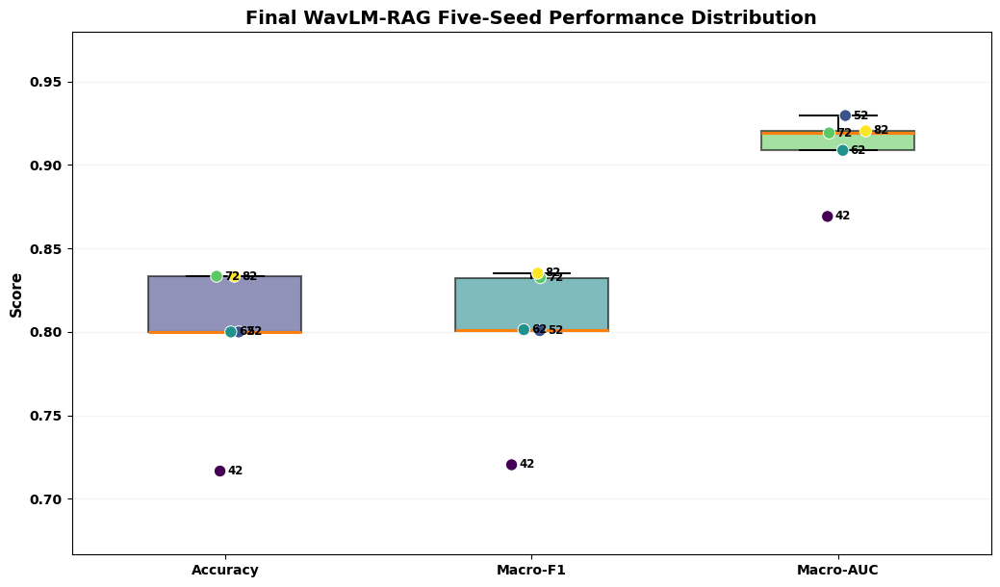

In [23]:
# Final five-seed metric boxplots
metric_frame = pd.DataFrame({
    "Accuracy": seed_df["accuracy"].astype(float).values,
    "Macro-F1": seed_df["macro_f1"].astype(float).values,
    "Macro-AUC": seed_df["roc_auc_macro_ovr"].astype(float).values,
})

fig, ax = plt.subplots(figsize=(10.5, 6.2))

bp = ax.boxplot(
    [
        metric_frame["Accuracy"],
        metric_frame["Macro-F1"],
        metric_frame["Macro-AUC"],
    ],
    labels=["Accuracy", "Macro-F1", "Macro-AUC"],
    widths=.50,
    patch_artist=True,
    showfliers=False,
    medianprops=dict(linewidth=2.2),
    boxprops=dict(linewidth=1.5),
    whiskerprops=dict(linewidth=1.4),
    capprops=dict(linewidth=1.4),
)

for i, box in enumerate(bp["boxes"]):
    box.set_facecolor(VIR(.20 + .28*i))
    box.set_alpha(.58)

rng = np.random.default_rng(19)

for i, metric in enumerate(metric_frame.columns, start=1):
    vals = metric_frame[metric].values
    x = rng.normal(i, .045, len(vals))

    ax.scatter(
        x,
        vals,
        s=80,
        c=np.linspace(.20,.90,len(vals)),
        cmap="viridis",
        edgecolor="white",
        linewidth=.7,
        zorder=3,
    )

    for xi, yi, seed in zip(x, vals, seed_df.seed):
        ax.text(
            xi+.025,
            yi,
            str(int(seed)),
            fontsize=8.5,
            va="center",
            weight="bold",
        )

ax.set_ylabel("Score")
ax.set_ylim(
    max(0.0, metric_frame.min().min()-.05),
    min(1.0, metric_frame.max().max()+.05),
)
ax.set_title(
    "Final WavLM-RAG Five-Seed Performance Distribution",
    weight="bold",
)
ax.grid(axis="y", alpha=.14)

savefig("07_five_seed_metric_boxplot")

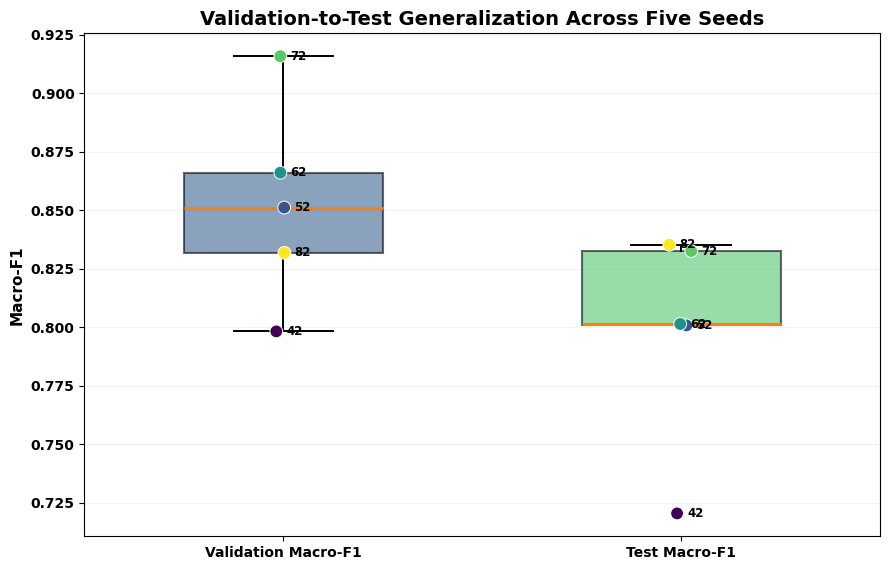

In [24]:
# Validation vs test Macro-F1 boxplot
comparison = [
    seed_df["val_macro_f1"].astype(float).values,
    seed_df["macro_f1"].astype(float).values,
]

fig, ax = plt.subplots(figsize=(9, 5.8))

bp = ax.boxplot(
    comparison,
    labels=["Validation Macro-F1", "Test Macro-F1"],
    widths=.50,
    patch_artist=True,
    showfliers=False,
    medianprops=dict(linewidth=2.2),
    boxprops=dict(linewidth=1.5),
    whiskerprops=dict(linewidth=1.4),
    capprops=dict(linewidth=1.4),
)

for i, box in enumerate(bp["boxes"]):
    box.set_facecolor(VIR(.30 + .42*i))
    box.set_alpha(.58)

rng = np.random.default_rng(29)

for i, vals in enumerate(comparison, start=1):
    x = rng.normal(i, .045, len(vals))

    ax.scatter(
        x,
        vals,
        s=85,
        c=np.linspace(.20,.90,len(vals)),
        cmap="viridis",
        edgecolor="white",
        linewidth=.7,
        zorder=3,
    )

    for xi, yi, seed in zip(x, vals, seed_df.seed):
        ax.text(
            xi+.025,
            yi,
            str(int(seed)),
            fontsize=8.5,
            va="center",
            weight="bold",
        )

ax.set_ylabel("Macro-F1")
ax.set_title(
    "Validation-to-Test Generalization Across Five Seeds",
    weight="bold",
)
ax.grid(axis="y", alpha=.14)

savefig("08_validation_test_boxplot")

## Stage 15 — Validation-Calibrated Ensemble

In [25]:
from scipy.optimize import minimize_scalar

val_ensemble = np.mean(
    np.stack(seed_val_probs),
    axis=0,
)

test_ensemble_raw = np.mean(
    np.stack(seed_test_probs),
    axis=0,
)

def temperature_scale(prob, temperature):
    logits = np.log(
        np.clip(prob, 1e-8, 1.0)
    )

    logits = logits / float(
        temperature
    )

    logits = logits - logits.max(
        axis=1,
        keepdims=True,
    )

    exp_logits = np.exp(logits)

    return exp_logits / exp_logits.sum(
        axis=1,
        keepdims=True,
    )

def temperature_objective(log_temperature):
    temperature = np.exp(
        log_temperature
    )

    p = temperature_scale(
        val_ensemble,
        temperature,
    )

    return log_loss(
        y_val,
        p,
        labels=[0,1,2],
    )

opt = minimize_scalar(
    temperature_objective,
    bounds=(np.log(.35), np.log(4.0)),
    method="bounded",
)

temperature = float(np.exp(opt.x))

test_ensemble = temperature_scale(
    test_ensemble_raw,
    temperature,
)

ensemble_metrics = metric_dict(
    y_test,
    test_ensemble,
)

ensemble_metrics[
    "temperature_from_validation"
] = temperature

json.dump(
    ensemble_metrics,
    open(
        RESULTS / "ensemble_metrics.json",
        "w",
    ),
    indent=2,
)

np.savez_compressed(
    RESULTS / "ensemble_predictions.npz",
    val_prob=val_ensemble,
    test_prob=test_ensemble,
    y_val=y_val,
    y_test=y_test,
)

print(
    "Validation-fitted temperature:",
    temperature,
)
print(ensemble_metrics)

Validation-fitted temperature: 0.7573031601844267
{'accuracy': 0.8333333333333334, 'balanced_accuracy': 0.8333333333333334, 'macro_precision': 0.835547201336675, 'macro_recall': 0.8333333333333334, 'macro_f1': 0.8340942255576401, 'weighted_f1': 0.8340942255576402, 'log_loss': 0.48939604276770343, 'roc_auc_macro_ovr': 0.9345833333333333, 'temperature_from_validation': 0.7573031601844267}


## Stage 16 — Final Comparison

In [26]:
comparison_parts = []

if len(classical_df):
    comparison_parts.append(
        classical_df.copy()
    )

if len(reference_df):
    comparison_parts.append(
        reference_df[
            [
                "model",
                "accuracy",
                "balanced_accuracy",
                "macro_precision",
                "macro_recall",
                "macro_f1",
                "weighted_f1",
                "log_loss",
                "roc_auc_macro_ovr",
            ]
        ].copy()
    )

comparison_parts.append(
    pd.DataFrame([
        {
            "model": "WavLM-RAG Ensemble",
            **{
                k:v
                for k,v in ensemble_metrics.items()
                if k != "temperature_from_validation"
            },
        }
    ])
)

comparison_df = pd.concat(
    comparison_parts,
    ignore_index=True,
)

comparison_df = comparison_df.sort_values(
    "macro_f1",
    ascending=False,
).reset_index(drop=True)

comparison_df.to_csv(
    RESULTS / "final_model_comparison.csv",
    index=False,
)

display(comparison_df)

,model,accuracy,balanced_accuracy,macro_precision,macro_recall,macro_f1,weighted_f1,log_loss,roc_auc_macro_ovr
0,WavLM-RAG Ensemble,0.833333,0.833333,0.835547,0.833333,0.834094,0.834094,0.489396,0.934583
1,GlobalMLP,0.733333,0.733333,0.751389,0.733333,0.736869,0.736869,0.780655,0.878333
2,SVM-RBF,0.733333,0.733333,0.766789,0.733333,0.734471,0.734471,0.715037,0.864583
3,WavLMOnly,0.733333,0.733333,0.736111,0.733333,0.731260,0.731260,0.741373,0.890000
4,XGBoost,0.700000,0.700000,0.705118,0.700000,0.700359,0.700359,0.774386,0.870000
5,LogisticRegression,0.683333,0.683333,0.704212,0.683333,0.683078,0.683078,0.975313,0.865000
6,RandomForest,0.650000,0.650000,0.648063,0.650000,0.647072,0.647072,0.786739,0.854167
7,ExtraTrees,0.650000,0.650000,0.646371,0.650000,0.644827,0.644827,0.803592,0.864167


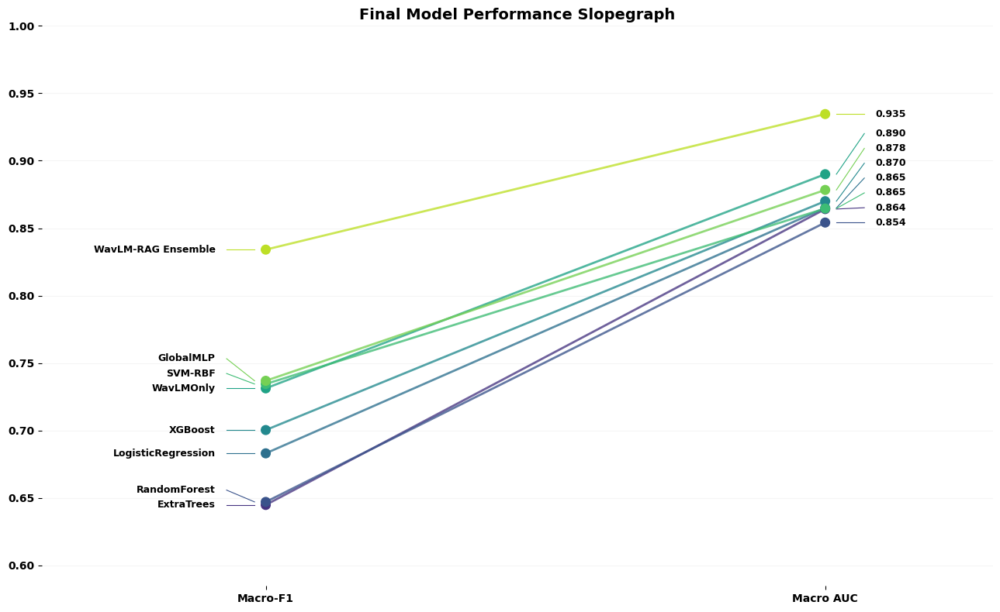

In [27]:
# Collision-aware slopegraph
d = comparison_df.sort_values(
    "macro_f1"
).reset_index(drop=True)

def spread_positions(values, gap=.011):
    values = np.asarray(values, dtype=float)
    order = np.argsort(values)
    placed = values.copy()

    for k in range(1, len(order)):
        prev = order[k-1]
        curr = order[k]
        if placed[curr] - placed[prev] < gap:
            placed[curr] = placed[prev] + gap

    if len(placed) and placed.max() > .985:
        placed -= placed.max() - .985

    return placed

left_y = spread_positions(
    d.macro_f1.values
)

right_y = spread_positions(
    d.roc_auc_macro_ovr.fillna(0).values
)

fig, ax = plt.subplots(figsize=(13, 8))

for i, row in d.iterrows():
    c = VIR(
        .15 + .75*i/max(1,len(d)-1)
    )

    ax.plot(
        [0,1],
        [
            row.macro_f1,
            row.roc_auc_macro_ovr,
        ],
        lw=2.0,
        color=c,
        alpha=.78,
    )

    ax.scatter(
        [0,1],
        [
            row.macro_f1,
            row.roc_auc_macro_ovr,
        ],
        s=70,
        c=[c,c],
        zorder=3,
    )

    ax.plot(
        [-.02,-.07],
        [row.macro_f1,left_y[i]],
        color=c,
        lw=.8,
    )

    ax.text(
        -.09,
        left_y[i],
        row.model,
        ha="right",
        va="center",
        fontsize=9,
    )

    ax.plot(
        [1.02,1.07],
        [
            row.roc_auc_macro_ovr,
            right_y[i],
        ],
        color=c,
        lw=.8,
    )

    ax.text(
        1.09,
        right_y[i],
        f"{row.roc_auc_macro_ovr:.3f}",
        ha="left",
        va="center",
        fontsize=9,
    )

ax.set_xlim(-.40,1.30)

lower = max(
    .45,
    min(
        d.macro_f1.min(),
        d.roc_auc_macro_ovr.min(),
    ) - .06,
)

ax.set_ylim(lower, 1.0)
ax.set_xticks([0,1], ["Macro-F1", "Macro AUC"])
ax.set_title("Final Model Performance Slopegraph", weight="bold")
ax.grid(axis="y", alpha=.12)

for spine in ax.spines.values():
    spine.set_visible(False)

savefig("09_final_slopegraph")

## Stage 17 — Confusion, ROC, PR, and Calibration Visuals

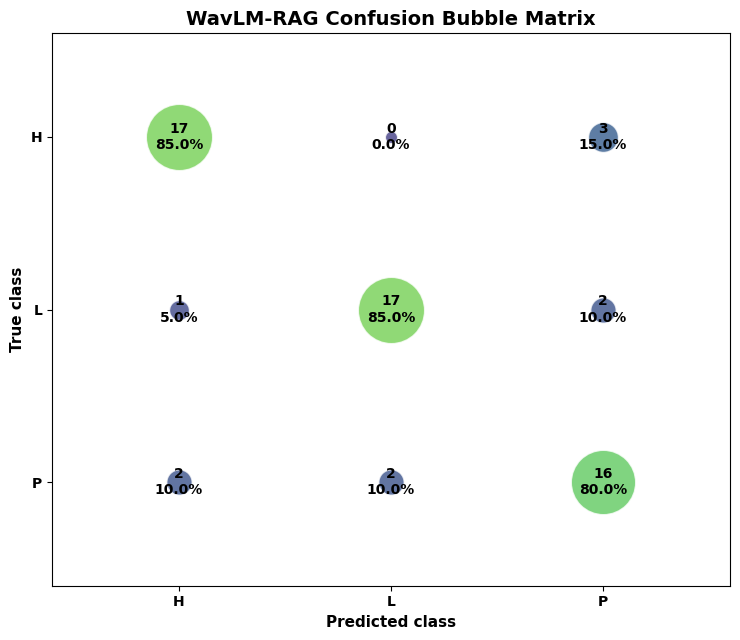

In [28]:
ensemble_pred = test_ensemble.argmax(1)

cm = confusion_matrix(
    y_test,
    ensemble_pred,
    labels=[0,1,2],
)

row_fraction = (
    cm
    / cm.sum(1, keepdims=True)
)

fig, ax = plt.subplots(figsize=(7.5,6.5))

for i in range(3):
    for j in range(3):
        frac = row_fraction[i,j]

        ax.scatter(
            j,
            i,
            s=2600*frac + 80,
            c=[VIR(.18 + .72*frac)],
            alpha=.80,
            edgecolor="white",
            linewidth=1.1,
        )

        ax.text(
            j,
            i,
            f"{cm[i,j]}\n{frac*100:.1f}%",
            ha="center",
            va="center",
            fontsize=10,
            weight="bold",
        )

ax.set_xticks(range(3), CLASS_NAMES)
ax.set_yticks(range(3), CLASS_NAMES)
ax.set_xlabel("Predicted class")
ax.set_ylabel("True class")
ax.set_title(
    "WavLM-RAG Confusion Bubble Matrix",
    weight="bold",
)
ax.set_xlim(-.6,2.6)
ax.set_ylim(2.6,-.6)
ax.grid(False)

savefig("10_confusion_bubbles")

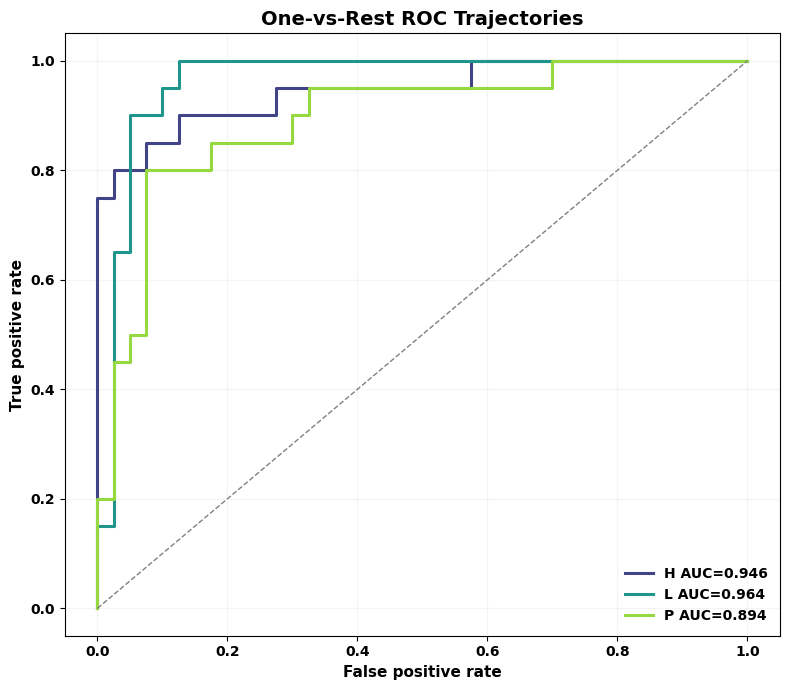

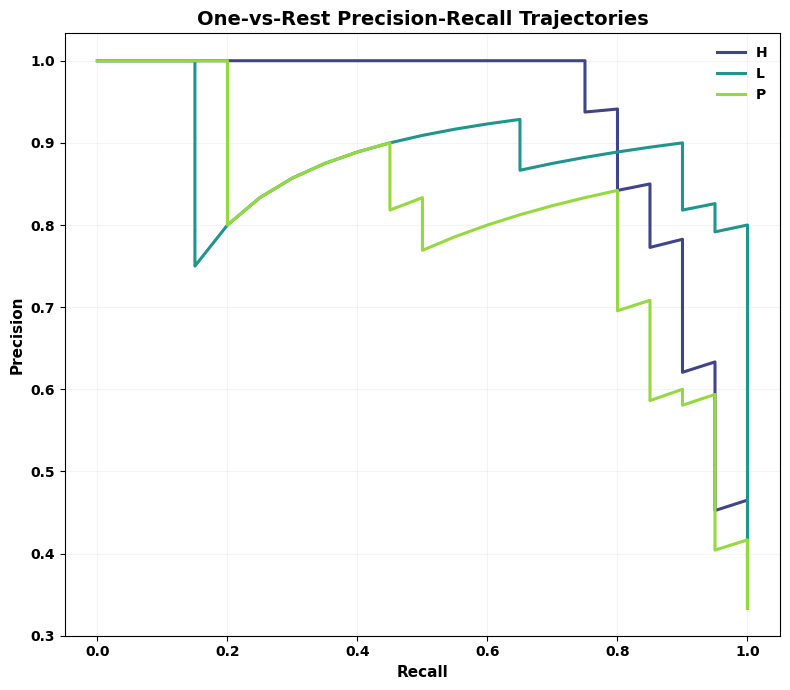

In [29]:
# ROC trajectories
fig, ax = plt.subplots(figsize=(8,7))

for c, name in enumerate(CLASS_NAMES):
    yy = (y_test == c).astype(int)

    fpr, tpr, _ = roc_curve(
        yy,
        test_ensemble[:,c],
    )

    ax.plot(
        fpr,
        tpr,
        lw=2.2,
        color=VIR(.20 + .32*c),
        label=f"{name} AUC={auc(fpr,tpr):.3f}",
    )

ax.plot(
    [0,1],
    [0,1],
    "--",
    lw=1,
    color="gray",
)

ax.set_xlabel("False positive rate")
ax.set_ylabel("True positive rate")
ax.set_title(
    "One-vs-Rest ROC Trajectories",
    weight="bold",
)
ax.legend(frameon=False)
ax.grid(alpha=.13)

savefig("11_roc_trajectories")

# Precision-recall trajectories
fig, ax = plt.subplots(figsize=(8,7))

for c, name in enumerate(CLASS_NAMES):
    yy = (y_test == c).astype(int)

    precision, recall, _ = (
        precision_recall_curve(
            yy,
            test_ensemble[:,c],
        )
    )

    ax.plot(
        recall,
        precision,
        lw=2.2,
        color=VIR(.20 + .32*c),
        label=name,
    )

ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title(
    "One-vs-Rest Precision-Recall Trajectories",
    weight="bold",
)
ax.legend(frameon=False)
ax.grid(alpha=.13)

savefig("12_pr_trajectories")

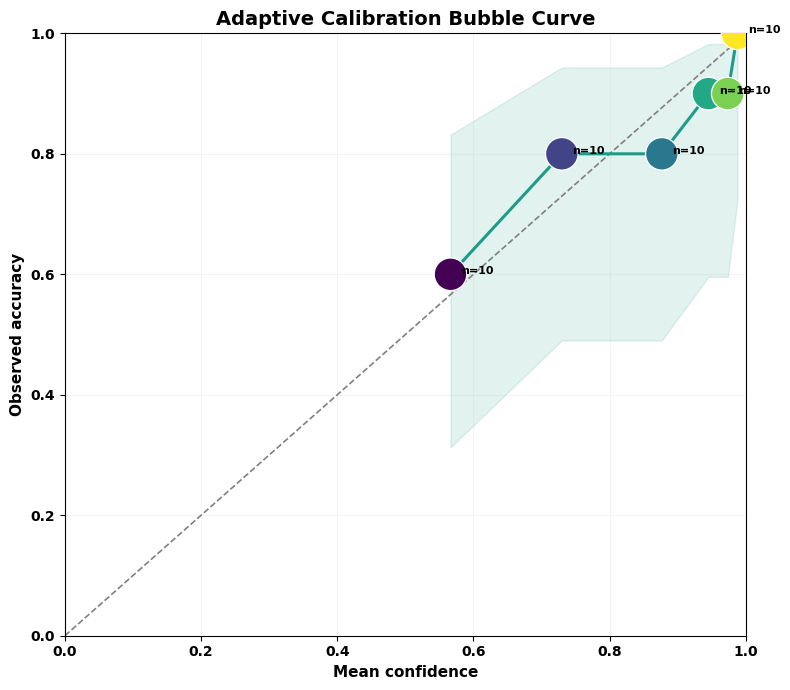

In [30]:
# Adaptive calibration bubble curve
confidence = test_ensemble.max(1)

correct = (
    ensemble_pred == y_test
).astype(int)

order = np.argsort(confidence)

groups = np.array_split(
    order,
    min(
        6,
        max(3, len(order)//8),
    ),
)

xs, ys, ns, lows, highs = [], [], [], [], []

for group in groups:
    if len(group) == 0:
        continue

    x = float(confidence[group].mean())
    y = float(correct[group].mean())
    n = int(len(group))

    z = 1.96
    den = 1 + z*z/n
    center = (
        y + z*z/(2*n)
    ) / den
    half = (
        z
        * np.sqrt(
            y*(1-y)/n
            + z*z/(4*n*n)
        )
        / den
    )

    xs.append(x)
    ys.append(y)
    ns.append(n)
    lows.append(max(0.0, center-half))
    highs.append(min(1.0, center+half))

fig, ax = plt.subplots(figsize=(8,7))

ax.plot(
    [0,1],
    [0,1],
    "--",
    color="gray",
    lw=1.2,
)

ax.fill_between(
    xs,
    lows,
    highs,
    color=VIR(.55),
    alpha=.13,
)

ax.plot(
    xs,
    ys,
    color=VIR(.55),
    lw=2.2,
)

ax.scatter(
    xs,
    ys,
    s=np.asarray(ns)*55,
    c=np.linspace(.2,.9,len(xs)),
    cmap="viridis",
    edgecolor="white",
    linewidth=.9,
    zorder=3,
)

for x,y,n in zip(xs,ys,ns):
    ax.text(
        x+.015,
        y,
        f"n={n}",
        fontsize=8,
    )

ax.set_xlim(0,1)
ax.set_ylim(0,1)
ax.set_xlabel("Mean confidence")
ax.set_ylabel("Observed accuracy")
ax.set_title(
    "Adaptive Calibration Bubble Curve",
    weight="bold",
)
ax.grid(alpha=.12)

savefig("13_calibration_bubbles")

## Stage 18 — Embedding Geometry, Gate Analysis, and Attention

In [31]:
# ============================================================
# Representative Final WavLM-RAG Seed
# Selected ONLY using validation Macro-F1
# ============================================================

import gc
import numpy as np
import torch
from pathlib import Path

# ------------------------------------------------------------
# 1. Select representative seed from validation performance
# ------------------------------------------------------------

representative_row = (
    seed_df
    .sort_values(
        "val_macro_f1",
        ascending=False,
    )
    .iloc[0]
)

representative_seed = int(
    representative_row["seed"]
)

representative_val_f1 = float(
    representative_row["val_macro_f1"]
)

# IMPORTANT:
# Final No-SupCon checkpoint naming
representative_tag = (
    f"WavLMRAG_Final_NoSupCon_seed{representative_seed}"
)

checkpoint_path = (
    CKPT_DIR
    / f"{representative_tag}_best.pt"
)

print("=" * 72)
print("FINAL WavLM-RAG REPRESENTATIVE MODEL")
print("=" * 72)

print(
    "Representative seed selected by validation:",
    representative_seed,
)

print(
    "Validation Macro-F1:",
    f"{representative_val_f1:.4f}",
)

print(
    "Variant:",
    CFG["final_variant"],
)

print(
    "Checkpoint:",
    checkpoint_path,
)

# ------------------------------------------------------------
# 2. Confirm checkpoint exists
# ------------------------------------------------------------

if not checkpoint_path.exists():
    print("\nCheckpoint not found at expected final path.")

    # Show possible matching checkpoints
    possible = sorted(
        CKPT_DIR.glob(
            f"*seed{representative_seed}*_best.pt"
        )
    )

    if possible:
        print("\nAvailable matching checkpoints:")

        for p in possible:
            print("  ", p)

        # Prefer final No-SupCon checkpoint if available
        final_matches = [
            p for p in possible
            if "Final_NoSupCon" in p.name
        ]

        if final_matches:
            checkpoint_path = final_matches[0]
            print(
                "\nUsing:",
                checkpoint_path,
            )
        else:
            raise FileNotFoundError(
                "Final No-SupCon checkpoint was not found."
            )

    else:
        raise FileNotFoundError(
            f"No checkpoint found for seed "
            f"{representative_seed}."
        )

# ------------------------------------------------------------
# 3. Clear previous representative model
# ------------------------------------------------------------

if "representative_model" in globals():
    try:
        del representative_model
    except Exception:
        pass

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()

# ------------------------------------------------------------
# 4. Build FINAL model
# ------------------------------------------------------------

representative_model = build_model(
    CFG["final_variant"]
).to(DEVICE)

# ------------------------------------------------------------
# 5. Load final validation-selected checkpoint
# ------------------------------------------------------------

state = safe_load(
    checkpoint_path,
    map_location="cpu",
)

if state is None:
    raise RuntimeError(
        f"safe_load() failed for:\n{checkpoint_path}"
    )

if "trainable_state" not in state:
    raise KeyError(
        "Checkpoint does not contain 'trainable_state'."
    )

load_trainable_state(
    representative_model,
    state["trainable_state"],
)

representative_model.eval()

print(
    "\n✓ Final checkpoint loaded successfully."
)

# ------------------------------------------------------------
# 6. Extract test embeddings, residual alpha and attention
# ------------------------------------------------------------

representative_out = predict_loader(
    model=representative_model,
    loader=test_loader,
    return_extras=True,
)

# ------------------------------------------------------------
# 7. Sanity checks
# ------------------------------------------------------------

assert len(
    representative_out["alpha"]
) == len(test_manifest), (
    "Residual-alpha count does not match test samples."
)

assert len(
    representative_out["embedding"]
) == len(test_manifest), (
    "Embedding count does not match test samples."
)

if "wav_attention" in representative_out:
    assert len(
        representative_out["wav_attention"]
    ) == len(test_manifest), (
        "Attention-vector count does not match test samples."
    )

# ------------------------------------------------------------
# 8. Residual-gate statistics
# ------------------------------------------------------------

alpha_values = np.asarray(
    representative_out["alpha"],
    dtype=np.float32,
)

print("\n" + "=" * 72)
print("RESIDUAL-GATE STATISTICS")
print("=" * 72)

print(
    "Mean residual alpha:",
    f"{alpha_values.mean():.6f}",
)

print(
    "Median residual alpha:",
    f"{np.median(alpha_values):.6f}",
)

print(
    "Minimum residual alpha:",
    f"{alpha_values.min():.6f}",
)

print(
    "Maximum residual alpha:",
    f"{alpha_values.max():.6f}",
)

print(
    "Residual alpha SD:",
    f"{alpha_values.std(ddof=1):.6f}",
)

print(
    "Configured maximum alpha:",
    f"{CFG['max_residual_alpha']:.6f}",
)

# ------------------------------------------------------------
# 9. Attention-vector statistics
# ------------------------------------------------------------

if (
    "wav_attention" in representative_out
    and representative_out["wav_attention"]
):

    attention_lengths = [
        len(att)
        for att
        in representative_out["wav_attention"]
    ]

    print("\n" + "=" * 72)
    print("WAVLM ATTENTION STATISTICS")
    print("=" * 72)

    print(
        "Attention vectors:",
        len(attention_lengths),
    )

    print(
        "Minimum valid frames:",
        min(attention_lengths),
    )

    print(
        "Maximum valid frames:",
        max(attention_lengths),
    )

    print(
        "Mean valid frames:",
        f"{np.mean(attention_lengths):.2f}",
    )

print("\n✓ Representative-model analysis completed.")

FINAL WavLM-RAG REPRESENTATIVE MODEL
Representative seed selected by validation: 72
Validation Macro-F1: 0.9158
Variant: no_supcon
Checkpoint: /content/drive/MyDrive/WavLM_RAG_Final_NoSupCon_Results/checkpoints/WavLMRAG_Final_NoSupCon_seed72_best.pt


Loading weights:   0%|          | 0/248 [00:00<?, ?it/s]


✓ Final checkpoint loaded successfully.


  0%|          | 0/15 [00:00<?, ?it/s]


RESIDUAL-GATE STATISTICS
Mean residual alpha: 0.197260
Median residual alpha: 0.199565
Minimum residual alpha: 0.179498
Maximum residual alpha: 0.199990
Residual alpha SD: 0.004786
Configured maximum alpha: 0.200000

WAVLM ATTENTION STATISTICS
Attention vectors: 60
Minimum valid frames: 144
Maximum valid frames: 391
Mean valid frames: 261.10

✓ Representative-model analysis completed.


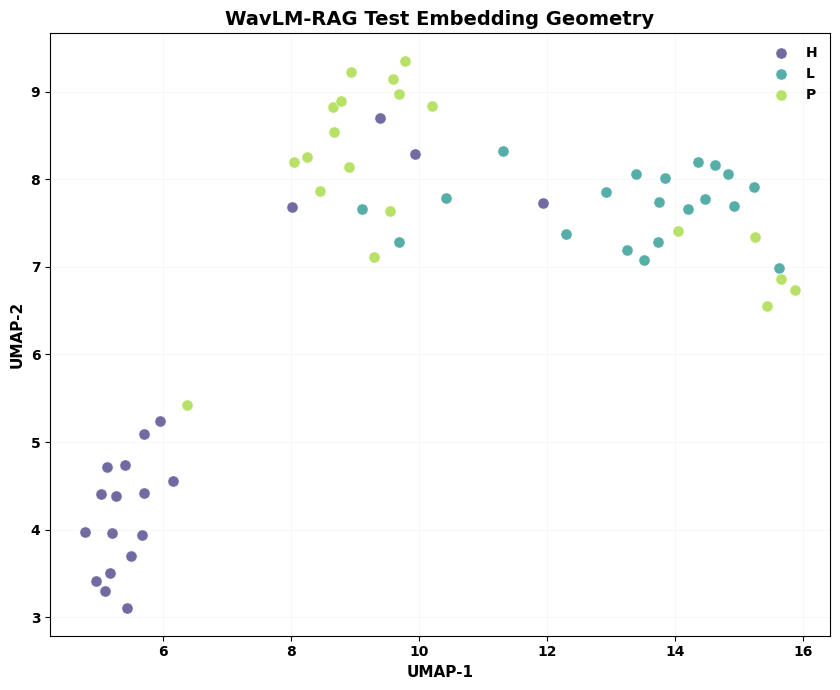

In [32]:
import umap

reducer = umap.UMAP(
    n_neighbors=10,
    min_dist=.18,
    metric="cosine",
    random_state=42,
)

xy = reducer.fit_transform(
    representative_out["embedding"]
)

fig, ax = plt.subplots(figsize=(8.5,7))

for c, name in enumerate(CLASS_NAMES):
    mask = y_test == c

    ax.scatter(
        xy[mask,0],
        xy[mask,1],
        s=65,
        c=[VIR(.18 + .34*c)],
        alpha=.76,
        edgecolor="white",
        linewidth=.5,
        label=name,
    )

ax.set_xlabel("UMAP-1")
ax.set_ylabel("UMAP-2")
ax.set_title(
    "WavLM-RAG Test Embedding Geometry",
    weight="bold",
)
ax.legend(frameon=False)
ax.grid(alpha=.08)

savefig("14_umap_embedding")

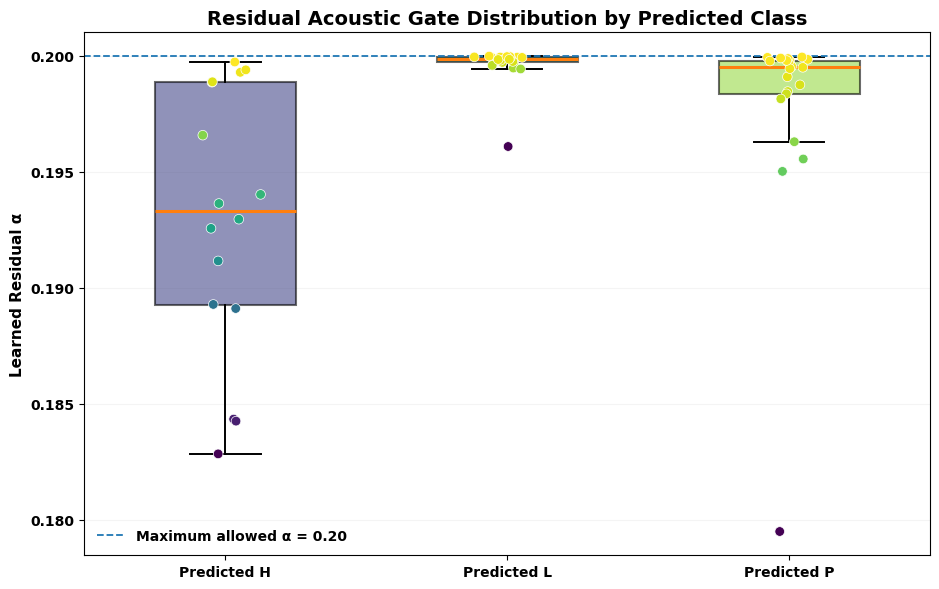

In [33]:
# Residual-gate distribution by predicted class
alpha_values = np.asarray(
    representative_out["alpha"],
    dtype=np.float32,
)

representative_prob = representative_out["prob"]
representative_pred = representative_prob.argmax(1)

alpha_groups = [
    alpha_values[representative_pred == c]
    for c in range(3)
]

fig, ax = plt.subplots(figsize=(9.5, 6))

bp = ax.boxplot(
    alpha_groups,
    labels=[f"Predicted {c}" for c in CLASS_NAMES],
    widths=.50,
    patch_artist=True,
    showfliers=False,
    medianprops=dict(linewidth=2.2),
    boxprops=dict(linewidth=1.5),
    whiskerprops=dict(linewidth=1.4),
    capprops=dict(linewidth=1.4),
)

for i, box in enumerate(bp["boxes"]):
    box.set_facecolor(VIR(.20 + .32*i))
    box.set_alpha(.58)

rng = np.random.default_rng(61)

for i, values in enumerate(alpha_groups, start=1):
    if len(values) == 0:
        continue

    jitter = rng.normal(i, .045, len(values))

    ax.scatter(
        jitter,
        values,
        s=48,
        c=values,
        cmap="viridis",
        edgecolor="white",
        linewidth=.5,
        zorder=3,
    )

ax.axhline(
    CFG["max_residual_alpha"],
    ls="--",
    lw=1.3,
    label=f"Maximum allowed α = {CFG['max_residual_alpha']:.2f}",
)

ax.set_ylabel("Learned Residual α")
ax.set_title(
    "Residual Acoustic Gate Distribution by Predicted Class",
    weight="bold",
)
ax.legend(frameon=False)
ax.grid(axis="y", alpha=.13)

savefig("15_residual_alpha_boxplot")

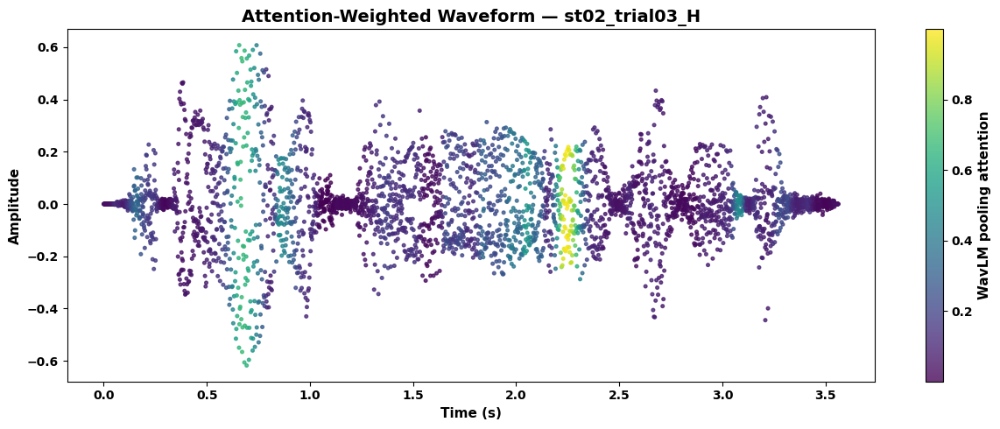

In [34]:
# Attention-weighted waveform
confidence = test_ensemble.max(1)
correct_idx = np.where(
    ensemble_pred == y_test
)[0]

if len(correct_idx):
    idx = int(
        correct_idx[
            np.argmax(confidence[correct_idx])
        ]
    )
else:
    idx = int(
        np.argmax(confidence)
    )

sid = str(
    test_manifest.iloc[idx].sample_id
)

wav = WAV_CACHE[sid].numpy()
t = np.arange(len(wav))/SR

att = np.asarray(
    representative_out["wav_attention"][idx],
    dtype=np.float32,
)

att_interp = np.interp(
    np.linspace(
        0,
        len(att)-1,
        len(wav),
    ),
    np.arange(len(att)),
    att,
)

att_norm = (
    att_interp - att_interp.min()
) / (
    att_interp.max() - att_interp.min() + 1e-8
)

step = max(
    1,
    len(wav)//3500,
)

fig, ax = plt.subplots(figsize=(12.5,5))

scatter = ax.scatter(
    t[::step],
    wav[::step],
    c=att_norm[::step],
    cmap="viridis",
    s=7,
    alpha=.78,
)

plt.colorbar(
    scatter,
    ax=ax,
    label="WavLM pooling attention",
)

ax.set_xlabel("Time (s)")
ax.set_ylabel("Amplitude")
ax.set_title(
    f"Attention-Weighted Waveform — {sid}",
    weight="bold",
)

savefig("16_attention_weighted_waveform")

In [35]:
del representative_model
gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()
print("Representative analysis model released from GPU memory.")

Representative analysis model released from GPU memory.


## Stage 19 — Final Ablation Study

In [36]:
ablation_rows = []

if CFG["run_ablation"]:
    ablation_variants = [
        ("WavLMOnly", "wavlm_only"),
        ("GlobalMLP", "global_only"),
        ("FixedResidual", "fixed_residual"),
        ("WavLM-RAG", "no_supcon"),
        ("WavLM-RAG+SupCon", "full"),
    ]

    for configuration, variant in ablation_variants:
        for seed in CFG["ablation_seeds"]:
            tag = (
                f"ablation_{configuration}_seed{seed}"
            )

            recovered = recover_completed_run(
                tag
            )

            if recovered is not None:
                m, h, vp, tp, ck = recovered
            else:
                m, h, vp, tp, ck = train_one(
                    seed=seed,
                    variant=variant,
                    epochs=CFG["ablation_epochs"],
                    patience=CFG["ablation_patience"],
                    tag=tag,
                    resume=True,
                )

            ablation_rows.append({
                "configuration": configuration,
                "seed": int(seed),
                **m,
            })

ablation_df = pd.DataFrame(
    ablation_rows
)

ablation_df.to_csv(
    RESULTS / "ablation_results.csv",
    index=False,
)

if len(ablation_df):
    ablation_summary = (
        ablation_df
        .groupby("configuration")
        .agg(
            macro_f1_mean=("macro_f1","mean"),
            macro_f1_sd=("macro_f1","std"),
            accuracy_mean=("accuracy","mean"),
            auc_mean=("roc_auc_macro_ovr","mean"),
        )
        .sort_values(
            "macro_f1_mean",
            ascending=False,
        )
    )

    display(ablation_summary)

Loading weights:   0%|          | 0/248 [00:00<?, ?it/s]

ablation_WavLMOnly_seed42 E1:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed42 | epoch 01 | loss 0.9726 | val F1 0.6553 | val AUC 0.8692


ablation_WavLMOnly_seed42 E2:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed42 | epoch 02 | loss 0.8622 | val F1 0.7794 | val AUC 0.9371


ablation_WavLMOnly_seed42 E3:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed42 | epoch 03 | loss 0.7290 | val F1 0.7946 | val AUC 0.9388


ablation_WavLMOnly_seed42 E4:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed42 | epoch 04 | loss 0.7376 | val F1 0.7734 | val AUC 0.9367


ablation_WavLMOnly_seed42 E5:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed42 | epoch 05 | loss 0.7048 | val F1 0.7766 | val AUC 0.9329


ablation_WavLMOnly_seed42 E6:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed42 | epoch 06 | loss 0.6427 | val F1 0.7485 | val AUC 0.9254


ablation_WavLMOnly_seed42 E7:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed42 | epoch 07 | loss 0.5626 | val F1 0.7903 | val AUC 0.9383


ablation_WavLMOnly_seed42 E8:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed42 | epoch 08 | loss 0.5548 | val F1 0.7957 | val AUC 0.9308


ablation_WavLMOnly_seed42 E9:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed42 | epoch 09 | loss 0.4816 | val F1 0.8173 | val AUC 0.9379


ablation_WavLMOnly_seed42 E10:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed42 | epoch 10 | loss 0.5041 | val F1 0.6638 | val AUC 0.9137


ablation_WavLMOnly_seed42 E11:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed42 | epoch 11 | loss 0.5118 | val F1 0.7999 | val AUC 0.9292


ablation_WavLMOnly_seed42 E12:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed42 | epoch 12 | loss 0.4281 | val F1 0.7576 | val AUC 0.9246


ablation_WavLMOnly_seed42 E13:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed42 | epoch 13 | loss 0.4059 | val F1 0.7564 | val AUC 0.9354


ablation_WavLMOnly_seed42 E14:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed42 | epoch 14 | loss 0.3485 | val F1 0.7470 | val AUC 0.9362


ablation_WavLMOnly_seed42 E15:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed42 | epoch 15 | loss 0.3309 | val F1 0.8188 | val AUC 0.9196
Early stopping.


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/248 [00:00<?, ?it/s]

ablation_WavLMOnly_seed62 E1:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed62 | epoch 01 | loss 1.0403 | val F1 0.5769 | val AUC 0.8604


ablation_WavLMOnly_seed62 E2:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed62 | epoch 02 | loss 0.8398 | val F1 0.5077 | val AUC 0.9017


ablation_WavLMOnly_seed62 E3:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed62 | epoch 03 | loss 0.7666 | val F1 0.8214 | val AUC 0.9267


ablation_WavLMOnly_seed62 E4:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed62 | epoch 04 | loss 0.6898 | val F1 0.6872 | val AUC 0.9158


ablation_WavLMOnly_seed62 E5:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed62 | epoch 05 | loss 0.6419 | val F1 0.7607 | val AUC 0.9317


ablation_WavLMOnly_seed62 E6:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed62 | epoch 06 | loss 0.6118 | val F1 0.7928 | val AUC 0.9446


ablation_WavLMOnly_seed62 E7:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed62 | epoch 07 | loss 0.5847 | val F1 0.7684 | val AUC 0.9413


ablation_WavLMOnly_seed62 E8:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed62 | epoch 08 | loss 0.5768 | val F1 0.7438 | val AUC 0.9254


ablation_WavLMOnly_seed62 E9:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed62 | epoch 09 | loss 0.5129 | val F1 0.8033 | val AUC 0.9371
Early stopping.


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/248 [00:00<?, ?it/s]

ablation_WavLMOnly_seed82 E1:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed82 | epoch 01 | loss 0.9952 | val F1 0.4147 | val AUC 0.8546


ablation_WavLMOnly_seed82 E2:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed82 | epoch 02 | loss 0.8163 | val F1 0.6485 | val AUC 0.9104


ablation_WavLMOnly_seed82 E3:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed82 | epoch 03 | loss 0.7427 | val F1 0.6404 | val AUC 0.9258


ablation_WavLMOnly_seed82 E4:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed82 | epoch 04 | loss 0.6973 | val F1 0.7057 | val AUC 0.9287


ablation_WavLMOnly_seed82 E5:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed82 | epoch 05 | loss 0.6725 | val F1 0.6659 | val AUC 0.9358


ablation_WavLMOnly_seed82 E6:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed82 | epoch 06 | loss 0.5833 | val F1 0.7739 | val AUC 0.9408


ablation_WavLMOnly_seed82 E7:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed82 | epoch 07 | loss 0.5671 | val F1 0.7349 | val AUC 0.9388


ablation_WavLMOnly_seed82 E8:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed82 | epoch 08 | loss 0.4940 | val F1 0.7906 | val AUC 0.9446


ablation_WavLMOnly_seed82 E9:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed82 | epoch 09 | loss 0.4843 | val F1 0.7729 | val AUC 0.9350


ablation_WavLMOnly_seed82 E10:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed82 | epoch 10 | loss 0.3875 | val F1 0.8007 | val AUC 0.9296


ablation_WavLMOnly_seed82 E11:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed82 | epoch 11 | loss 0.4071 | val F1 0.7666 | val AUC 0.9275


ablation_WavLMOnly_seed82 E12:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed82 | epoch 12 | loss 0.3885 | val F1 0.7482 | val AUC 0.9254


ablation_WavLMOnly_seed82 E13:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed82 | epoch 13 | loss 0.3802 | val F1 0.7456 | val AUC 0.9183


ablation_WavLMOnly_seed82 E14:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed82 | epoch 14 | loss 0.3474 | val F1 0.7800 | val AUC 0.9192


ablation_WavLMOnly_seed82 E15:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed82 | epoch 15 | loss 0.3002 | val F1 0.7963 | val AUC 0.9171


ablation_WavLMOnly_seed82 E16:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLMOnly_seed82 | epoch 16 | loss 0.3230 | val F1 0.7587 | val AUC 0.9242
Early stopping.


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed42 E1:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed42 | epoch 01 | loss 1.0688 | val F1 0.6182 | val AUC 0.7817


ablation_GlobalMLP_seed42 E2:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed42 | epoch 02 | loss 0.8000 | val F1 0.7007 | val AUC 0.8471


ablation_GlobalMLP_seed42 E3:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed42 | epoch 03 | loss 0.6234 | val F1 0.7341 | val AUC 0.8825


ablation_GlobalMLP_seed42 E4:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed42 | epoch 04 | loss 0.4629 | val F1 0.7338 | val AUC 0.9117


ablation_GlobalMLP_seed42 E5:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed42 | epoch 05 | loss 0.3397 | val F1 0.7333 | val AUC 0.9333


ablation_GlobalMLP_seed42 E6:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed42 | epoch 06 | loss 0.2515 | val F1 0.7860 | val AUC 0.9442


ablation_GlobalMLP_seed42 E7:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed42 | epoch 07 | loss 0.2023 | val F1 0.8197 | val AUC 0.9392


ablation_GlobalMLP_seed42 E8:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed42 | epoch 08 | loss 0.1850 | val F1 0.7885 | val AUC 0.9429


ablation_GlobalMLP_seed42 E9:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed42 | epoch 09 | loss 0.1808 | val F1 0.7885 | val AUC 0.9446


ablation_GlobalMLP_seed42 E10:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed42 | epoch 10 | loss 0.1770 | val F1 0.8023 | val AUC 0.9437


ablation_GlobalMLP_seed42 E11:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed42 | epoch 11 | loss 0.1757 | val F1 0.7869 | val AUC 0.9446


ablation_GlobalMLP_seed42 E12:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed42 | epoch 12 | loss 0.1776 | val F1 0.8213 | val AUC 0.9467


ablation_GlobalMLP_seed42 E13:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed42 | epoch 13 | loss 0.1756 | val F1 0.8213 | val AUC 0.9471


ablation_GlobalMLP_seed42 E14:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed42 | epoch 14 | loss 0.1767 | val F1 0.8213 | val AUC 0.9446


ablation_GlobalMLP_seed42 E15:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed42 | epoch 15 | loss 0.1744 | val F1 0.8213 | val AUC 0.9433


ablation_GlobalMLP_seed42 E16:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed42 | epoch 16 | loss 0.1758 | val F1 0.8213 | val AUC 0.9433


ablation_GlobalMLP_seed42 E17:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed42 | epoch 17 | loss 0.1752 | val F1 0.8213 | val AUC 0.9417


ablation_GlobalMLP_seed42 E18:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed42 | epoch 18 | loss 0.1744 | val F1 0.8213 | val AUC 0.9408


ablation_GlobalMLP_seed42 E19:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed42 | epoch 19 | loss 0.1766 | val F1 0.8213 | val AUC 0.9404
Early stopping.


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed62 E1:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed62 | epoch 01 | loss 1.0642 | val F1 0.4674 | val AUC 0.7550


ablation_GlobalMLP_seed62 E2:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed62 | epoch 02 | loss 0.7833 | val F1 0.5320 | val AUC 0.8004


ablation_GlobalMLP_seed62 E3:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed62 | epoch 03 | loss 0.6204 | val F1 0.5840 | val AUC 0.8458


ablation_GlobalMLP_seed62 E4:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed62 | epoch 04 | loss 0.4590 | val F1 0.6183 | val AUC 0.8783


ablation_GlobalMLP_seed62 E5:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed62 | epoch 05 | loss 0.3381 | val F1 0.6695 | val AUC 0.8950


ablation_GlobalMLP_seed62 E6:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed62 | epoch 06 | loss 0.2521 | val F1 0.7490 | val AUC 0.9079


ablation_GlobalMLP_seed62 E7:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed62 | epoch 07 | loss 0.2026 | val F1 0.7675 | val AUC 0.9171


ablation_GlobalMLP_seed62 E8:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed62 | epoch 08 | loss 0.1845 | val F1 0.7997 | val AUC 0.9267


ablation_GlobalMLP_seed62 E9:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed62 | epoch 09 | loss 0.1807 | val F1 0.7670 | val AUC 0.9238


ablation_GlobalMLP_seed62 E10:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed62 | epoch 10 | loss 0.1796 | val F1 0.7981 | val AUC 0.9275


ablation_GlobalMLP_seed62 E11:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed62 | epoch 11 | loss 0.1774 | val F1 0.7991 | val AUC 0.9221


ablation_GlobalMLP_seed62 E12:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed62 | epoch 12 | loss 0.1771 | val F1 0.7670 | val AUC 0.9229


ablation_GlobalMLP_seed62 E13:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed62 | epoch 13 | loss 0.1766 | val F1 0.7985 | val AUC 0.9267


ablation_GlobalMLP_seed62 E14:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed62 | epoch 14 | loss 0.1767 | val F1 0.7981 | val AUC 0.9262
Early stopping.


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed82 E1:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed82 | epoch 01 | loss 1.0632 | val F1 0.5606 | val AUC 0.7396


ablation_GlobalMLP_seed82 E2:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed82 | epoch 02 | loss 0.7977 | val F1 0.5985 | val AUC 0.7904


ablation_GlobalMLP_seed82 E3:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed82 | epoch 03 | loss 0.6266 | val F1 0.6669 | val AUC 0.8246


ablation_GlobalMLP_seed82 E4:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed82 | epoch 04 | loss 0.4687 | val F1 0.7009 | val AUC 0.8567


ablation_GlobalMLP_seed82 E5:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed82 | epoch 05 | loss 0.3475 | val F1 0.6983 | val AUC 0.8750


ablation_GlobalMLP_seed82 E6:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed82 | epoch 06 | loss 0.2615 | val F1 0.7153 | val AUC 0.8846


ablation_GlobalMLP_seed82 E7:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed82 | epoch 07 | loss 0.2037 | val F1 0.7482 | val AUC 0.8921


ablation_GlobalMLP_seed82 E8:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed82 | epoch 08 | loss 0.1889 | val F1 0.7512 | val AUC 0.8967


ablation_GlobalMLP_seed82 E9:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed82 | epoch 09 | loss 0.1797 | val F1 0.7204 | val AUC 0.8975


ablation_GlobalMLP_seed82 E10:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed82 | epoch 10 | loss 0.1786 | val F1 0.7182 | val AUC 0.8979


ablation_GlobalMLP_seed82 E11:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed82 | epoch 11 | loss 0.1774 | val F1 0.7512 | val AUC 0.9008


ablation_GlobalMLP_seed82 E12:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed82 | epoch 12 | loss 0.1773 | val F1 0.7512 | val AUC 0.9025


ablation_GlobalMLP_seed82 E13:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed82 | epoch 13 | loss 0.1766 | val F1 0.7169 | val AUC 0.9029


ablation_GlobalMLP_seed82 E14:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed82 | epoch 14 | loss 0.1772 | val F1 0.7360 | val AUC 0.9025


ablation_GlobalMLP_seed82 E15:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed82 | epoch 15 | loss 0.1752 | val F1 0.7356 | val AUC 0.9012


ablation_GlobalMLP_seed82 E16:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed82 | epoch 16 | loss 0.1759 | val F1 0.7540 | val AUC 0.9004


ablation_GlobalMLP_seed82 E17:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed82 | epoch 17 | loss 0.1752 | val F1 0.7387 | val AUC 0.9025


ablation_GlobalMLP_seed82 E18:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed82 | epoch 18 | loss 0.1752 | val F1 0.7205 | val AUC 0.9004


ablation_GlobalMLP_seed82 E19:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed82 | epoch 19 | loss 0.1750 | val F1 0.7205 | val AUC 0.8988


ablation_GlobalMLP_seed82 E20:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed82 | epoch 20 | loss 0.1758 | val F1 0.7205 | val AUC 0.9004


ablation_GlobalMLP_seed82 E21:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed82 | epoch 21 | loss 0.1748 | val F1 0.7205 | val AUC 0.9012


ablation_GlobalMLP_seed82 E22:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_GlobalMLP_seed82 | epoch 22 | loss 0.1750 | val F1 0.7205 | val AUC 0.9017
Early stopping.


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/248 [00:00<?, ?it/s]

ablation_FixedResidual_seed42 E1:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed42 | epoch 01 | loss 1.0755 | val F1 0.6161 | val AUC 0.8775


ablation_FixedResidual_seed42 E2:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed42 | epoch 02 | loss 0.9468 | val F1 0.7425 | val AUC 0.9404


ablation_FixedResidual_seed42 E3:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed42 | epoch 03 | loss 0.8211 | val F1 0.8143 | val AUC 0.9471


ablation_FixedResidual_seed42 E4:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed42 | epoch 04 | loss 0.8100 | val F1 0.7403 | val AUC 0.9429


ablation_FixedResidual_seed42 E5:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed42 | epoch 05 | loss 0.7286 | val F1 0.7595 | val AUC 0.9317


ablation_FixedResidual_seed42 E6:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed42 | epoch 06 | loss 0.6891 | val F1 0.7663 | val AUC 0.9287


ablation_FixedResidual_seed42 E7:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed42 | epoch 07 | loss 0.5815 | val F1 0.8291 | val AUC 0.9433


ablation_FixedResidual_seed42 E8:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed42 | epoch 08 | loss 0.5510 | val F1 0.7618 | val AUC 0.9463


ablation_FixedResidual_seed42 E9:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed42 | epoch 09 | loss 0.4858 | val F1 0.8323 | val AUC 0.9504


ablation_FixedResidual_seed42 E10:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed42 | epoch 10 | loss 0.4784 | val F1 0.7049 | val AUC 0.9229


ablation_FixedResidual_seed42 E11:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed42 | epoch 11 | loss 0.5004 | val F1 0.8082 | val AUC 0.9504


ablation_FixedResidual_seed42 E12:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed42 | epoch 12 | loss 0.3936 | val F1 0.7762 | val AUC 0.9438


ablation_FixedResidual_seed42 E13:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed42 | epoch 13 | loss 0.3805 | val F1 0.7986 | val AUC 0.9504


ablation_FixedResidual_seed42 E14:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed42 | epoch 14 | loss 0.3627 | val F1 0.7564 | val AUC 0.9537


ablation_FixedResidual_seed42 E15:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed42 | epoch 15 | loss 0.3403 | val F1 0.7986 | val AUC 0.9421
Early stopping.


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/248 [00:00<?, ?it/s]

ablation_FixedResidual_seed62 E1:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed62 | epoch 01 | loss 1.1116 | val F1 0.5934 | val AUC 0.8717


ablation_FixedResidual_seed62 E2:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed62 | epoch 02 | loss 0.9328 | val F1 0.4933 | val AUC 0.9283


ablation_FixedResidual_seed62 E3:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed62 | epoch 03 | loss 0.8466 | val F1 0.8519 | val AUC 0.9433


ablation_FixedResidual_seed62 E4:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed62 | epoch 04 | loss 0.7542 | val F1 0.7426 | val AUC 0.9317


ablation_FixedResidual_seed62 E5:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed62 | epoch 05 | loss 0.6808 | val F1 0.7405 | val AUC 0.9379


ablation_FixedResidual_seed62 E6:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed62 | epoch 06 | loss 0.6137 | val F1 0.8293 | val AUC 0.9500


ablation_FixedResidual_seed62 E7:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed62 | epoch 07 | loss 0.5850 | val F1 0.8042 | val AUC 0.9383


ablation_FixedResidual_seed62 E8:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed62 | epoch 08 | loss 0.5728 | val F1 0.8132 | val AUC 0.9313


ablation_FixedResidual_seed62 E9:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed62 | epoch 09 | loss 0.5409 | val F1 0.8500 | val AUC 0.9387
Early stopping.


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/248 [00:00<?, ?it/s]

ablation_FixedResidual_seed82 E1:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed82 | epoch 01 | loss 1.1120 | val F1 0.4959 | val AUC 0.8746


ablation_FixedResidual_seed82 E2:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed82 | epoch 02 | loss 0.8990 | val F1 0.6682 | val AUC 0.9250


ablation_FixedResidual_seed82 E3:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed82 | epoch 03 | loss 0.8287 | val F1 0.5441 | val AUC 0.9300


ablation_FixedResidual_seed82 E4:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed82 | epoch 04 | loss 0.7954 | val F1 0.7220 | val AUC 0.9392


ablation_FixedResidual_seed82 E5:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed82 | epoch 05 | loss 0.7129 | val F1 0.7281 | val AUC 0.9421


ablation_FixedResidual_seed82 E6:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed82 | epoch 06 | loss 0.6203 | val F1 0.7704 | val AUC 0.9450


ablation_FixedResidual_seed82 E7:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed82 | epoch 07 | loss 0.5637 | val F1 0.7349 | val AUC 0.9425


ablation_FixedResidual_seed82 E8:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed82 | epoch 08 | loss 0.5399 | val F1 0.7476 | val AUC 0.9504


ablation_FixedResidual_seed82 E9:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed82 | epoch 09 | loss 0.4767 | val F1 0.8105 | val AUC 0.9500


ablation_FixedResidual_seed82 E10:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed82 | epoch 10 | loss 0.4039 | val F1 0.7967 | val AUC 0.9413


ablation_FixedResidual_seed82 E11:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed82 | epoch 11 | loss 0.4144 | val F1 0.7743 | val AUC 0.9413


ablation_FixedResidual_seed82 E12:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed82 | epoch 12 | loss 0.3964 | val F1 0.8153 | val AUC 0.9463


ablation_FixedResidual_seed82 E13:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed82 | epoch 13 | loss 0.3680 | val F1 0.7123 | val AUC 0.9313


ablation_FixedResidual_seed82 E14:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed82 | epoch 14 | loss 0.3256 | val F1 0.7799 | val AUC 0.9346


ablation_FixedResidual_seed82 E15:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed82 | epoch 15 | loss 0.3220 | val F1 0.7590 | val AUC 0.9192


ablation_FixedResidual_seed82 E16:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed82 | epoch 16 | loss 0.3198 | val F1 0.7334 | val AUC 0.9308


ablation_FixedResidual_seed82 E17:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed82 | epoch 17 | loss 0.2938 | val F1 0.7704 | val AUC 0.9329


ablation_FixedResidual_seed82 E18:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_FixedResidual_seed82 | epoch 18 | loss 0.2762 | val F1 0.7502 | val AUC 0.9258
Early stopping.


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/248 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed42 E1:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed42 | epoch 01 | loss 1.0747 | val F1 0.6214 | val AUC 0.8788


ablation_WavLM-RAG_seed42 E2:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed42 | epoch 02 | loss 0.9505 | val F1 0.7780 | val AUC 0.9433


ablation_WavLM-RAG_seed42 E3:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed42 | epoch 03 | loss 0.8240 | val F1 0.7982 | val AUC 0.9417


ablation_WavLM-RAG_seed42 E4:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed42 | epoch 04 | loss 0.8421 | val F1 0.7403 | val AUC 0.9417


ablation_WavLM-RAG_seed42 E5:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed42 | epoch 05 | loss 0.7402 | val F1 0.7595 | val AUC 0.9329


ablation_WavLM-RAG_seed42 E6:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed42 | epoch 06 | loss 0.6718 | val F1 0.7809 | val AUC 0.9250


ablation_WavLM-RAG_seed42 E7:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed42 | epoch 07 | loss 0.5299 | val F1 0.7903 | val AUC 0.9433


ablation_WavLM-RAG_seed42 E8:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed42 | epoch 08 | loss 0.5112 | val F1 0.7798 | val AUC 0.9467


ablation_WavLM-RAG_seed42 E9:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed42 | epoch 09 | loss 0.4340 | val F1 0.8121 | val AUC 0.9446


ablation_WavLM-RAG_seed42 E10:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed42 | epoch 10 | loss 0.4224 | val F1 0.7085 | val AUC 0.9283


ablation_WavLM-RAG_seed42 E11:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed42 | epoch 11 | loss 0.4426 | val F1 0.7966 | val AUC 0.9475


ablation_WavLM-RAG_seed42 E12:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed42 | epoch 12 | loss 0.3367 | val F1 0.7524 | val AUC 0.9450


ablation_WavLM-RAG_seed42 E13:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed42 | epoch 13 | loss 0.3404 | val F1 0.7690 | val AUC 0.9429


ablation_WavLM-RAG_seed42 E14:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed42 | epoch 14 | loss 0.2961 | val F1 0.7625 | val AUC 0.9521


ablation_WavLM-RAG_seed42 E15:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed42 | epoch 15 | loss 0.2820 | val F1 0.7652 | val AUC 0.9483
Early stopping.


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/248 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed62 E1:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed62 | epoch 01 | loss 1.1158 | val F1 0.5715 | val AUC 0.8662


ablation_WavLM-RAG_seed62 E2:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed62 | epoch 02 | loss 0.9405 | val F1 0.4933 | val AUC 0.9167


ablation_WavLM-RAG_seed62 E3:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed62 | epoch 03 | loss 0.8754 | val F1 0.7997 | val AUC 0.9388


ablation_WavLM-RAG_seed62 E4:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed62 | epoch 04 | loss 0.7562 | val F1 0.7426 | val AUC 0.9258


ablation_WavLM-RAG_seed62 E5:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed62 | epoch 05 | loss 0.6673 | val F1 0.7594 | val AUC 0.9483


ablation_WavLM-RAG_seed62 E6:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed62 | epoch 06 | loss 0.5790 | val F1 0.8477 | val AUC 0.9583


ablation_WavLM-RAG_seed62 E7:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed62 | epoch 07 | loss 0.5654 | val F1 0.8433 | val AUC 0.9562


ablation_WavLM-RAG_seed62 E8:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed62 | epoch 08 | loss 0.5524 | val F1 0.8305 | val AUC 0.9542


ablation_WavLM-RAG_seed62 E9:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed62 | epoch 09 | loss 0.4508 | val F1 0.8329 | val AUC 0.9550


ablation_WavLM-RAG_seed62 E10:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed62 | epoch 10 | loss 0.4272 | val F1 0.8510 | val AUC 0.9600


ablation_WavLM-RAG_seed62 E11:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed62 | epoch 11 | loss 0.3878 | val F1 0.8644 | val AUC 0.9571


ablation_WavLM-RAG_seed62 E12:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed62 | epoch 12 | loss 0.3663 | val F1 0.7628 | val AUC 0.9458


ablation_WavLM-RAG_seed62 E13:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed62 | epoch 13 | loss 0.3620 | val F1 0.8644 | val AUC 0.9529


ablation_WavLM-RAG_seed62 E14:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed62 | epoch 14 | loss 0.3175 | val F1 0.8271 | val AUC 0.9629


ablation_WavLM-RAG_seed62 E15:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed62 | epoch 15 | loss 0.2792 | val F1 0.8302 | val AUC 0.9483


ablation_WavLM-RAG_seed62 E16:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed62 | epoch 16 | loss 0.2872 | val F1 0.8490 | val AUC 0.9558


ablation_WavLM-RAG_seed62 E17:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed62 | epoch 17 | loss 0.2808 | val F1 0.8276 | val AUC 0.9504
Early stopping.


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/248 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed82 E1:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed82 | epoch 01 | loss 1.1048 | val F1 0.4959 | val AUC 0.8754


ablation_WavLM-RAG_seed82 E2:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed82 | epoch 02 | loss 0.9119 | val F1 0.7032 | val AUC 0.9279


ablation_WavLM-RAG_seed82 E3:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed82 | epoch 03 | loss 0.8298 | val F1 0.5732 | val AUC 0.9192


ablation_WavLM-RAG_seed82 E4:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed82 | epoch 04 | loss 0.8042 | val F1 0.7796 | val AUC 0.9417


ablation_WavLM-RAG_seed82 E5:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed82 | epoch 05 | loss 0.7075 | val F1 0.7455 | val AUC 0.9363


ablation_WavLM-RAG_seed82 E6:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed82 | epoch 06 | loss 0.5951 | val F1 0.7630 | val AUC 0.9504


ablation_WavLM-RAG_seed82 E7:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed82 | epoch 07 | loss 0.5063 | val F1 0.7970 | val AUC 0.9492


ablation_WavLM-RAG_seed82 E8:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed82 | epoch 08 | loss 0.4658 | val F1 0.7408 | val AUC 0.9533


ablation_WavLM-RAG_seed82 E9:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed82 | epoch 09 | loss 0.4334 | val F1 0.8251 | val AUC 0.9558


ablation_WavLM-RAG_seed82 E10:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed82 | epoch 10 | loss 0.3564 | val F1 0.7967 | val AUC 0.9463


ablation_WavLM-RAG_seed82 E11:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed82 | epoch 11 | loss 0.3429 | val F1 0.8126 | val AUC 0.9483


ablation_WavLM-RAG_seed82 E12:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed82 | epoch 12 | loss 0.3405 | val F1 0.8280 | val AUC 0.9533


ablation_WavLM-RAG_seed82 E13:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed82 | epoch 13 | loss 0.3299 | val F1 0.8342 | val AUC 0.9442


ablation_WavLM-RAG_seed82 E14:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed82 | epoch 14 | loss 0.2972 | val F1 0.7942 | val AUC 0.9454


ablation_WavLM-RAG_seed82 E15:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed82 | epoch 15 | loss 0.2801 | val F1 0.7942 | val AUC 0.9408


ablation_WavLM-RAG_seed82 E16:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed82 | epoch 16 | loss 0.2731 | val F1 0.7690 | val AUC 0.9479


ablation_WavLM-RAG_seed82 E17:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed82 | epoch 17 | loss 0.2668 | val F1 0.8105 | val AUC 0.9508


ablation_WavLM-RAG_seed82 E18:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed82 | epoch 18 | loss 0.2620 | val F1 0.8142 | val AUC 0.9429


ablation_WavLM-RAG_seed82 E19:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG_seed82 | epoch 19 | loss 0.2558 | val F1 0.8142 | val AUC 0.9454
Early stopping.


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/248 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed42 E1:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed42 | epoch 01 | loss 1.1198 | val F1 0.6214 | val AUC 0.8808


ablation_WavLM-RAG+SupCon_seed42 E2:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed42 | epoch 02 | loss 0.9956 | val F1 0.8130 | val AUC 0.9437


ablation_WavLM-RAG+SupCon_seed42 E3:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed42 | epoch 03 | loss 0.8636 | val F1 0.7982 | val AUC 0.9404


ablation_WavLM-RAG+SupCon_seed42 E4:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed42 | epoch 04 | loss 0.8821 | val F1 0.7403 | val AUC 0.9421


ablation_WavLM-RAG+SupCon_seed42 E5:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed42 | epoch 05 | loss 0.7768 | val F1 0.7595 | val AUC 0.9325


ablation_WavLM-RAG+SupCon_seed42 E6:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed42 | epoch 06 | loss 0.7076 | val F1 0.7809 | val AUC 0.9287


ablation_WavLM-RAG+SupCon_seed42 E7:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed42 | epoch 07 | loss 0.5606 | val F1 0.7903 | val AUC 0.9437


ablation_WavLM-RAG+SupCon_seed42 E8:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed42 | epoch 08 | loss 0.5397 | val F1 0.7798 | val AUC 0.9458
Early stopping.


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/248 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed62 E1:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed62 | epoch 01 | loss 1.1622 | val F1 0.5715 | val AUC 0.8675


ablation_WavLM-RAG+SupCon_seed62 E2:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed62 | epoch 02 | loss 0.9826 | val F1 0.4933 | val AUC 0.9179


ablation_WavLM-RAG+SupCon_seed62 E3:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed62 | epoch 03 | loss 0.9176 | val F1 0.7997 | val AUC 0.9400


ablation_WavLM-RAG+SupCon_seed62 E4:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed62 | epoch 04 | loss 0.7957 | val F1 0.7426 | val AUC 0.9292


ablation_WavLM-RAG+SupCon_seed62 E5:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed62 | epoch 05 | loss 0.7050 | val F1 0.7570 | val AUC 0.9479


ablation_WavLM-RAG+SupCon_seed62 E6:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed62 | epoch 06 | loss 0.6118 | val F1 0.8477 | val AUC 0.9579


ablation_WavLM-RAG+SupCon_seed62 E7:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed62 | epoch 07 | loss 0.5916 | val F1 0.8433 | val AUC 0.9537


ablation_WavLM-RAG+SupCon_seed62 E8:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed62 | epoch 08 | loss 0.5670 | val F1 0.8305 | val AUC 0.9504


ablation_WavLM-RAG+SupCon_seed62 E9:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed62 | epoch 09 | loss 0.4816 | val F1 0.8329 | val AUC 0.9546


ablation_WavLM-RAG+SupCon_seed62 E10:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed62 | epoch 10 | loss 0.4554 | val F1 0.8510 | val AUC 0.9608


ablation_WavLM-RAG+SupCon_seed62 E11:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed62 | epoch 11 | loss 0.4129 | val F1 0.8644 | val AUC 0.9571


ablation_WavLM-RAG+SupCon_seed62 E12:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed62 | epoch 12 | loss 0.3892 | val F1 0.7628 | val AUC 0.9529


ablation_WavLM-RAG+SupCon_seed62 E13:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed62 | epoch 13 | loss 0.3898 | val F1 0.8658 | val AUC 0.9579


ablation_WavLM-RAG+SupCon_seed62 E14:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed62 | epoch 14 | loss 0.3416 | val F1 0.8644 | val AUC 0.9650


ablation_WavLM-RAG+SupCon_seed62 E15:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed62 | epoch 15 | loss 0.3031 | val F1 0.8490 | val AUC 0.9550


ablation_WavLM-RAG+SupCon_seed62 E16:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed62 | epoch 16 | loss 0.3076 | val F1 0.8490 | val AUC 0.9608


ablation_WavLM-RAG+SupCon_seed62 E17:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed62 | epoch 17 | loss 0.3015 | val F1 0.8658 | val AUC 0.9562


ablation_WavLM-RAG+SupCon_seed62 E18:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed62 | epoch 18 | loss 0.3032 | val F1 0.8490 | val AUC 0.9550


ablation_WavLM-RAG+SupCon_seed62 E19:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed62 | epoch 19 | loss 0.2911 | val F1 0.8490 | val AUC 0.9546


ablation_WavLM-RAG+SupCon_seed62 E20:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed62 | epoch 20 | loss 0.2688 | val F1 0.8490 | val AUC 0.9588
Early stopping.


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/248 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed82 E1:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed82 | epoch 01 | loss 1.1506 | val F1 0.4959 | val AUC 0.8708


ablation_WavLM-RAG+SupCon_seed82 E2:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed82 | epoch 02 | loss 0.9564 | val F1 0.7032 | val AUC 0.9287


ablation_WavLM-RAG+SupCon_seed82 E3:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed82 | epoch 03 | loss 0.8730 | val F1 0.5732 | val AUC 0.9200


ablation_WavLM-RAG+SupCon_seed82 E4:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed82 | epoch 04 | loss 0.8453 | val F1 0.7613 | val AUC 0.9433


ablation_WavLM-RAG+SupCon_seed82 E5:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed82 | epoch 05 | loss 0.7417 | val F1 0.7455 | val AUC 0.9367


ablation_WavLM-RAG+SupCon_seed82 E6:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed82 | epoch 06 | loss 0.6287 | val F1 0.7847 | val AUC 0.9504


ablation_WavLM-RAG+SupCon_seed82 E7:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed82 | epoch 07 | loss 0.5405 | val F1 0.7970 | val AUC 0.9500


ablation_WavLM-RAG+SupCon_seed82 E8:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed82 | epoch 08 | loss 0.4939 | val F1 0.7417 | val AUC 0.9537


ablation_WavLM-RAG+SupCon_seed82 E9:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed82 | epoch 09 | loss 0.4602 | val F1 0.8251 | val AUC 0.9563


ablation_WavLM-RAG+SupCon_seed82 E10:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed82 | epoch 10 | loss 0.3838 | val F1 0.7967 | val AUC 0.9479


ablation_WavLM-RAG+SupCon_seed82 E11:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed82 | epoch 11 | loss 0.3685 | val F1 0.8126 | val AUC 0.9517


ablation_WavLM-RAG+SupCon_seed82 E12:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed82 | epoch 12 | loss 0.3651 | val F1 0.8313 | val AUC 0.9558


ablation_WavLM-RAG+SupCon_seed82 E13:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed82 | epoch 13 | loss 0.3534 | val F1 0.8171 | val AUC 0.9458


ablation_WavLM-RAG+SupCon_seed82 E14:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed82 | epoch 14 | loss 0.3154 | val F1 0.7997 | val AUC 0.9450


ablation_WavLM-RAG+SupCon_seed82 E15:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed82 | epoch 15 | loss 0.3001 | val F1 0.8142 | val AUC 0.9421


ablation_WavLM-RAG+SupCon_seed82 E16:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed82 | epoch 16 | loss 0.2959 | val F1 0.7694 | val AUC 0.9487


ablation_WavLM-RAG+SupCon_seed82 E17:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed82 | epoch 17 | loss 0.2892 | val F1 0.7900 | val AUC 0.9521


ablation_WavLM-RAG+SupCon_seed82 E18:   0%|          | 0/71 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

ablation_WavLM-RAG+SupCon_seed82 | epoch 18 | loss 0.2810 | val F1 0.8142 | val AUC 0.9454
Early stopping.


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

,macro_f1_mean,macro_f1_sd,accuracy_mean,auc_mean
configuration,,,,
WavLM-RAG,0.801366,0.060665,0.800000,0.915278
WavLM-RAG+SupCon,0.779417,0.080301,0.777778,0.901667
GlobalMLP,0.747130,0.008936,0.744444,0.865278
WavLMOnly,0.740916,0.076001,0.738889,0.906667
FixedResidual,0.740680,0.077468,0.738889,0.908194


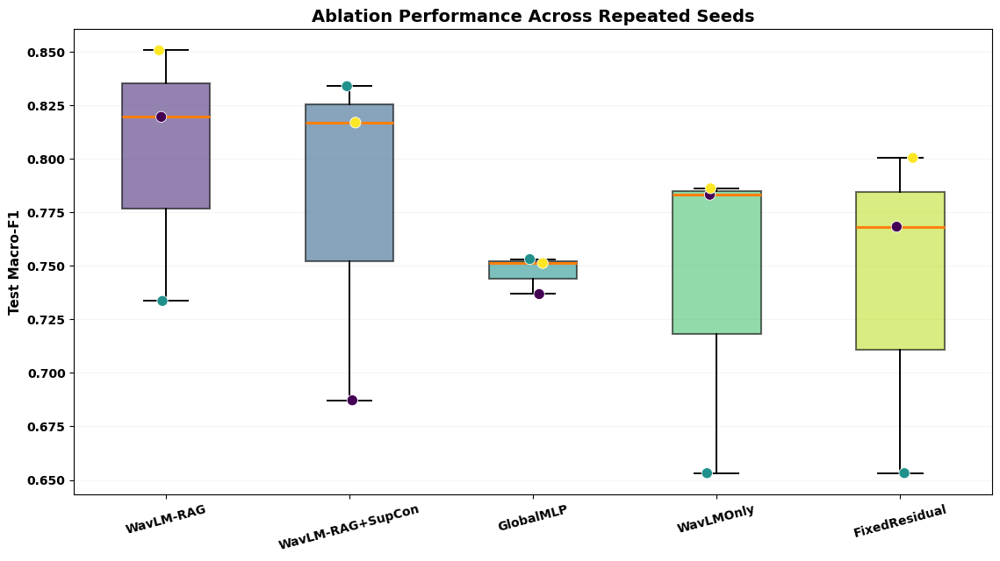

In [37]:
# Ablation boxplot with individual seed results
if len(ablation_df):
    ordered_names = (
        ablation_df
        .groupby("configuration")
        .macro_f1.mean()
        .sort_values(ascending=False)
        .index.tolist()
    )

    data = [
        ablation_df.loc[
            ablation_df.configuration == name,
            "macro_f1",
        ].astype(float).values
        for name in ordered_names
    ]

    fig, ax = plt.subplots(figsize=(11.5, 6.5))

    bp = ax.boxplot(
        data,
        labels=ordered_names,
        widths=.48,
        patch_artist=True,
        showfliers=False,
        medianprops=dict(linewidth=2.2),
        boxprops=dict(linewidth=1.5),
        whiskerprops=dict(linewidth=1.4),
        capprops=dict(linewidth=1.4),
    )

    for i, box in enumerate(bp["boxes"]):
        box.set_facecolor(VIR(.12 + .78*i/max(1,len(bp["boxes"])-1)))
        box.set_alpha(.58)

    rng = np.random.default_rng(88)

    for i, values in enumerate(data, start=1):
        x = rng.normal(i, .035, len(values))

        ax.scatter(
            x,
            values,
            s=78,
            c=np.linspace(.20,.90,len(values)),
            cmap="viridis",
            edgecolor="white",
            linewidth=.6,
            zorder=3,
        )

    ax.set_ylabel("Test Macro-F1")
    ax.set_title(
        "Ablation Performance Across Repeated Seeds",
        weight="bold",
    )
    ax.tick_params(axis="x", rotation=15)
    ax.grid(axis="y", alpha=.13)

    savefig("17_ablation_boxplot")

## Stage 20 — Paired Bootstrap and McNemar Tests

In [38]:
from scipy.stats import binomtest
from statsmodels.stats.multitest import multipletests

def paired_bootstrap(
    y,
    proposed_prob,
    baseline_prob,
    n_boot=5000,
    seed=123,
):
    rng = np.random.default_rng(seed)
    n = len(y)

    delta_f1 = []
    delta_acc = []

    for _ in range(n_boot):
        idx = rng.integers(0,n,n)

        mp = metric_dict(
            y[idx],
            proposed_prob[idx],
        )

        mb = metric_dict(
            y[idx],
            baseline_prob[idx],
        )

        delta_f1.append(
            mp["macro_f1"]
            - mb["macro_f1"]
        )

        delta_acc.append(
            mp["accuracy"]
            - mb["accuracy"]
        )

    return (
        np.quantile(
            delta_f1,
            [.025,.5,.975],
        ),
        np.quantile(
            delta_acc,
            [.025,.5,.975],
        ),
    )

all_baseline_probs = {}
all_baseline_probs.update(
    classical_probs
)
all_baseline_probs.update(
    reference_probs
)

stat_rows = []

proposed_pred = (
    test_ensemble.argmax(1)
)

for name, baseline_prob in all_baseline_probs.items():
    ci_f1, ci_acc = paired_bootstrap(
        y_test,
        test_ensemble,
        baseline_prob,
    )

    baseline_pred = (
        baseline_prob.argmax(1)
    )

    proposed_only = int(
        (
            (proposed_pred == y_test)
            & (baseline_pred != y_test)
        ).sum()
    )

    baseline_only = int(
        (
            (proposed_pred != y_test)
            & (baseline_pred == y_test)
        ).sum()
    )

    discordant = (
        proposed_only + baseline_only
    )

    if discordant == 0:
        p_value = 1.0
    else:
        p_value = binomtest(
            min(
                proposed_only,
                baseline_only,
            ),
            discordant,
            .5,
            alternative="two-sided",
        ).pvalue

    baseline_metrics = metric_dict(
        y_test,
        baseline_prob,
    )

    stat_rows.append({
        "baseline": name,
        "delta_macro_f1": (
            ensemble_metrics["macro_f1"]
            - baseline_metrics["macro_f1"]
        ),
        "f1_ci_low": ci_f1[0],
        "f1_ci_median": ci_f1[1],
        "f1_ci_high": ci_f1[2],
        "delta_accuracy": (
            ensemble_metrics["accuracy"]
            - baseline_metrics["accuracy"]
        ),
        "acc_ci_low": ci_acc[0],
        "acc_ci_median": ci_acc[1],
        "acc_ci_high": ci_acc[2],
        "mcnemar_proposed_only_correct": proposed_only,
        "mcnemar_baseline_only_correct": baseline_only,
        "mcnemar_p": p_value,
    })

stats_df = pd.DataFrame(
    stat_rows
)

if len(stats_df):
    stats_df["mcnemar_p_holm"] = multipletests(
        stats_df.mcnemar_p,
        method="holm",
    )[1]

    stats_df["significant_0.05"] = (
        stats_df.mcnemar_p_holm < .05
    )

stats_df.to_csv(
    RESULTS / "paired_significance.csv",
    index=False,
)

display(stats_df)

,baseline,delta_macro_f1,f1_ci_low,f1_ci_median,f1_ci_high,delta_accuracy,acc_ci_low,acc_ci_median,acc_ci_high,mcnemar_proposed_only_correct,mcnemar_baseline_only_correct,mcnemar_p,mcnemar_p_holm,significant_0.05
0,SVM-RBF,0.099623,0.002981,0.100390,0.205721,0.100000,0.000000,0.100000,0.200000,8,2,0.109375,0.328125,False
1,LogisticRegression,0.151017,0.053749,0.151973,0.258890,0.150000,0.050000,0.150000,0.250000,10,1,0.011719,0.058594,False
2,ExtraTrees,0.189268,0.082479,0.189647,0.307480,0.183333,0.083333,0.183333,0.300000,12,1,0.003418,0.023926,True
3,RandomForest,0.187022,0.078942,0.186651,0.300386,0.183333,0.083333,0.183333,0.283333,12,1,0.003418,0.023926,True
4,XGBoost,0.133735,0.026994,0.134655,0.247981,0.133333,0.033333,0.133333,0.233750,10,2,0.038574,0.154297,False
5,WavLMOnly,0.102834,0.000679,0.103239,0.208928,0.100000,0.000000,0.100000,0.200000,8,2,0.109375,0.328125,False
6,GlobalMLP,0.097226,0.000268,0.096915,0.199720,0.100000,0.000000,0.100000,0.200000,8,2,0.109375,0.328125,False


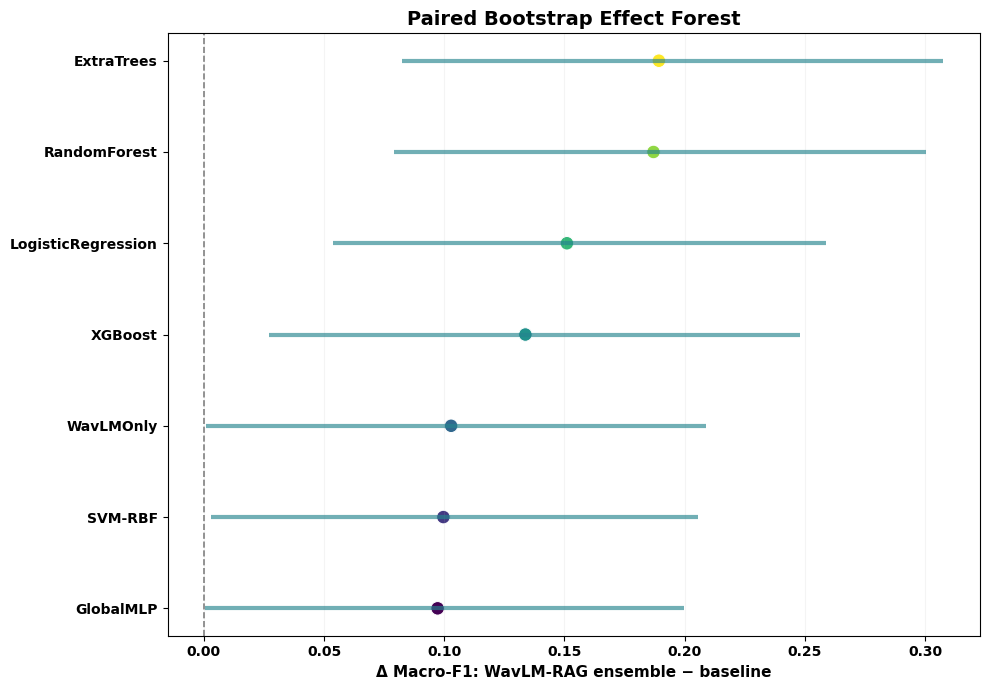

In [39]:
# Bootstrap effect forest
if len(stats_df):
    d = stats_df.sort_values(
        "delta_macro_f1"
    )

    fig, ax = plt.subplots(figsize=(10,7))

    yloc = np.arange(len(d))

    ax.hlines(
        yloc,
        d.f1_ci_low,
        d.f1_ci_high,
        color=VIR(.45),
        lw=3,
        alpha=.65,
    )

    ax.scatter(
        d.delta_macro_f1,
        yloc,
        s=95,
        c=np.linspace(.2,.9,len(d)),
        cmap="viridis",
        edgecolor="white",
        linewidth=.7,
    )

    ax.axvline(
        0,
        color="gray",
        ls="--",
        lw=1.2,
    )

    ax.set_yticks(
        yloc,
        d.baseline,
    )

    ax.set_xlabel(
        "Δ Macro-F1: WavLM-RAG ensemble − baseline"
    )
    ax.set_title(
        "Paired Bootstrap Effect Forest",
        weight="bold",
    )
    ax.grid(axis="x", alpha=.13)

    savefig("18_bootstrap_forest")

## Stage 21 — Error-Flow Sankey

In [40]:
import plotly.graph_objects as go

flow = confusion_matrix(
    y_test,
    ensemble_pred,
    labels=[0,1,2],
)

labels = (
    [f"<b>True {c}</b>" for c in CLASS_NAMES]
    + [f"<b>Pred {c}</b>" for c in CLASS_NAMES]
)

source = []
target = []
value = []

for i in range(3):
    for j in range(3):
        if flow[i,j] > 0:
            source.append(i)
            target.append(3+j)
            value.append(int(flow[i,j]))

fig = go.Figure(
    go.Sankey(
        node=dict(
            label=labels,
            pad=18,
            thickness=18,
        ),
        link=dict(
            source=source,
            target=target,
            value=value,
        ),
    )
)

fig.update_layout(
    title=dict(text="<b>WavLM-RAG True-to-Predicted Engagement Flow</b>"),
    font=dict(size=12, family="Arial Black"),
)

fig.write_html(
    str(
        FIG_DIR
        / "19_error_flow_sankey.html"
    )
)

fig.show()

## Stage 22 — Leakage-Safe Participant-Grouped Five-Fold CV for Final WavLM-RAG

In [41]:
# FINAL GROUPED 5-FOLD CV: WavLM-RAG (Adaptive Gate, No SupCon)
from sklearn.decomposition import PCA
from sklearn.model_selection import GroupKFold

CV_VARIANT = CFG["final_variant"]
CV_DISPLAY_NAME = "WavLM-RAG"
CV_BASE_SEED = 8400

def load_raw_global_sources_for_cv():
    hand_file = DATA_DIR / "global_handcrafted_raw.csv"
    hubert_file = DATA_DIR / "hubert_mean_std_raw.npy"
    names_file = DATA_DIR / "global_handcrafted_feature_names.csv"

    for p in [hand_file, hubert_file, names_file]:
        if not p.exists():
            raise FileNotFoundError(p)

    hand_df = pd.read_csv(hand_file)
    hand_df["sample_id"] = hand_df["sample_id"].astype(str)

    hand_names = (
        pd.read_csv(names_file)["feature"]
        .astype(str)
        .tolist()
    )

    hand_all = (
        hand_df
        .set_index("sample_id")
        .reindex(master_manifest.sample_id.astype(str))[hand_names]
        .to_numpy(np.float32)
    )

    hubert_all = np.load(
        hubert_file
    ).astype(np.float32)

    if len(hubert_all) != len(master_manifest):
        raise ValueError(
            "HuBERT raw embedding count does not match master manifest."
        )

    pos = {
        str(s):i
        for i,s in enumerate(
            master_manifest.sample_id.astype(str)
        )
    }

    train_positions = np.array(
        [
            pos[str(s)]
            for s in train_manifest.sample_id.astype(str)
        ],
        dtype=int,
    )

    return (
        hand_all[train_positions],
        hubert_all[train_positions],
    )

def fold_global_transform_cv(
    hand_raw,
    hubert_raw,
    tr_idx,
    va_idx,
):
    hand_scaler = StandardScaler().fit(
        hand_raw[tr_idx]
    )

    htr = hand_scaler.transform(
        hand_raw[tr_idx]
    ).astype(np.float32)

    hva = hand_scaler.transform(
        hand_raw[va_idx]
    ).astype(np.float32)

    hubert_scaler = StandardScaler().fit(
        hubert_raw[tr_idx]
    )

    utr = hubert_scaler.transform(
        hubert_raw[tr_idx]
    ).astype(np.float32)

    uva = hubert_scaler.transform(
        hubert_raw[va_idx]
    ).astype(np.float32)

    target_pca_dim = (
        GLOBAL_DIM - htr.shape[1]
    )

    pca_dim = min(
        target_pca_dim,
        len(tr_idx)-1,
        utr.shape[1],
    )

    if pca_dim < 1:
        raise ValueError(
            f"Invalid fold-local PCA dimension: {pca_dim}"
        )

    pca = PCA(
        n_components=pca_dim,
        random_state=42,
    ).fit(utr)

    ptr = pca.transform(
        utr
    ).astype(np.float32)

    pva = pca.transform(
        uva
    ).astype(np.float32)

    if ptr.shape[1] < target_pca_dim:
        pad = (
            target_pca_dim
            - ptr.shape[1]
        )

        ptr = np.pad(
            ptr,
            ((0,0),(0,pad)),
            mode="constant",
        )

        pva = np.pad(
            pva,
            ((0,0),(0,pad)),
            mode="constant",
        )

    elif ptr.shape[1] > target_pca_dim:
        ptr = ptr[:, :target_pca_dim]
        pva = pva[:, :target_pca_dim]

    raw_tr = np.concatenate(
        [htr, ptr],
        axis=1,
    ).astype(np.float32)

    raw_va = np.concatenate(
        [hva, pva],
        axis=1,
    ).astype(np.float32)

    assert raw_tr.shape[1] == GLOBAL_DIM
    assert raw_va.shape[1] == GLOBAL_DIM

    final_scaler = StandardScaler().fit(
        raw_tr
    )

    return (
        final_scaler.transform(raw_tr).astype(np.float32),
        final_scaler.transform(raw_va).astype(np.float32),
    )

def get_grouped_splits():
    supplied_file = (
        DATA_DIR
        / "participant_grouped_5fold_cv.csv"
    )

    if supplied_file.exists():
        supplied = pd.read_csv(
            supplied_file
        )

        if {
            "fold",
            "role",
            "sample_id",
        }.issubset(supplied.columns):

            id_to_idx = {
                str(s):i
                for i,s in enumerate(
                    train_manifest.sample_id.astype(str)
                )
            }

            splits = []

            for fold in sorted(
                supplied.fold.unique()
            ):
                q = supplied[
                    supplied.fold == fold
                ]

                tr_idx = np.array(
                    [
                        id_to_idx[str(s)]
                        for s in q.loc[
                            q.role.astype(str).str.lower() == "train",
                            "sample_id",
                        ]
                    ],
                    dtype=int,
                )

                va_idx = np.array(
                    [
                        id_to_idx[str(s)]
                        for s in q.loc[
                            q.role.astype(str).str.lower() == "val",
                            "sample_id",
                        ]
                    ],
                    dtype=int,
                )

                splits.append(
                    (
                        int(fold),
                        tr_idx,
                        va_idx,
                    )
                )

            print(
                "Using supplied participant_grouped_5fold_cv.csv"
            )
            return splits

    gkf = GroupKFold(5)

    print(
        "Using sklearn GroupKFold fallback"
    )

    return [
        (i+1, tr, va)
        for i,(tr,va) in enumerate(
            gkf.split(
                np.arange(len(train_manifest)),
                y_train,
                train_manifest.participant.values,
            )
        )
    ]

if CFG["run_grouped_cv"]:
    hand_train_raw, hubert_train_raw = (
        load_raw_global_sources_for_cv()
    )

    fold_splits = get_grouped_splits()

    protocol_rows = []

    for fold, tr_idx, va_idx in fold_splits:
        tr_people = set(
            train_manifest.iloc[
                tr_idx
            ].participant.astype(int)
        )

        va_people = set(
            train_manifest.iloc[
                va_idx
            ].participant.astype(int)
        )

        assert tr_people.isdisjoint(
            va_people
        )

        protocol_rows.append({
            "fold": int(fold),
            "train_samples": int(len(tr_idx)),
            "val_samples": int(len(va_idx)),
            "train_participants": int(len(tr_people)),
            "val_participants": int(len(va_people)),
            "participant_overlap": 0,
            "val_H": int((y_train[va_idx] == 0).sum()),
            "val_L": int((y_train[va_idx] == 1).sum()),
            "val_P": int((y_train[va_idx] == 2).sum()),
        })

    cv_protocol_df = pd.DataFrame(
        protocol_rows
    )

    display(cv_protocol_df)

    cv_protocol_df.to_csv(
        RESULTS / "grouped_cv_protocol.csv",
        index=False,
    )

    json.dump(
        {
            "model": "WavLM-RAG",
            "variant": CV_VARIANT,
            "source_population": (
                "original frozen training split only"
            ),
            "frozen_validation_used": False,
            "frozen_test_used": False,
            "participant_disjoint": True,
            "fold_local_handcrafted_scaler": True,
            "fold_local_hubert_scaler": True,
            "fold_local_hubert_pca": True,
            "fold_local_final_global_scaler": True,
            "fold_local_quality_scaler": True,
        },
        open(
            RESULTS
            / "grouped_cv_protocol_audit.json",
            "w",
        ),
        indent=2,
    )

    grouped_rows = []

    for fold, tr_idx, va_idx in fold_splits:
        print(
            "\n"
            + "="*96
        )
        print(
            f"GROUPED CV FOLD {fold} | FINAL WavLM-RAG"
        )

        fold_seed = (
            CV_BASE_SEED
            + int(fold)
        )

        gtr, gva = fold_global_transform_cv(
            hand_train_raw,
            hubert_train_raw,
            tr_idx,
            va_idx,
        )

        qtr_raw = Q_train_raw[
            tr_idx
        ]

        qva_raw = Q_train_raw[
            va_idx
        ]

        q_mu_fold = np.nanmean(
            qtr_raw,
            axis=0,
            keepdims=True,
        )

        q_sd_fold = (
            np.nanstd(
                qtr_raw,
                axis=0,
                keepdims=True,
            )
            + 1e-6
        )

        qtr = np.nan_to_num(
            (
                qtr_raw
                - q_mu_fold
            )
            / q_sd_fold
        ).astype(np.float32)

        qva = np.nan_to_num(
            (
                qva_raw
                - q_mu_fold
            )
            / q_sd_fold
        ).astype(np.float32)

        tr_manifest_fold = (
            train_manifest
            .iloc[tr_idx]
            .reset_index(drop=True)
        )

        va_manifest_fold = (
            train_manifest
            .iloc[va_idx]
            .reset_index(drop=True)
        )

        train_loader_fold = make_loader(
            EngagementDataset(
                tr_manifest_fold,
                gtr,
                qtr,
                train=True,
            ),
            shuffle=True,
        )

        val_loader_fold = make_loader(
            EngagementDataset(
                va_manifest_fold,
                gva,
                qva,
                train=False,
            ),
            shuffle=False,
        )

        tag = (
            f"FinalGroupedCV_fold{fold}_"
            "WavLMRAG_NoSupCon"
        )

        recovered = recover_completed_run(
            tag
        )

        if recovered is not None:
            print(
                f"{tag}: completed result recovered from Drive."
            )

            metrics, history, vp, tp, checkpoint = (
                recovered
            )

        else:
            (
                metrics,
                history,
                vp,
                tp,
                checkpoint,
            ) = train_one(
                seed=fold_seed,
                variant=CV_VARIANT,
                epochs=CFG["cv_epochs"],
                patience=CFG["cv_patience"],
                tag=tag,
                train_loader_=train_loader_fold,
                val_loader_=val_loader_fold,
                test_loader_=val_loader_fold,
                resume=True,
            )

        grouped_rows.append({
            "fold": int(fold),
            "model": CV_DISPLAY_NAME,
            "variant": CV_VARIANT,
            "seed": int(fold_seed),
            "accuracy": float(metrics["accuracy"]),
            "balanced_accuracy": float(
                metrics["balanced_accuracy"]
            ),
            "macro_precision": float(
                metrics["macro_precision"]
            ),
            "macro_recall": float(
                metrics["macro_recall"]
            ),
            "macro_f1": float(
                metrics["macro_f1"]
            ),
            "weighted_f1": float(
                metrics["weighted_f1"]
            ),
            "log_loss": float(
                metrics["log_loss"]
            ),
            "roc_auc_macro_ovr": float(
                metrics["roc_auc_macro_ovr"]
            ),
            "best_epoch": int(
                metrics["best_epoch"]
            ),
            "train_samples": int(len(tr_idx)),
            "val_samples": int(len(va_idx)),
            "train_participants": int(
                tr_manifest_fold.participant.nunique()
            ),
            "val_participants": int(
                va_manifest_fold.participant.nunique()
            ),
        })

        pd.DataFrame(
            grouped_rows
        ).to_csv(
            RESULTS
            / "grouped_cv_final_by_fold.csv",
            index=False,
        )

        gc.collect()

        if torch.cuda.is_available():
            torch.cuda.empty_cache()

    grouped_cv_df = (
        pd.DataFrame(grouped_rows)
        .sort_values("fold")
        .reset_index(drop=True)
    )

    grouped_cv_df.to_csv(
        RESULTS / "grouped_cv_final_by_fold.csv",
        index=False,
    )

    display(grouped_cv_df)

    grouped_cv_summary = {
        "model": "WavLM-RAG",
        "variant": CV_VARIANT,
        "folds": int(len(grouped_cv_df)),
        "accuracy_mean": float(
            grouped_cv_df.accuracy.mean()
        ),
        "accuracy_sd": float(
            grouped_cv_df.accuracy.std(ddof=1)
        ),
        "macro_f1_mean": float(
            grouped_cv_df.macro_f1.mean()
        ),
        "macro_f1_sd": float(
            grouped_cv_df.macro_f1.std(ddof=1)
        ),
        "auc_mean": float(
            grouped_cv_df.roc_auc_macro_ovr.mean()
        ),
        "auc_sd": float(
            grouped_cv_df.roc_auc_macro_ovr.std(ddof=1)
        ),
        "log_loss_mean": float(
            grouped_cv_df.log_loss.mean()
        ),
    }

    json.dump(
        grouped_cv_summary,
        open(
            RESULTS
            / "grouped_cv_final_summary.json",
            "w",
        ),
        indent=2,
    )

    print(
        json.dumps(
            grouped_cv_summary,
            indent=2,
        )
    )

Using supplied participant_grouped_5fold_cv.csv


,fold,train_samples,val_samples,train_participants,val_participants,participant_overlap,val_H,val_L,val_P
0,1,227,54,32,9,0,17,19,18
1,2,238,43,35,6,0,15,14,14
2,3,254,27,36,5,0,9,9,9
3,4,231,50,33,8,0,16,17,17
4,5,174,107,28,13,0,36,35,36



GROUPED CV FOLD 1 | FINAL WavLM-RAG


Loading weights:   0%|          | 0/248 [00:00<?, ?it/s]

FinalGroupedCV_fold1_WavLMRAG_NoSupCon E1:   0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

FinalGroupedCV_fold1_WavLMRAG_NoSupCon | epoch 01 | loss 1.2141 | val F1 0.6265 | val AUC 0.8628


FinalGroupedCV_fold1_WavLMRAG_NoSupCon E2:   0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

FinalGroupedCV_fold1_WavLMRAG_NoSupCon | epoch 02 | loss 0.9583 | val F1 0.6429 | val AUC 0.8628


FinalGroupedCV_fold1_WavLMRAG_NoSupCon E3:   0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

FinalGroupedCV_fold1_WavLMRAG_NoSupCon | epoch 03 | loss 0.9014 | val F1 0.6506 | val AUC 0.8613


FinalGroupedCV_fold1_WavLMRAG_NoSupCon E4:   0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

FinalGroupedCV_fold1_WavLMRAG_NoSupCon | epoch 04 | loss 0.8163 | val F1 0.6922 | val AUC 0.8762


FinalGroupedCV_fold1_WavLMRAG_NoSupCon E5:   0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

FinalGroupedCV_fold1_WavLMRAG_NoSupCon | epoch 05 | loss 0.7544 | val F1 0.7620 | val AUC 0.8874


FinalGroupedCV_fold1_WavLMRAG_NoSupCon E6:   0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

FinalGroupedCV_fold1_WavLMRAG_NoSupCon | epoch 06 | loss 0.6815 | val F1 0.6853 | val AUC 0.8820


FinalGroupedCV_fold1_WavLMRAG_NoSupCon E7:   0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

FinalGroupedCV_fold1_WavLMRAG_NoSupCon | epoch 07 | loss 0.6136 | val F1 0.8156 | val AUC 0.8950


FinalGroupedCV_fold1_WavLMRAG_NoSupCon E8:   0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

FinalGroupedCV_fold1_WavLMRAG_NoSupCon | epoch 08 | loss 0.5126 | val F1 0.8153 | val AUC 0.8894


FinalGroupedCV_fold1_WavLMRAG_NoSupCon E9:   0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

FinalGroupedCV_fold1_WavLMRAG_NoSupCon | epoch 09 | loss 0.4556 | val F1 0.8142 | val AUC 0.8945


FinalGroupedCV_fold1_WavLMRAG_NoSupCon E10:   0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

FinalGroupedCV_fold1_WavLMRAG_NoSupCon | epoch 10 | loss 0.4263 | val F1 0.7953 | val AUC 0.9005


FinalGroupedCV_fold1_WavLMRAG_NoSupCon E11:   0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

FinalGroupedCV_fold1_WavLMRAG_NoSupCon | epoch 11 | loss 0.3929 | val F1 0.7758 | val AUC 0.8940


FinalGroupedCV_fold1_WavLMRAG_NoSupCon E12:   0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

FinalGroupedCV_fold1_WavLMRAG_NoSupCon | epoch 12 | loss 0.3664 | val F1 0.7939 | val AUC 0.8920
Early stopping.


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]


GROUPED CV FOLD 2 | FINAL WavLM-RAG


Loading weights:   0%|          | 0/248 [00:00<?, ?it/s]

FinalGroupedCV_fold2_WavLMRAG_NoSupCon E1:   0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

FinalGroupedCV_fold2_WavLMRAG_NoSupCon | epoch 01 | loss 1.0580 | val F1 0.6564 | val AUC 0.8154


FinalGroupedCV_fold2_WavLMRAG_NoSupCon E2:   0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

FinalGroupedCV_fold2_WavLMRAG_NoSupCon | epoch 02 | loss 0.8921 | val F1 0.6797 | val AUC 0.8529


FinalGroupedCV_fold2_WavLMRAG_NoSupCon E3:   0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

FinalGroupedCV_fold2_WavLMRAG_NoSupCon | epoch 03 | loss 0.8567 | val F1 0.7014 | val AUC 0.8633


FinalGroupedCV_fold2_WavLMRAG_NoSupCon E4:   0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

FinalGroupedCV_fold2_WavLMRAG_NoSupCon | epoch 04 | loss 0.7788 | val F1 0.7475 | val AUC 0.8802


FinalGroupedCV_fold2_WavLMRAG_NoSupCon E5:   0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

FinalGroupedCV_fold2_WavLMRAG_NoSupCon | epoch 05 | loss 0.7359 | val F1 0.7533 | val AUC 0.8851


FinalGroupedCV_fold2_WavLMRAG_NoSupCon E6:   0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

FinalGroupedCV_fold2_WavLMRAG_NoSupCon | epoch 06 | loss 0.6354 | val F1 0.7422 | val AUC 0.8892


FinalGroupedCV_fold2_WavLMRAG_NoSupCon E7:   0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

FinalGroupedCV_fold2_WavLMRAG_NoSupCon | epoch 07 | loss 0.5484 | val F1 0.6974 | val AUC 0.8737


FinalGroupedCV_fold2_WavLMRAG_NoSupCon E8:   0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

FinalGroupedCV_fold2_WavLMRAG_NoSupCon | epoch 08 | loss 0.4864 | val F1 0.7338 | val AUC 0.8824


FinalGroupedCV_fold2_WavLMRAG_NoSupCon E9:   0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

FinalGroupedCV_fold2_WavLMRAG_NoSupCon | epoch 09 | loss 0.4488 | val F1 0.7677 | val AUC 0.8949


FinalGroupedCV_fold2_WavLMRAG_NoSupCon E10:   0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

FinalGroupedCV_fold2_WavLMRAG_NoSupCon | epoch 10 | loss 0.4387 | val F1 0.7600 | val AUC 0.9077


FinalGroupedCV_fold2_WavLMRAG_NoSupCon E11:   0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

FinalGroupedCV_fold2_WavLMRAG_NoSupCon | epoch 11 | loss 0.3633 | val F1 0.7862 | val AUC 0.9004


FinalGroupedCV_fold2_WavLMRAG_NoSupCon E12:   0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

FinalGroupedCV_fold2_WavLMRAG_NoSupCon | epoch 12 | loss 0.3457 | val F1 0.7819 | val AUC 0.8973


FinalGroupedCV_fold2_WavLMRAG_NoSupCon E13:   0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

FinalGroupedCV_fold2_WavLMRAG_NoSupCon | epoch 13 | loss 0.3429 | val F1 0.7153 | val AUC 0.9022


FinalGroupedCV_fold2_WavLMRAG_NoSupCon E14:   0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

FinalGroupedCV_fold2_WavLMRAG_NoSupCon | epoch 14 | loss 0.3443 | val F1 0.7436 | val AUC 0.9029


FinalGroupedCV_fold2_WavLMRAG_NoSupCon E15:   0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

FinalGroupedCV_fold2_WavLMRAG_NoSupCon | epoch 15 | loss 0.3231 | val F1 0.7600 | val AUC 0.9046


FinalGroupedCV_fold2_WavLMRAG_NoSupCon E16:   0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

FinalGroupedCV_fold2_WavLMRAG_NoSupCon | epoch 16 | loss 0.3005 | val F1 0.7600 | val AUC 0.9037
Early stopping.


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]


GROUPED CV FOLD 3 | FINAL WavLM-RAG


Loading weights:   0%|          | 0/248 [00:00<?, ?it/s]

FinalGroupedCV_fold3_WavLMRAG_NoSupCon E1:   0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

FinalGroupedCV_fold3_WavLMRAG_NoSupCon | epoch 01 | loss 1.2023 | val F1 0.4223 | val AUC 0.6708


FinalGroupedCV_fold3_WavLMRAG_NoSupCon E2:   0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

FinalGroupedCV_fold3_WavLMRAG_NoSupCon | epoch 02 | loss 0.8975 | val F1 0.4569 | val AUC 0.7202


FinalGroupedCV_fold3_WavLMRAG_NoSupCon E3:   0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

FinalGroupedCV_fold3_WavLMRAG_NoSupCon | epoch 03 | loss 0.8198 | val F1 0.5528 | val AUC 0.7325


FinalGroupedCV_fold3_WavLMRAG_NoSupCon E4:   0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

FinalGroupedCV_fold3_WavLMRAG_NoSupCon | epoch 04 | loss 0.6865 | val F1 0.5581 | val AUC 0.7490


FinalGroupedCV_fold3_WavLMRAG_NoSupCon E5:   0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

FinalGroupedCV_fold3_WavLMRAG_NoSupCon | epoch 05 | loss 0.6458 | val F1 0.5979 | val AUC 0.7654


FinalGroupedCV_fold3_WavLMRAG_NoSupCon E6:   0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

FinalGroupedCV_fold3_WavLMRAG_NoSupCon | epoch 06 | loss 0.5861 | val F1 0.5333 | val AUC 0.7531


FinalGroupedCV_fold3_WavLMRAG_NoSupCon E7:   0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

FinalGroupedCV_fold3_WavLMRAG_NoSupCon | epoch 07 | loss 0.5688 | val F1 0.5504 | val AUC 0.7222


FinalGroupedCV_fold3_WavLMRAG_NoSupCon E8:   0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

FinalGroupedCV_fold3_WavLMRAG_NoSupCon | epoch 08 | loss 0.4813 | val F1 0.5825 | val AUC 0.7428


FinalGroupedCV_fold3_WavLMRAG_NoSupCon E9:   0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

FinalGroupedCV_fold3_WavLMRAG_NoSupCon | epoch 09 | loss 0.4391 | val F1 0.5056 | val AUC 0.7551


FinalGroupedCV_fold3_WavLMRAG_NoSupCon E10:   0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

FinalGroupedCV_fold3_WavLMRAG_NoSupCon | epoch 10 | loss 0.3709 | val F1 0.5825 | val AUC 0.7366
Early stopping.


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]


GROUPED CV FOLD 4 | FINAL WavLM-RAG


Loading weights:   0%|          | 0/248 [00:00<?, ?it/s]

FinalGroupedCV_fold4_WavLMRAG_NoSupCon E1:   0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

FinalGroupedCV_fold4_WavLMRAG_NoSupCon | epoch 01 | loss 1.1167 | val F1 0.5835 | val AUC 0.7613


FinalGroupedCV_fold4_WavLMRAG_NoSupCon E2:   0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

FinalGroupedCV_fold4_WavLMRAG_NoSupCon | epoch 02 | loss 0.9256 | val F1 0.5195 | val AUC 0.7704


FinalGroupedCV_fold4_WavLMRAG_NoSupCon E3:   0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

FinalGroupedCV_fold4_WavLMRAG_NoSupCon | epoch 03 | loss 0.8154 | val F1 0.4462 | val AUC 0.7702


FinalGroupedCV_fold4_WavLMRAG_NoSupCon E4:   0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

FinalGroupedCV_fold4_WavLMRAG_NoSupCon | epoch 04 | loss 0.7253 | val F1 0.5602 | val AUC 0.7779


FinalGroupedCV_fold4_WavLMRAG_NoSupCon E5:   0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

FinalGroupedCV_fold4_WavLMRAG_NoSupCon | epoch 05 | loss 0.6178 | val F1 0.5670 | val AUC 0.7918


FinalGroupedCV_fold4_WavLMRAG_NoSupCon E6:   0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

FinalGroupedCV_fold4_WavLMRAG_NoSupCon | epoch 06 | loss 0.5513 | val F1 0.6471 | val AUC 0.8001


FinalGroupedCV_fold4_WavLMRAG_NoSupCon E7:   0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

FinalGroupedCV_fold4_WavLMRAG_NoSupCon | epoch 07 | loss 0.4956 | val F1 0.5720 | val AUC 0.8077


FinalGroupedCV_fold4_WavLMRAG_NoSupCon E8:   0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

FinalGroupedCV_fold4_WavLMRAG_NoSupCon | epoch 08 | loss 0.4602 | val F1 0.5979 | val AUC 0.8088


FinalGroupedCV_fold4_WavLMRAG_NoSupCon E9:   0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

FinalGroupedCV_fold4_WavLMRAG_NoSupCon | epoch 09 | loss 0.4001 | val F1 0.6241 | val AUC 0.8107


FinalGroupedCV_fold4_WavLMRAG_NoSupCon E10:   0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

FinalGroupedCV_fold4_WavLMRAG_NoSupCon | epoch 10 | loss 0.3761 | val F1 0.6438 | val AUC 0.8209


FinalGroupedCV_fold4_WavLMRAG_NoSupCon E11:   0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

FinalGroupedCV_fold4_WavLMRAG_NoSupCon | epoch 11 | loss 0.3486 | val F1 0.5657 | val AUC 0.8193


FinalGroupedCV_fold4_WavLMRAG_NoSupCon E12:   0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

FinalGroupedCV_fold4_WavLMRAG_NoSupCon | epoch 12 | loss 0.3484 | val F1 0.6005 | val AUC 0.8216


FinalGroupedCV_fold4_WavLMRAG_NoSupCon E13:   0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

FinalGroupedCV_fold4_WavLMRAG_NoSupCon | epoch 13 | loss 0.3079 | val F1 0.5958 | val AUC 0.8127


FinalGroupedCV_fold4_WavLMRAG_NoSupCon E14:   0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

FinalGroupedCV_fold4_WavLMRAG_NoSupCon | epoch 14 | loss 0.2938 | val F1 0.5668 | val AUC 0.8187


FinalGroupedCV_fold4_WavLMRAG_NoSupCon E15:   0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

FinalGroupedCV_fold4_WavLMRAG_NoSupCon | epoch 15 | loss 0.2941 | val F1 0.6123 | val AUC 0.8229
Early stopping.


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]


GROUPED CV FOLD 5 | FINAL WavLM-RAG


Loading weights:   0%|          | 0/248 [00:00<?, ?it/s]

FinalGroupedCV_fold5_WavLMRAG_NoSupCon E1:   0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

FinalGroupedCV_fold5_WavLMRAG_NoSupCon | epoch 01 | loss 1.2482 | val F1 0.5024 | val AUC 0.8762


FinalGroupedCV_fold5_WavLMRAG_NoSupCon E2:   0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

FinalGroupedCV_fold5_WavLMRAG_NoSupCon | epoch 02 | loss 1.0922 | val F1 0.4905 | val AUC 0.8589


FinalGroupedCV_fold5_WavLMRAG_NoSupCon E3:   0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

FinalGroupedCV_fold5_WavLMRAG_NoSupCon | epoch 03 | loss 0.9700 | val F1 0.7831 | val AUC 0.9185


FinalGroupedCV_fold5_WavLMRAG_NoSupCon E4:   0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

FinalGroupedCV_fold5_WavLMRAG_NoSupCon | epoch 04 | loss 0.8972 | val F1 0.7114 | val AUC 0.9055


FinalGroupedCV_fold5_WavLMRAG_NoSupCon E5:   0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

FinalGroupedCV_fold5_WavLMRAG_NoSupCon | epoch 05 | loss 0.8600 | val F1 0.6967 | val AUC 0.9105


FinalGroupedCV_fold5_WavLMRAG_NoSupCon E6:   0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

FinalGroupedCV_fold5_WavLMRAG_NoSupCon | epoch 06 | loss 0.8029 | val F1 0.7778 | val AUC 0.9230


FinalGroupedCV_fold5_WavLMRAG_NoSupCon E7:   0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

FinalGroupedCV_fold5_WavLMRAG_NoSupCon | epoch 07 | loss 0.6818 | val F1 0.7578 | val AUC 0.9280


FinalGroupedCV_fold5_WavLMRAG_NoSupCon E8:   0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

FinalGroupedCV_fold5_WavLMRAG_NoSupCon | epoch 08 | loss 0.5615 | val F1 0.8116 | val AUC 0.9352


FinalGroupedCV_fold5_WavLMRAG_NoSupCon E9:   0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

FinalGroupedCV_fold5_WavLMRAG_NoSupCon | epoch 09 | loss 0.6174 | val F1 0.7688 | val AUC 0.9343


FinalGroupedCV_fold5_WavLMRAG_NoSupCon E10:   0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

FinalGroupedCV_fold5_WavLMRAG_NoSupCon | epoch 10 | loss 0.5075 | val F1 0.7756 | val AUC 0.9238


FinalGroupedCV_fold5_WavLMRAG_NoSupCon E11:   0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

FinalGroupedCV_fold5_WavLMRAG_NoSupCon | epoch 11 | loss 0.4919 | val F1 0.7654 | val AUC 0.9432


FinalGroupedCV_fold5_WavLMRAG_NoSupCon E12:   0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

FinalGroupedCV_fold5_WavLMRAG_NoSupCon | epoch 12 | loss 0.4097 | val F1 0.7909 | val AUC 0.9314


FinalGroupedCV_fold5_WavLMRAG_NoSupCon E13:   0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

FinalGroupedCV_fold5_WavLMRAG_NoSupCon | epoch 13 | loss 0.4233 | val F1 0.8226 | val AUC 0.9412


FinalGroupedCV_fold5_WavLMRAG_NoSupCon E14:   0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

FinalGroupedCV_fold5_WavLMRAG_NoSupCon | epoch 14 | loss 0.3931 | val F1 0.7976 | val AUC 0.9311


FinalGroupedCV_fold5_WavLMRAG_NoSupCon E15:   0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

FinalGroupedCV_fold5_WavLMRAG_NoSupCon | epoch 15 | loss 0.3843 | val F1 0.7639 | val AUC 0.9272


FinalGroupedCV_fold5_WavLMRAG_NoSupCon E16:   0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

FinalGroupedCV_fold5_WavLMRAG_NoSupCon | epoch 16 | loss 0.3243 | val F1 0.8022 | val AUC 0.9260


FinalGroupedCV_fold5_WavLMRAG_NoSupCon E17:   0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

FinalGroupedCV_fold5_WavLMRAG_NoSupCon | epoch 17 | loss 0.3483 | val F1 0.8006 | val AUC 0.9260


FinalGroupedCV_fold5_WavLMRAG_NoSupCon E18:   0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

FinalGroupedCV_fold5_WavLMRAG_NoSupCon | epoch 18 | loss 0.3308 | val F1 0.8017 | val AUC 0.9273
Early stopping.


  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

,fold,model,variant,seed,accuracy,balanced_accuracy,macro_precision,macro_recall,macro_f1,weighted_f1,log_loss,roc_auc_macro_ovr,best_epoch,train_samples,val_samples,train_participants,val_participants
0,1,WavLM-RAG,no_supcon,8401,0.814815,0.814471,0.817593,0.814471,0.815592,0.815074,0.608924,0.895005,7,227,54,32,9
1,2,WavLM-RAG,no_supcon,8402,0.790698,0.790476,0.790616,0.790476,0.786201,0.787164,0.623406,0.900438,11,238,43,35,6
2,3,WavLM-RAG,no_supcon,8403,0.592593,0.592593,0.605556,0.592593,0.597867,0.597867,1.030338,0.765432,5,254,27,36,5
3,4,WavLM-RAG,no_supcon,8404,0.640000,0.642157,0.685129,0.642157,0.643776,0.642937,1.205489,0.820948,10,231,50,33,8
4,5,WavLM-RAG,no_supcon,8405,0.822430,0.823016,0.822808,0.823016,0.822587,0.822113,0.462075,0.941199,13,174,107,28,13


{
  "model": "WavLM-RAG",
  "variant": "no_supcon",
  "folds": 5,
  "accuracy_mean": 0.7321069976736136,
  "accuracy_sd": 0.10767967139821895,
  "macro_f1_mean": 0.7332045986635176,
  "macro_f1_sd": 0.1047605693867789,
  "auc_mean": 0.8646045514607652,
  "auc_sd": 0.07038461880405471,
  "log_loss_mean": 0.7860463023200349
}


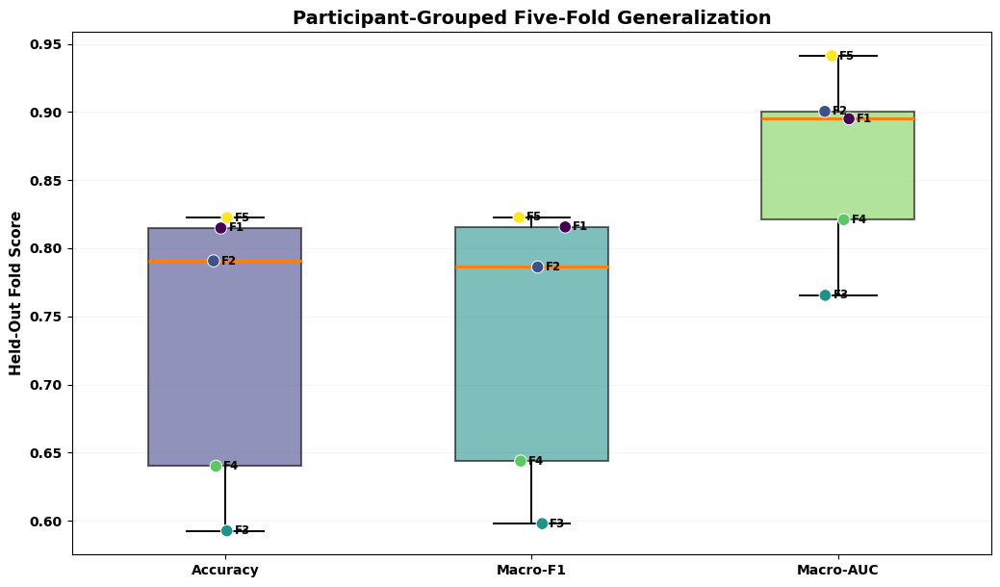

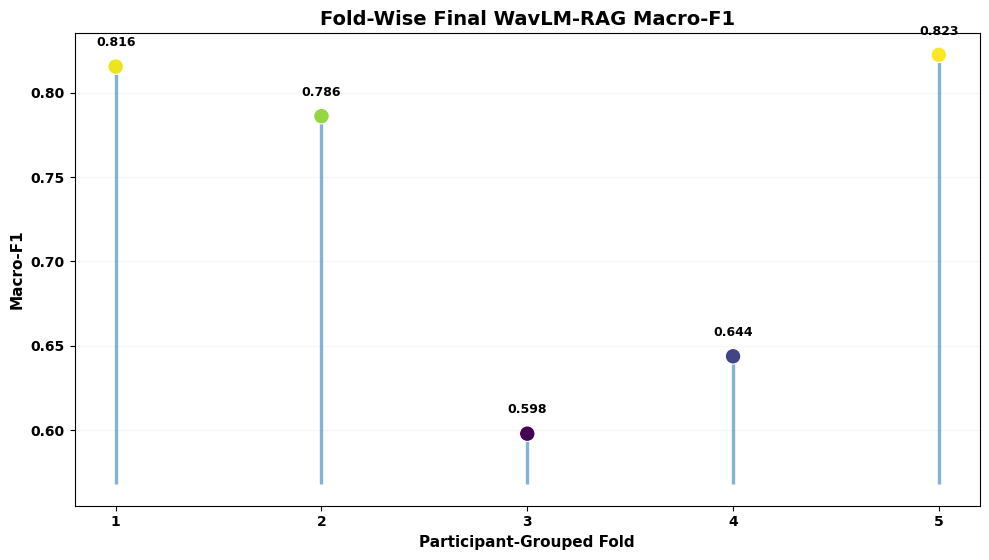

In [42]:
# Journal-style grouped-CV boxplots
if CFG["run_grouped_cv"] and "grouped_cv_df" in globals():

    metrics_for_box = {
        "Accuracy": grouped_cv_df["accuracy"].astype(float).values,
        "Macro-F1": grouped_cv_df["macro_f1"].astype(float).values,
        "Macro-AUC": grouped_cv_df["roc_auc_macro_ovr"].astype(float).values,
    }

    fig, ax = plt.subplots(figsize=(10.5, 6.2))

    bp = ax.boxplot(
        list(metrics_for_box.values()),
        labels=list(metrics_for_box.keys()),
        widths=.50,
        patch_artist=True,
        showfliers=False,
        medianprops=dict(linewidth=2.2),
        boxprops=dict(linewidth=1.5),
        whiskerprops=dict(linewidth=1.4),
        capprops=dict(linewidth=1.4),
    )

    for i, box in enumerate(bp["boxes"]):
        box.set_facecolor(VIR(.20 + .30*i))
        box.set_alpha(.58)

    rng = np.random.default_rng(111)

    for i, values in enumerate(
        metrics_for_box.values(),
        start=1,
    ):
        jitter = rng.normal(
            i,
            .045,
            len(values),
        )

        ax.scatter(
            jitter,
            values,
            s=82,
            c=np.linspace(.20,.90,len(values)),
            cmap="viridis",
            edgecolor="white",
            linewidth=.7,
            zorder=3,
        )

        for xi, yi, fold in zip(
            jitter,
            values,
            grouped_cv_df.fold,
        ):
            ax.text(
                xi+.025,
                yi,
                f"F{int(fold)}",
                fontsize=8.5,
                va="center",
                weight="bold",
            )

    ax.set_ylabel("Held-Out Fold Score")
    ax.set_title(
        "Participant-Grouped Five-Fold Generalization",
        weight="bold",
    )
    ax.grid(axis="y", alpha=.13)

    savefig("20_grouped_cv_boxplot")

    # Fold-specific Macro-F1 profile
    fig, ax = plt.subplots(figsize=(10, 5.7))

    ax.scatter(
        grouped_cv_df["fold"],
        grouped_cv_df["macro_f1"],
        s=125,
        c=grouped_cv_df["macro_f1"],
        cmap="viridis",
        edgecolor="white",
        linewidth=.8,
        zorder=3,
    )

    ax.vlines(
        grouped_cv_df["fold"],
        grouped_cv_df["macro_f1"].min()-.03,
        grouped_cv_df["macro_f1"],
        lw=2.4,
        alpha=.55,
    )

    for _, row in grouped_cv_df.iterrows():
        ax.text(
            int(row.fold),
            float(row.macro_f1)+.012,
            f"{float(row.macro_f1):.3f}",
            ha="center",
            fontsize=9,
            weight="bold",
        )

    ax.set_xticks(
        grouped_cv_df["fold"].astype(int)
    )
    ax.set_xlabel("Participant-Grouped Fold")
    ax.set_ylabel("Macro-F1")
    ax.set_title(
        "Fold-Wise Final WavLM-RAG Macro-F1",
        weight="bold",
    )
    ax.grid(axis="y", alpha=.12)

    savefig("21_grouped_cv_fold_profile")

## Stage 23 — Predict Student Engagement on Frozen Test Audio

In [43]:
from IPython.display import Audio, display as ipy_display
import ipywidgets as widgets

def model_from_checkpoint(checkpoint_path, variant=None):
    variant = variant or CFG["final_variant"]
    model = build_model(
        variant
    ).to(DEVICE)

    state = safe_load(
        checkpoint_path,
        "cpu",
    )

    if state is None:
        raise RuntimeError(
            f"Checkpoint could not be loaded: {checkpoint_path}"
        )

    load_trainable_state(
        model,
        state["trainable_state"],
    )

    model.eval()
    return model

def single_batch_from_known_test_index(idx):
    row = test_manifest.reset_index(
        drop=True
    ).iloc[idx]

    wav = WAV_CACHE[
        str(row.sample_id)
    ].numpy()

    proc = feature_extractor(
        [wav],
        sampling_rate=SR,
        padding=True,
        return_attention_mask=True,
        return_tensors="pt",
    )

    return (
        row,
        wav,
        {
            "input_values": proc.input_values.to(DEVICE),
            "attention_mask": proc.attention_mask.to(DEVICE),
            "global": torch.tensor(
                G_test[idx:idx+1],
                dtype=torch.float32,
            ).to(DEVICE),
            "quality": torch.tensor(
                Q_test[idx:idx+1],
                dtype=torch.float32,
            ).to(DEVICE),
        },
    )

@torch.no_grad()
def predict_known_test_index(idx, show=True):
    row, wav, batch = (
        single_batch_from_known_test_index(idx)
    )

    probs = []
    alphas = []

    for ckpt in seed_ckpts:
        model = model_from_checkpoint(
            ckpt,
            CFG["final_variant"],
        )

        logits, extras = model(
            batch["input_values"],
            batch["attention_mask"],
            batch["global"],
            batch["quality"],
            return_extras=True,
        )

        probs.append(
            torch.softmax(
                logits,
                dim=-1,
            ).cpu().numpy()[0]
        )

        alphas.append(
            float(
                extras["alpha"]
                .cpu()
                .numpy()[0,0]
            )
        )

        del model
        gc.collect()

        if torch.cuda.is_available():
            torch.cuda.empty_cache()

    probability = np.mean(
        probs,
        axis=0,
    )

    probability = temperature_scale(
        probability[None,:],
        temperature,
    )[0]

    pred_idx = int(
        np.argmax(probability)
    )

    result = {
        "sample_id": str(row.sample_id),
        "true_class": str(row.class_code),
        "predicted_class": CLASS_NAMES[pred_idx],
        "confidence": float(
            probability[pred_idx]
        ),
        "probabilities": {
            CLASS_NAMES[i]: float(probability[i])
            for i in range(3)
        },
        "mean_residual_alpha": float(
            np.mean(alphas)
        ),
    }

    if show:
        ipy_display(
            Audio(
                wav,
                rate=SR,
            )
        )

        print(
            "True class:",
            result["true_class"],
        )
        print(
            "Predicted engagement class:",
            result["predicted_class"],
        )
        print(
            "Confidence:",
            f"{result['confidence']*100:.2f}%",
        )
        print(
            "Mean residual α:",
            f"{result['mean_residual_alpha']:.4f}",
        )

        fig, ax = plt.subplots(
            figsize=(8,2.8)
        )

        for i, name in enumerate(CLASS_NAMES):
            value = probability[i]

            ax.hlines(
                i,
                0,
                value,
                color=VIR(.20+.32*i),
                lw=2,
                alpha=.60,
            )

            ax.scatter(
                value,
                i,
                s=620*value+90,
                c=[VIR(.20+.32*i)],
                edgecolor="white",
                linewidth=.8,
            )

            ax.text(
                value+.02,
                i,
                f"{name}: {value:.3f}",
                va="center",
                fontsize=10,
            )

        ax.set_yticks(
            range(3),
            CLASS_NAMES,
        )
        ax.set_xlim(0,1)
        ax.set_xlabel("Probability")
        ax.set_title(
            "Student Engagement Probability Beads",
            weight="bold",
        )
        ax.grid(axis="x", alpha=.12)

        plt.show()

    return result

In [44]:
test_options = [
    (
        f"{row.sample_id} | true {row.class_code}",
        i,
    )
    for i,row in (
        test_manifest
        .reset_index(drop=True)
        .iterrows()
    )
]

test_dropdown = widgets.Dropdown(
    options=test_options,
    description="Test clip:",
)

classify_button = widgets.Button(
    description="Play + Classify",
    button_style="success",
)

prediction_output = widgets.Output()

def classify_selected(_):
    with prediction_output:
        prediction_output.clear_output()

        predict_known_test_index(
            test_dropdown.value,
            show=True,
        )

classify_button.on_click(
    classify_selected
)

display(
    widgets.VBox([
        test_dropdown,
        classify_button,
        prediction_output,
    ])
)

## Stage 24 — Exact 347-D Feature Extraction for a New Uploaded WAV

In [45]:
# This reproduces the dataset builder's global feature pipeline:
# 91 handcrafted descriptors + HuBERT mean/std → train-only scaler/PCA → final scaler.

from transformers import Wav2Vec2FeatureExtractor, HubertModel

N_FFT = 400
WIN_LENGTH = 400
HOP_LENGTH = 160
N_MELS = 64
N_MFCC = 20
FMIN = 50
FMAX = 7600
PYIN_FMIN = 65
PYIN_FMAX = 500
HUBERT_CHUNK_SECONDS = 8.0
HUBERT_MODEL_NAME = "facebook/hubert-base-ls960"

GLOBAL_HANDCRAFTED_NAMES = pd.read_csv(
    DATA_DIR / "global_handcrafted_feature_names.csv"
)["feature"].astype(str).tolist()

HAND_SCALER = joblib.load(
    DATA_DIR / "handcrafted_scaler_train_only.joblib"
)

HUBERT_SCALER = joblib.load(
    DATA_DIR / "hubert_scaler_train_only.joblib"
)

HUBERT_PCA = joblib.load(
    DATA_DIR / "hubert_pca_train_only.joblib"
)

FINAL_GLOBAL_SCALER = joblib.load(
    DATA_DIR / "final_global_scaler_train_only.joblib"
)

_UPLOAD_HUBERT_PROCESSOR = None
_UPLOAD_HUBERT_MODEL = None

def _stats(x, prefix, include_minmax=False):
    x = np.asarray(
        x,
        dtype=np.float32,
    ).ravel()

    x = x[
        np.isfinite(x)
    ]

    if len(x) == 0:
        values = {
            f"{prefix}_mean": 0.0,
            f"{prefix}_std": 0.0,
            f"{prefix}_median": 0.0,
            f"{prefix}_iqr": 0.0,
        }

        if include_minmax:
            values.update({
                f"{prefix}_min": 0.0,
                f"{prefix}_max": 0.0,
            })

        return values

    values = {
        f"{prefix}_mean": float(np.mean(x)),
        f"{prefix}_std": float(np.std(x)),
        f"{prefix}_median": float(np.median(x)),
        f"{prefix}_iqr": float(
            np.percentile(x,75)
            - np.percentile(x,25)
        ),
    }

    if include_minmax:
        values.update({
            f"{prefix}_min": float(np.min(x)),
            f"{prefix}_max": float(np.max(x)),
        })

    return values

def extract_global_handcrafted(y):
    d = {}

    d["duration_s"] = float(
        len(y)/SR
    )

    rms = librosa.feature.rms(
        y=y,
        frame_length=N_FFT,
        hop_length=HOP_LENGTH,
    ).flatten()

    zcr = librosa.feature.zero_crossing_rate(
        y,
        frame_length=N_FFT,
        hop_length=HOP_LENGTH,
    ).flatten()

    centroid = librosa.feature.spectral_centroid(
        y=y,
        sr=SR,
        n_fft=N_FFT,
        hop_length=HOP_LENGTH,
    ).flatten()

    bandwidth = librosa.feature.spectral_bandwidth(
        y=y,
        sr=SR,
        n_fft=N_FFT,
        hop_length=HOP_LENGTH,
    ).flatten()

    rolloff = librosa.feature.spectral_rolloff(
        y=y,
        sr=SR,
        n_fft=N_FFT,
        hop_length=HOP_LENGTH,
        roll_percent=.85,
    ).flatten()

    flatness = librosa.feature.spectral_flatness(
        y=y,
        n_fft=N_FFT,
        hop_length=HOP_LENGTH,
    ).flatten()

    d.update(
        _stats(
            rms,
            "rms",
            include_minmax=True,
        )
    )
    d.update(_stats(zcr,"zcr"))
    d.update(_stats(centroid,"centroid"))
    d.update(_stats(bandwidth,"bandwidth"))
    d.update(_stats(rolloff,"rolloff85"))
    d.update(_stats(flatness,"flatness"))

    try:
        f0, voiced_flag, _ = librosa.pyin(
            y,
            fmin=PYIN_FMIN,
            fmax=PYIN_FMAX,
            sr=SR,
            frame_length=1024,
            hop_length=HOP_LENGTH,
        )

        f0 = np.asarray(
            f0 if f0 is not None else [],
            dtype=np.float32,
        )

        voiced_flag = np.asarray(
            voiced_flag
            if voiced_flag is not None
            else [],
            dtype=np.float32,
        )
    except Exception:
        f0 = np.array([], dtype=np.float32)
        voiced_flag = np.array([], dtype=np.float32)

    voiced_f0 = f0[
        np.isfinite(f0)
        & (f0 > 0)
    ]

    d.update(
        _stats(
            voiced_f0,
            "f0_hz",
            include_minmax=True,
        )
    )

    d["voiced_ratio"] = (
        float(
            np.mean(
                voiced_flag > .5
            )
        )
        if len(voiced_flag)
        else 0.0
    )

    mel = librosa.feature.melspectrogram(
        y=y,
        sr=SR,
        n_fft=N_FFT,
        hop_length=HOP_LENGTH,
        win_length=WIN_LENGTH,
        n_mels=N_MELS,
        fmin=FMIN,
        fmax=FMAX,
        power=2.0,
    )

    logmel = librosa.power_to_db(
        mel + 1e-10,
        ref=np.max,
    )

    mfcc = librosa.feature.mfcc(
        S=logmel,
        n_mfcc=N_MFCC,
    )

    for i in range(N_MFCC):
        d[f"mfcc_{i:02d}_mean"] = float(
            np.mean(mfcc[i])
        )
        d[f"mfcc_{i:02d}_std"] = float(
            np.std(mfcc[i])
        )

    try:
        contrast = librosa.feature.spectral_contrast(
            y=y,
            sr=SR,
            n_fft=2048,
            hop_length=HOP_LENGTH,
        )

        for i in range(
            contrast.shape[0]
        ):
            d[f"contrast_{i:02d}_mean"] = float(
                np.mean(contrast[i])
            )
            d[f"contrast_{i:02d}_std"] = float(
                np.std(contrast[i])
            )
    except Exception:
        for i in range(7):
            d[f"contrast_{i:02d}_mean"] = 0.0
            d[f"contrast_{i:02d}_std"] = 0.0

    if len(rms):
        d["rms_p10"] = float(
            np.percentile(rms,10)
        )
        d["rms_p90"] = float(
            np.percentile(rms,90)
        )
        d["rms_dynamic_range"] = (
            d["rms_p90"] - d["rms_p10"]
        )
    else:
        d["rms_p10"] = 0.0
        d["rms_p90"] = 0.0
        d["rms_dynamic_range"] = 0.0

    return d

def get_upload_hubert():
    global _UPLOAD_HUBERT_PROCESSOR
    global _UPLOAD_HUBERT_MODEL

    if _UPLOAD_HUBERT_PROCESSOR is None:
        _UPLOAD_HUBERT_PROCESSOR = (
            Wav2Vec2FeatureExtractor.from_pretrained(
                HUBERT_MODEL_NAME
            )
        )

    if _UPLOAD_HUBERT_MODEL is None:
        _UPLOAD_HUBERT_MODEL = (
            HubertModel.from_pretrained(
                HUBERT_MODEL_NAME
            )
            .to(DEVICE)
        )
        _UPLOAD_HUBERT_MODEL.eval()

    return (
        _UPLOAD_HUBERT_PROCESSOR,
        _UPLOAD_HUBERT_MODEL,
    )

@torch.no_grad()
def hubert_mean_std_embedding(y):
    processor, hubert = (
        get_upload_hubert()
    )

    chunk_length = int(
        HUBERT_CHUNK_SECONDS * SR
    )

    states = []

    for start in range(
        0,
        len(y),
        chunk_length,
    ):
        chunk = y[
            start:start+chunk_length
        ]

        if len(chunk) < int(.25*SR):
            continue

        inp = processor(
            chunk,
            sampling_rate=SR,
            return_tensors="pt",
            padding=False,
        )

        input_values = (
            inp.input_values.to(DEVICE)
        )

        if DEVICE.type == "cuda":
            with torch.autocast(
                device_type="cuda",
                dtype=torch.float16,
            ):
                hidden = hubert(
                    input_values
                ).last_hidden_state
        else:
            hidden = hubert(
                input_values
            ).last_hidden_state

        states.append(
            hidden
            .squeeze(0)
            .float()
            .cpu()
            .numpy()
        )

    if not states:
        return np.zeros(
            1536,
            dtype=np.float32,
        )

    h = np.concatenate(
        states,
        axis=0,
    )

    embedding = np.concatenate(
        [
            h.mean(axis=0),
            h.std(axis=0),
        ],
        axis=0,
    )

    return embedding.astype(
        np.float32
    )

def exact_global_vector_from_wave(y_full):
    handcrafted = (
        extract_global_handcrafted(
            y_full
        )
    )

    hand_raw = np.array(
        [
            handcrafted[name]
            for name in GLOBAL_HANDCRAFTED_NAMES
        ],
        dtype=np.float32,
    )[None,:]

    hand_scaled = HAND_SCALER.transform(
        hand_raw
    ).astype(np.float32)

    hubert_raw = hubert_mean_std_embedding(
        y_full
    )[None,:]

    hubert_scaled = HUBERT_SCALER.transform(
        hubert_raw
    )

    hubert_pca = HUBERT_PCA.transform(
        hubert_scaled
    ).astype(np.float32)

    combined = np.concatenate(
        [hand_scaled, hubert_pca],
        axis=1,
    )

    final_global = FINAL_GLOBAL_SCALER.transform(
        combined
    ).astype(np.float32)

    if final_global.shape[1] != GLOBAL_DIM:
        raise ValueError(
            f"Generated global dim "
            f"{final_global.shape[1]} "
            f"!= expected {GLOBAL_DIM}"
        )

    return final_global

## Stage 25 — Quality Vector and Arbitrary WAV Classification

In [46]:
def quality_vector_from_path(path):
    if QUALITY_COLS == ["quality_dummy"]:
        return np.zeros(
            (1,1),
            dtype=np.float32,
        )

    info = sf.info(path)

    y_native, _ = sf.read(
        path,
        always_2d=False,
    )

    y_native = np.asarray(
        y_native
    )

    if y_native.ndim > 1:
        mono = y_native.mean(axis=1)
    else:
        mono = y_native

    mono = mono.astype(
        np.float32,
        copy=False,
    )

    peak = float(
        np.max(np.abs(mono))
    ) if len(mono) else 0.0

    rms_full = float(
        np.sqrt(
            np.mean(
                np.square(mono)
            )
        )
    ) if len(mono) else 0.0

    clipping_ratio = float(
        np.mean(
            np.abs(mono) >= .999
        )
    ) if len(mono) else 0.0

    frame_rms = librosa.feature.rms(
        y=mono,
        frame_length=min(
            2048,
            max(256,len(mono)),
        ),
        hop_length=512,
    ).flatten()

    if len(frame_rms):
        threshold = max(
            np.percentile(
                frame_rms,
                20,
            )*.5,
            1e-6,
        )

        silence_ratio = float(
            np.mean(
                frame_rms <= threshold
            )
        )
    else:
        silence_ratio = 1.0

    values = {
        "duration_s": float(info.duration),
        "rms_full": rms_full,
        "peak_abs": peak,
        "silence_ratio_proxy": silence_ratio,
        "clipping_ratio": clipping_ratio,
    }

    q = np.array(
        [
            values[c]
            for c in QUALITY_COLS
        ],
        dtype=np.float32,
    )[None,:]

    q = np.nan_to_num(
        (q-q_mu)/q_sd
    ).astype(np.float32)

    return q

@torch.no_grad()
def predict_arbitrary_wav(
    audio_path,
    show=True,
):
    audio_path = Path(audio_path)

    y_full = load_audio_full(
        audio_path
    )

    global_vector = (
        exact_global_vector_from_wave(
            y_full
        )
    )

    # HuBERT is needed only to reproduce the stored 347-D feature pipeline.
    # Release it before loading the WavLM ensemble.
    global _UPLOAD_HUBERT_MODEL, _UPLOAD_HUBERT_PROCESSOR
    if _UPLOAD_HUBERT_MODEL is not None:
        del _UPLOAD_HUBERT_MODEL
        _UPLOAD_HUBERT_MODEL = None
    _UPLOAD_HUBERT_PROCESSOR = None
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    q = quality_vector_from_path(
        audio_path
    )

    y_wavlm = center_crop_8s(
        y_full
    )

    proc = feature_extractor(
        [y_wavlm],
        sampling_rate=SR,
        padding=True,
        return_attention_mask=True,
        return_tensors="pt",
    )

    batch = {
        "input_values": proc.input_values.to(DEVICE),
        "attention_mask": proc.attention_mask.to(DEVICE),
        "global": torch.tensor(
            global_vector,
            dtype=torch.float32,
        ).to(DEVICE),
        "quality": torch.tensor(
            q,
            dtype=torch.float32,
        ).to(DEVICE),
    }

    probs = []
    alphas = []

    for ckpt in seed_ckpts:
        model = model_from_checkpoint(
            ckpt,
            CFG["final_variant"],
        )

        logits, extras = model(
            batch["input_values"],
            batch["attention_mask"],
            batch["global"],
            batch["quality"],
            return_extras=True,
        )

        probs.append(
            torch.softmax(
                logits,
                dim=-1,
            ).cpu().numpy()[0]
        )

        alphas.append(
            float(
                extras["alpha"]
                .cpu()
                .numpy()[0,0]
            )
        )

        del model
        gc.collect()

        if torch.cuda.is_available():
            torch.cuda.empty_cache()

    probability = np.mean(
        probs,
        axis=0,
    )

    probability = temperature_scale(
        probability[None,:],
        temperature,
    )[0]

    pred_idx = int(
        probability.argmax()
    )

    result = {
        "predicted_class": CLASS_NAMES[pred_idx],
        "confidence": float(
            probability[pred_idx]
        ),
        "probabilities": {
            CLASS_NAMES[i]: float(probability[i])
            for i in range(3)
        },
        "mean_residual_alpha": float(
            np.mean(alphas)
        ),
    }

    if show:
        ipy_display(
            Audio(
                y_full,
                rate=SR,
            )
        )

        print(
            "Predicted student engagement class:",
            result["predicted_class"],
        )

        print(
            "Confidence:",
            f"{result['confidence']*100:.2f}%",
        )

        print(
            "Class probabilities:",
            {
                k:f"{v*100:.2f}%"
                for k,v in result[
                    "probabilities"
                ].items()
            },
        )

        print(
            "Mean residual α:",
            f"{result['mean_residual_alpha']:.4f}",
        )

        fig, ax = plt.subplots(
            figsize=(8,2.8)
        )

        for i, name in enumerate(CLASS_NAMES):
            value = probability[i]

            ax.hlines(
                i,
                0,
                value,
                color=VIR(.20+.32*i),
                lw=2,
                alpha=.60,
            )

            ax.scatter(
                value,
                i,
                s=620*value+90,
                c=[VIR(.20+.32*i)],
                edgecolor="white",
                linewidth=.8,
            )

            ax.text(
                value+.02,
                i,
                f"{name}: {value:.3f}",
                va="center",
                fontsize=10,
            )

        ax.set_yticks(
            range(3),
            CLASS_NAMES,
        )
        ax.set_xlim(0,1)
        ax.set_xlabel("Probability")
        ax.set_title(
            "Uploaded-Audio Engagement Probability Beads",
            weight="bold",
        )
        ax.grid(axis="x", alpha=.12)

        plt.show()

    return result

In [47]:
from google.colab import files

def upload_and_predict():
    uploaded = files.upload()

    if not uploaded:
        print("No file uploaded.")
        return None

    result = None

    for filename, content in uploaded.items():
        local_path = (
            Path("/content") / filename
        )

        local_path.write_bytes(
            content
        )

        print(
            "\nClassifying:",
            filename,
        )

        result = predict_arbitrary_wav(
            local_path,
            show=True,
        )

    return result

print("Run upload_and_predict() to classify a new WAV file.")

Run upload_and_predict() to classify a new WAV file.


## Stage 26 — Final Export

In [48]:
summary = {
    "model": "WavLM-RAG",
    "final_variant": CFG["final_variant"],
    "supcon_used_in_final_model": False,
    "wavlm_model": CFG["model_name"],
    "classes": CLASS_NAMES,
    "global_dimension": int(GLOBAL_DIM),
    "split_sha256": saved_hash,

    "train_samples": int(len(train_manifest)),
    "validation_samples": int(len(val_manifest)),
    "test_samples": int(len(test_manifest)),

    "train_participants": int(
        train_manifest.participant.nunique()
    ),
    "validation_participants": int(
        val_manifest.participant.nunique()
    ),
    "test_participants": int(
        test_manifest.participant.nunique()
    ),

    "five_seed_mean_accuracy": float(
        seed_df.accuracy.mean()
    ),
    "five_seed_std_accuracy": float(
        seed_df.accuracy.std(ddof=1)
    ),
    "five_seed_mean_macro_f1": float(
        seed_df.macro_f1.mean()
    ),
    "five_seed_std_macro_f1": float(
        seed_df.macro_f1.std(ddof=1)
    ),

    "ensemble_metrics": ensemble_metrics,
    "validation_temperature": float(
        temperature
    ),

    "grouped_cv_executed": bool(
        CFG["run_grouped_cv"]
    ),

    "grouped_cv_summary": (
        grouped_cv_summary
        if (
            CFG["run_grouped_cv"]
            and "grouped_cv_summary" in globals()
        )
        else None
    ),
}

json.dump(
    summary,
    open(
        RESULTS
        / "final_summary.json",
        "w",
    ),
    indent=2,
)

zip_path = (
    ROOT
    / "WavLM_RAG_Final_NoSupCon_Results.zip"
)

if zip_path.exists():
    zip_path.unlink()

shutil.make_archive(
    str(zip_path.with_suffix("")),
    "zip",
    RESULTS,
)

print(
    json.dumps(
        summary,
        indent=2,
    )
)

print(
    "Results ZIP:",
    zip_path,
)

{
  "model": "WavLM-RAG",
  "final_variant": "no_supcon",
  "supcon_used_in_final_model": false,
  "wavlm_model": "microsoft/wavlm-base-plus",
  "classes": [
    "H",
    "L",
    "P"
  ],
  "global_dimension": 347,
  "split_sha256": "df860201d0c2ea8a4985fe219043b9c50c5e69723b0012d6caa90800cfa2d8c7",
  "train_samples": 281,
  "validation_samples": 60,
  "test_samples": 60,
  "train_participants": 41,
  "validation_participants": 9,
  "test_participants": 9,
  "five_seed_mean_accuracy": 0.7966666666666666,
  "five_seed_std_accuracy": 0.04772607021092119,
  "five_seed_mean_macro_f1": 0.7980445983354469,
  "five_seed_std_macro_f1": 0.046384740023274196,
  "ensemble_metrics": {
    "accuracy": 0.8333333333333334,
    "balanced_accuracy": 0.8333333333333334,
    "macro_precision": 0.835547201336675,
    "macro_recall": 0.8333333333333334,
    "macro_f1": 0.8340942255576401,
    "weighted_f1": 0.8340942255576402,
    "log_loss": 0.48939604276770343,
    "roc_auc_macro_ovr": 0.934583333333333